# XPCS&XSVS Pipeline for Mulit-SAXS|Gi-SAXS Runs
"This notebook corresponds to version {{ version }} of the pipeline tool: https://github.com/NSLS-II/pipelines"

This notebook begins with a raw time-series of images and ends with $g_2(t)$ for a range of $q$, fit to an exponential or stretched exponential, and a two-time correlation functoin.

## Overview

* Setup: load packages/setup path
* Load Metadata & Image Data
* Apply Mask
* Clean Data: shutter open/bad frames
* Get Q-Map
* Get 1D curve
* Define Q-ROI (qr, qz)
* Check beam damage
* One-time Correlation
* Fitting
* Two-time Correlation
The important scientific code is imported from the [chxanalys](https://github.com/yugangzhang/chxanalys/tree/master/chxanalys) and [scikit-beam](https://github.com/scikit-beam/scikit-beam) project. Refer to chxanalys and scikit-beam for additional documentation and citation information.

## CHX Olog NoteBook
CHX Olog (https://logbook.nsls2.bnl.gov/11-ID/)

## Setup

Import packages for I/O, visualization, and analysis.

In [457]:
from chxanalys.chx_packages import *
from chxanalys.chx_xpcs_xsvs_jupyter_V1 import run_xpcs_xsvs_single
%matplotlib notebook
plt.rcParams.update({'figure.max_open_warning': 0})
#%reset -f  #for clean up things in the memory

## Control Multi-Runs Parameters

In [458]:
scat_geometry = 'saxs'  #suport 'saxs', 'gi_saxs', 'ang_saxs' (for anisotropics saxs or flow-xpcs)
#scat_geometry = 'saxs'  #suport 'saxs', 'gi_saxs', 'ang_saxs' (for anisotropics saxs or flow-xpcs)

force_compress = False #True   #force to compress data 
para_compress = True    #parallel compress
run_fit_form = False    #run fit form factor 
run_waterfall = True #False   #run waterfall analysis
run_t_ROI_Inten = True  #run  ROI intensity as a function of time
run_one_time = True  #run  one-time
#run_fit_g2 = True       #run  fit one-time, the default function is "stretched exponential"
fit_g2_func = 'stretched'
run_two_time = True #False #True #True #False    #run  two-time
run_four_time = False #True #False   #run  four-time
run_xsvs= False #True #False         #run visibility analysis
att_pdf_report = True    #attach the pdf report to CHX olog
qth_interest = 1      #the intested single qth             
use_sqnorm = False    #if True, use sq to normalize intensity
use_imgsum_norm=True  #if True use imgsum to normalize intensity for one-time calculatoin
pdf_version='_1'     #for pdf report name
if scat_geometry == 'gi_saxs':run_xsvs= False 

In [459]:
taus=None;g2=None;tausb=None;g2b=None;g12b=None;taus4=None;g4=None;times_xsv=None;contrast_factorL=None;  

## Make a directory for saving results

In [460]:
CYCLE= '2017_3'  #change clycle here
username =  getpass.getuser()


#username = 'jain'

data_dir0  = create_user_folder(CYCLE, username)
print( data_dir0 )

Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
/XF11ID/analysis/2017_1/ajain/Results/


In [461]:
#give a meaningful name for this multi-uid run

uid_average =  'IL17_AuNR_05_PNIPAM_T38degC' 


data_dir = os.path.join( data_dir0, uid_average +'/')
os.makedirs(data_dir, exist_ok=True)
print ( data_dir )
uid_average = 'uid=' + uid_average

/XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/


## Load Mask
* load and plot mask if exist 
* otherwise create a mask using Mask pipeline
* Reverse the mask in y-direction due to the coordination difference between python and Eiger software
* Reverse images in y-direction
* Apply the mask

# Change these lines

In [462]:
mask_path = '/XF11ID/analysis/2017_1/masks/'
mask_name = 'Apr7_4M_SAXS16m_mask.npy'


<IPython.core.display.Javascript object>


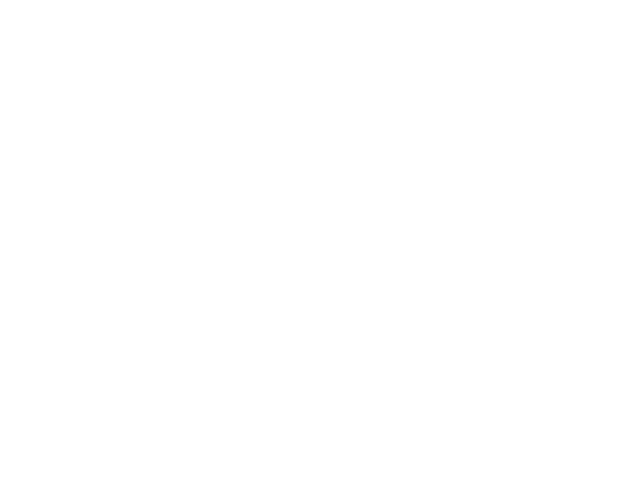

In [463]:
mask = load_mask(mask_path, mask_name, plot_ =  False, image_name = '%s_mask'%mask_name, reverse=True ) 
#mask *= pixel_mask
mask[:,2069] =0 # False  #Concluded from the previous results
#np.save(  data_dir + 'mask', mask)
show_img(mask,image_name = '%s_mask'%uid_average, save=True, path=data_dir)
mask_load=mask.copy()

## Load Metadata & Image Data

Print detector, scan-id, uid, datapath of data collected.

# Change these lines to get data

In [464]:
start_time, stop_time = '2017-4-8 00:00:00', '2017-4-8 00:16:50'
 
#start_time, stop_time = '2016-11-18  16:20:00', '2016-11-18  16:35:50' #  for gisaxs test purpose 
sids, uids, fuids = find_uids(start_time, stop_time)
print( uids )
uid = uids[0]
uidstr = 'uid=%s'%uid

Totally 10 uids are found.
['3e13b812' '8eaa5819' '869a12eb' '59f7d3c5' '675344e3' '55fced8f'
 '933472a7' '9fd0814c' 'b5f86aa9' '2d7330ca']


In [465]:
guids, buids = check_bad_uids( uids, mask, img_choice_N = 3 )
print( 'The good uids are: %s.\nThe good uids length is %s.'%(guids, len(guids)) )

The total and bad uids number are 10 and 0, repsectively.
The good uids are: ['3e13b812', '8eaa5819', '869a12eb', '59f7d3c5', '675344e3', '55fced8f', '933472a7', '9fd0814c', 'b5f86aa9', '2d7330ca'].
The good uids length is 10.


In [466]:
gfuids = fuids[np.array( [ np.where( uids ==  s )[0][0] for s in guids  ] )]

# Don't Change these lines below here

In [467]:
md = get_meta_data( uid )

In [468]:
imgs = load_data( uid, md['detector'], reverse= True  )
md.update( imgs.md );Nimg = len(imgs);
pixel_mask =  1- np.int_( np.array( imgs.md['pixel_mask'], dtype= bool)  )
print( 'The data are: %s' %imgs )
imgsa = apply_mask( imgs, mask )

The data are: Sliced and/or processed EigerImages2. Original repr:
    <Frames>
    Length: 500 frames
    Frame Shape: 2167 x 2070
    Pixel Datatype: uint16


In [469]:
print_dict( md,  ['suid', 'number of images', 'uid', 'scan_id', 'start_time', 'stop_time', 'sample', 'Measurement',
                  'acquire period', 'exposure time',  
         'det_distanc', 'beam_center_x', 'beam_center_y', ] )

suid--> 3e13b812
number of images--> 500
uid--> 3e13b812-e2b1-4069-b153-05b4a0c90822
scan_id--> 21981
start_time--> 2017-04-08 00:00:49
stop_time--> 2017-04-08 00:01:09
sample--> IL17_AuNR_05_PNIPAM
Measurement--> 750Hz 500 fr Tr 0.5 repeat: 0  sample: IL17_AuNR_05_PNIPAM
acquire period--> 0.00134
exposure time--> 0.0013299999991431832
beam_center_x--> 1095.0
beam_center_y--> 993.0


## Overwrite Some Metadata Due to Wrong Input

In [470]:
inc_x0 = None
inc_y0=  None

dpix, lambda_, Ldet,  exposuretime, timeperframe, center = check_lost_metadata(
    md, Nimg, inc_x0 = inc_x0, inc_y0=   inc_y0, pixelsize = 7.5*10*(-5) )

setup_pargs=dict(uid=uidstr, dpix= dpix, Ldet=Ldet, lambda_= lambda_, exposuretime=exposuretime,
        timeperframe=timeperframe, center=center, path= data_dir)

# Save metadata into the uid folder
* save mask file
* save the metadata dict

In [471]:
img_choice_N = 10
img_samp_index = random.sample( range(len(imgs)), img_choice_N) 
avg_img =  get_avg_img( imgsa, img_samp_index, plot_ = False, uid =uid)
if avg_img.max() == 0:
    print('There are no photons recorded fdata_diror this uid: %s'%uid)
    print('The data analysis should be terminated! Please try another uid.')

<IPython.core.display.Javascript object>


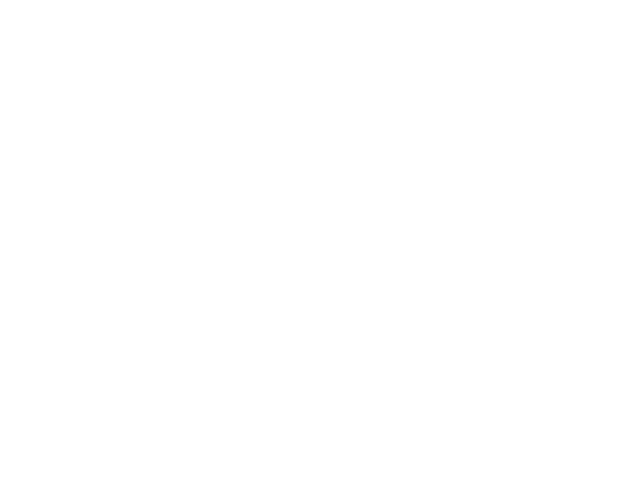

In [472]:
show_img( avg_img,  vmin=.1, vmax= 1e1, logs=True, aspect=1,
         image_name= uidstr + '_img_avg',  save=True, path=data_dir,  cmap = cmap_albula )


# Load ROI 

In [473]:
fp = data_dir0 + 'roi_mask_16rings_16m.pkl'

roi_mask,qval_dict = cpk.load( open(fp, 'rb' )  )  #for load the saved roi data

if scat_geometry =='gi_saxs':
    fp = data_dir0 + 'gisaxs_test.pkl'
    qr_map, qz_map, ticks, Qrs, Qzs,  Qr, Qz, inc_x0 = cpk.load( open(fp, 'rb' )  )


# Suppose we have all the parameters to define ROIs, if not use the "Single_Data" Pipeline

# SAXS Scattering Geometry

<IPython.core.display.Javascript object>


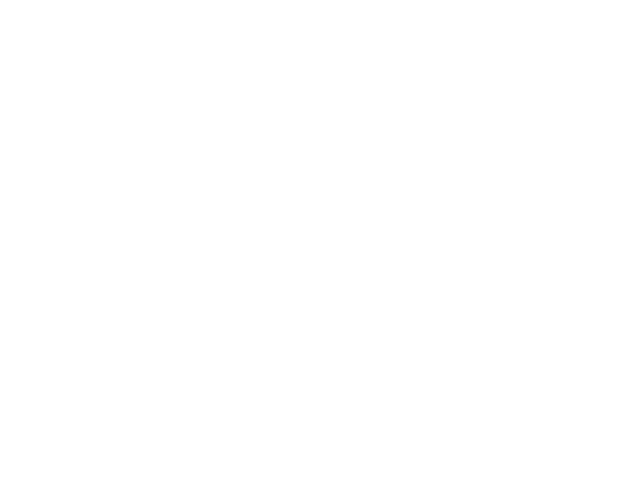

In [474]:
if scat_geometry =='saxs':
    ## Get circular average| * Do plot and save q~iq
    hmask = create_hot_pixel_mask( avg_img, threshold = 1e2, center=center, center_radius= 100)
    qp_saxs, iq_saxs, q_saxs = get_circular_average( avg_img, mask * hmask, pargs=setup_pargs  )
    plot_circular_average( qp_saxs, iq_saxs, q_saxs,  pargs=setup_pargs, 
                      xlim=[q_saxs.min(), q_saxs.max()*1.1], ylim = [iq_saxs.min(), iq_saxs.max()] )
    mask =np.array( mask * hmask, dtype=bool) 

In [475]:
if scat_geometry =='saxs':
    if run_fit_form:        
        form_res = fit_form_factor( q_saxs,iq_saxs,  guess_values={'radius': 2500, 'sigma':0.05, 
         'delta_rho':1E-10 },  fit_range=[0.0001, 0.015], fit_variables={'radius': T, 'sigma':T, 
         'delta_rho':T},  res_pargs=setup_pargs, xlim=[0.0001, 0.015])  

<IPython.core.display.Javascript object>


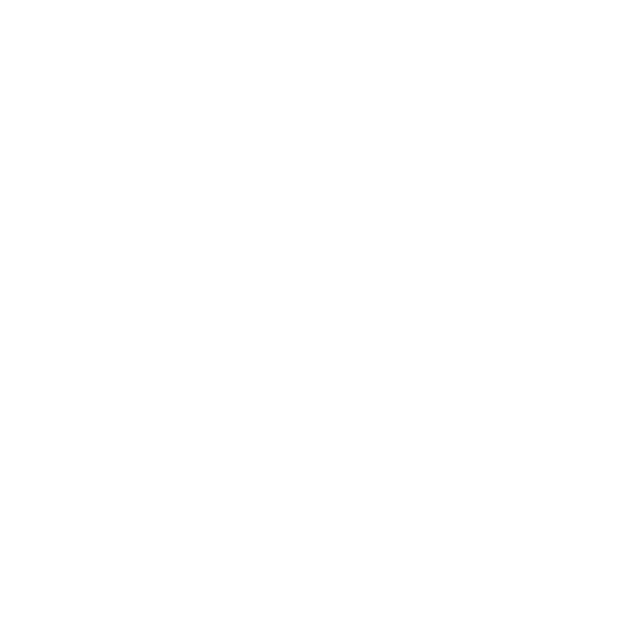

<IPython.core.display.Javascript object>


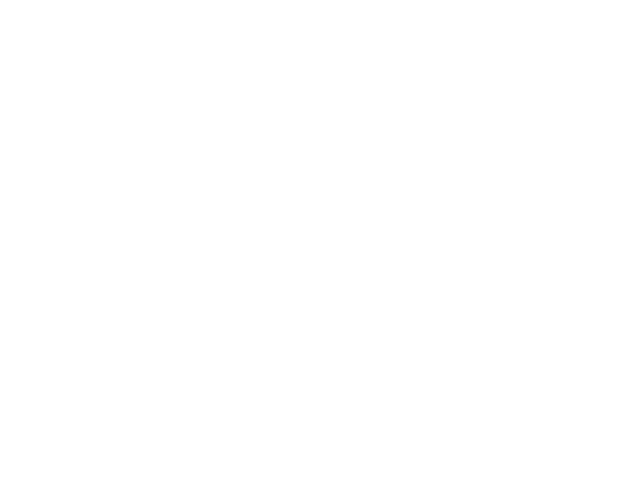

In [476]:
if scat_geometry =='saxs':    
    if run_fit_form:        
        form_res = fit_form_factor( q_saxs,iq_saxs,  guess_values={'radius': 2500, 'sigma':0.05, 
         'delta_rho':1E-10 },  fit_range=[0.0001, 0.015], fit_variables={'radius': T, 'sigma':T, 
         'delta_rho':T},  res_pargs=setup_pargs, xlim=[0.0001, 0.015])  
    qr = np.array( [qval_dict[k][0] for k in sorted( qval_dict.keys())] )
    show_ROI_on_image( avg_img, roi_mask, center, label_on = False, rwidth = 1340, alpha=.9,  
                     save=True, path=data_dir, uid=uidstr, vmin= np.min(avg_img), vmax= np.max(avg_img),
                     aspect=1) 
    plot_qIq_with_ROI( q_saxs, iq_saxs, qr, logs=True, uid=uidstr, xlim=[0.001,0.04],
                  ylim = [iq_saxs.min(), iq_saxs.max()],  save=True, path=data_dir)

# GiSAXS Scattering Geometry

In [477]:
if scat_geometry =='gi_saxs':    
    plot_qzr_map(  qr_map, qz_map, inc_x0, ticks = ticks, data= avg_img, uid= uidstr, path = data_dir   )

## Static Analysis for gisaxs

In [478]:
if scat_geometry =='gi_saxs':
    roi_masks, qval_dicts = get_gisaxs_roi( Qrs, Qzs, qr_map, qz_map, mask= mask )
    show_qzr_roi( avg_img, roi_masks, inc_x0, ticks[:4], alpha=0.5, save=True, path=data_dir, uid=uidstr )

In [479]:
if  scat_geometry =='gi_saxs':    
    Nimg = FD.end - FD.beg 
    time_edge = create_time_slice( N= Nimg, slice_num= 3, slice_width= 2, edges = None )
    time_edge =  np.array( time_edge ) + good_start
    print( time_edge )    
    qrt_pds = get_t_qrc( FD, time_edge, Qrs, Qzs, qr_map, qz_map, path=data_dir, uid = uidstr )    
    plot_qrt_pds( qrt_pds, time_edge, qz_index = 0, uid = uidstr, path =  data_dir )

# GiWAXS Scattering Geometry

In [480]:
if scat_geometry =='gi_waxs':
    badpixel = np.where( avg_img[:600,:] >=300 )
    roi_mask[badpixel] = 0
    show_ROI_on_image( avg_img, roi_mask, label_on = True,  alpha=.5,
                 save=True, path=data_dir, uid=uidstr, vmin=0.1, vmax=5)

# Configure Multi-Run

## Control Multi-Runs Parameters


In [481]:
good_start = 5

In [482]:
run_pargs=  dict(   

    scat_geometry = scat_geometry ,
    force_compress =  force_compress,    #force to compress data 
    para_compress = para_compress,             #parallel compress
    run_fit_form = run_fit_form,             #run fit form factor  
    run_waterfall = run_waterfall,             #run waterfall analysis
    run_t_ROI_Inten = run_t_ROI_Inten,          #run  ROI intensity as a function of time
    run_one_time = run_one_time,      #run  one-time
    fit_g2_func = fit_g2_func,    
    run_two_time = run_two_time,    #run  two-time
    run_four_time =  run_four_time,     #run  four-time
    run_xsvs= run_xsvs,            #run visibility analysis
    att_pdf_report = att_pdf_report,       #attach the pdf report to CHX olog
    show_plot = False,                 
    CYCLE =  CYCLE, mask_path =  mask_path, mask_name =    mask_name, 
    good_start   =  good_start,    
    qth_interest =  qth_interest, #the intested single qth,            
    use_sqnorm = use_sqnorm,  #if True, use sq to normalize intensity
    use_imgsum_norm=use_imgsum_norm,#if True use imgsum to normalize intensity for one-time calculatoin
    #pdf_version = pdf_version, #for pdf report name 
    pdf_version = '_test2',
)

add_conf = dict(  roi_mask = roi_mask, qval_dict = qval_dict ) 
if scat_geometry == 'gi_saxs':
    add_conf = dict( inc_x0=inc_x0,inc_y0=inc_y0,refl_x0=refl_x0,refl_y0=refl_y0,
                    Qr = Qr,Qz= Qz,qr_map=qr_map,qz_map= qz_map)        
run_pargs.update( add_conf )


# Do loop here

In [483]:
guids

['3e13b812',
 '8eaa5819',
 '869a12eb',
 '59f7d3c5',
 '675344e3',
 '55fced8f',
 '933472a7',
 '9fd0814c',
 'b5f86aa9',
 '2d7330ca']

In [484]:
%run /home/yuzhang/chxanalys_link/chxanalys/chx_xpcs_xsvs_jupyter_V1.py


Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 3e13b812*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/3e13b812/
The data are: Sliced and/or processed EigerImages2. Original repr:
    <Frames>
    Length: 500 frames
    Frame Shape: 2167 x 2070
    Pixel Datatype: uint16


<IPython.core.display.Javascript object>


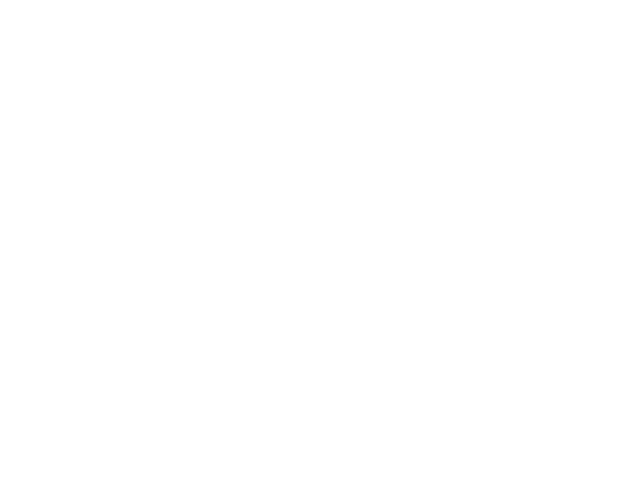

<IPython.core.display.Javascript object>


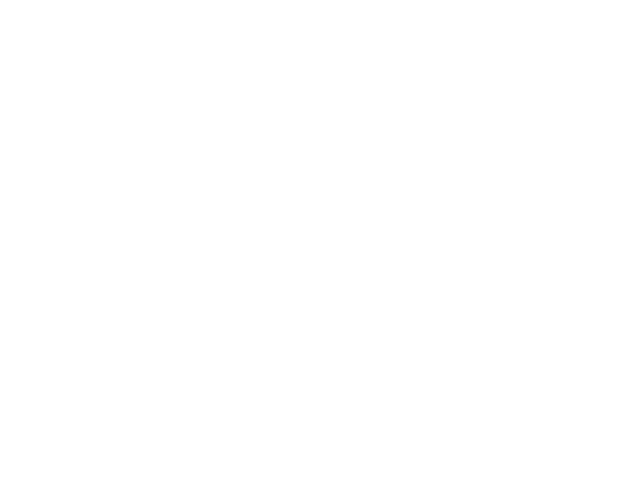

The non-zeros photon occupation is 0.012143282304394641.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_3e13b812-e2b1-4069-b153-05b4a0c90822.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####Bad frame list are: [0]
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=3e13b8_fra_5_500


<IPython.core.display.Javascript object>


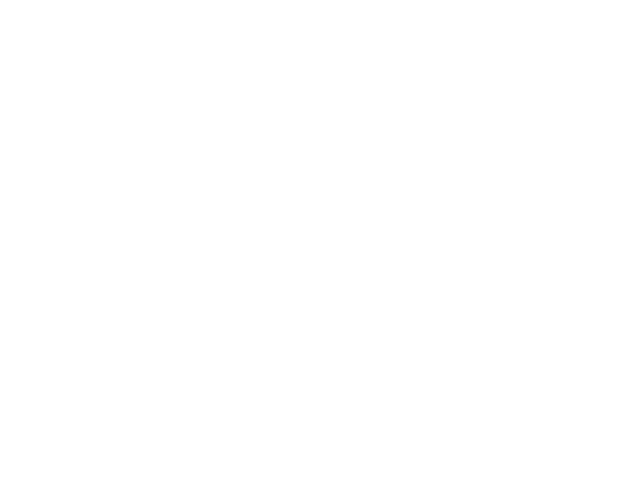

Total time: 13.506 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


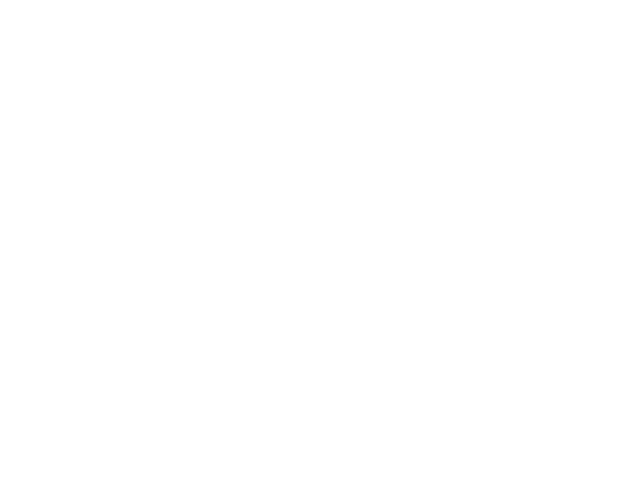

The bad frame list length is: 5


<IPython.core.display.Javascript object>


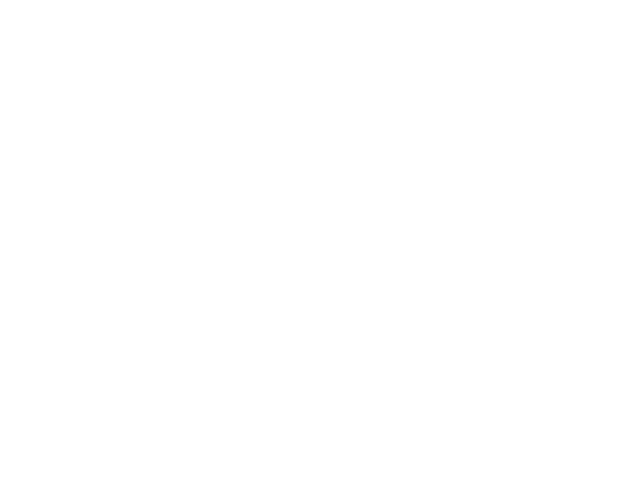

<IPython.core.display.Javascript object>


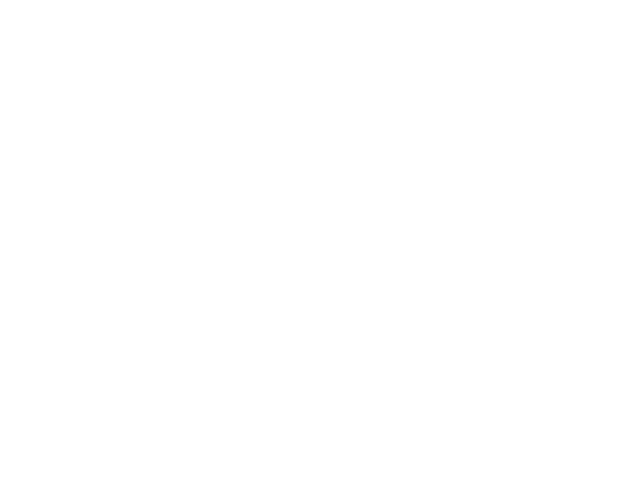

<IPython.core.display.Javascript object>


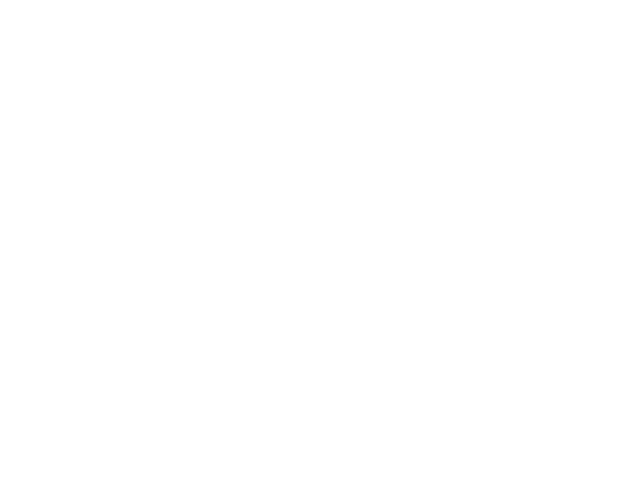

<IPython.core.display.Javascript object>


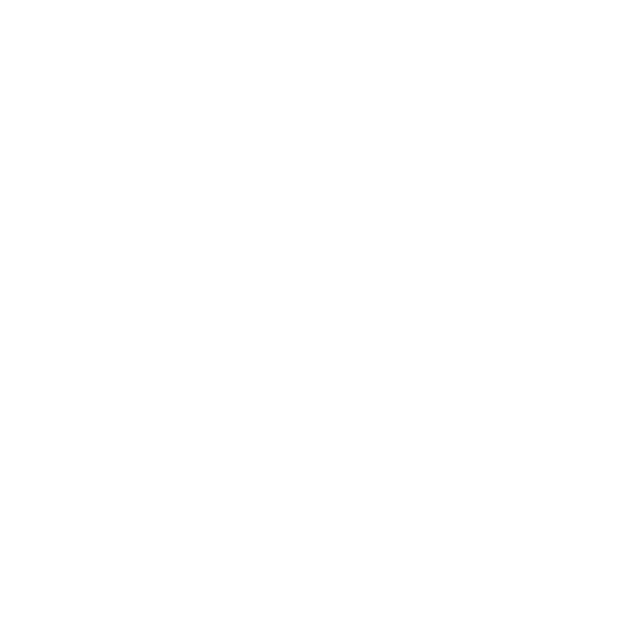

<IPython.core.display.Javascript object>


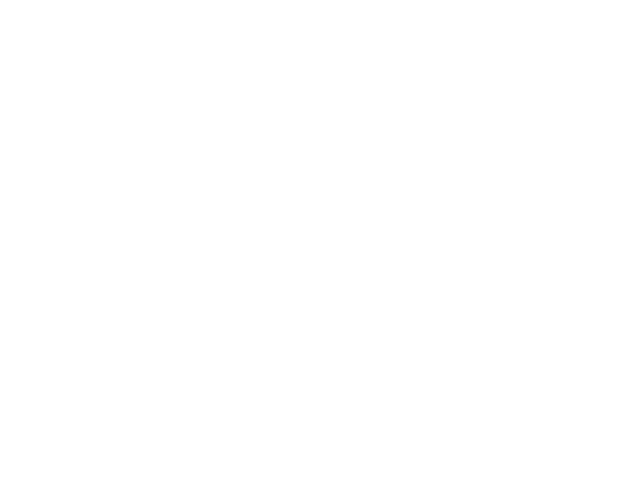

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 83.39it/s]


<IPython.core.display.Javascript object>


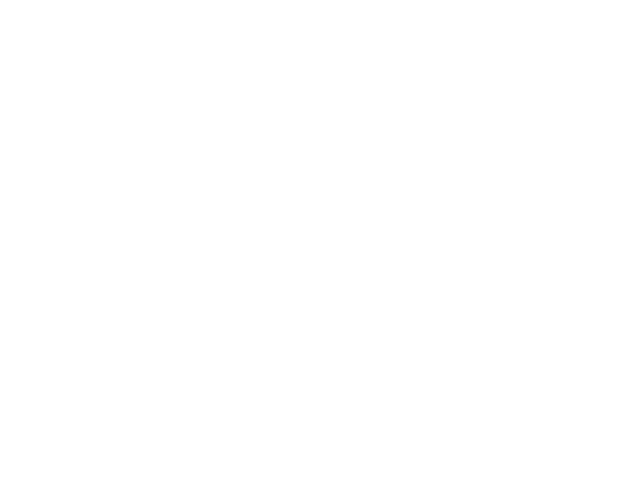

The file: uid=3e13b8_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/


<IPython.core.display.Javascript object>


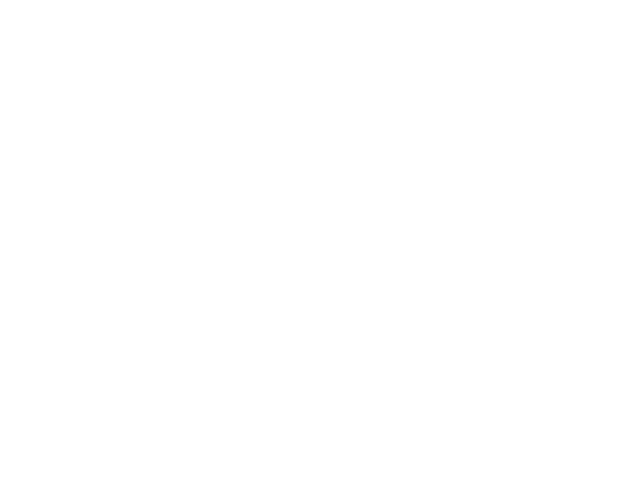

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 1269.42it/s]


<IPython.core.display.Javascript object>


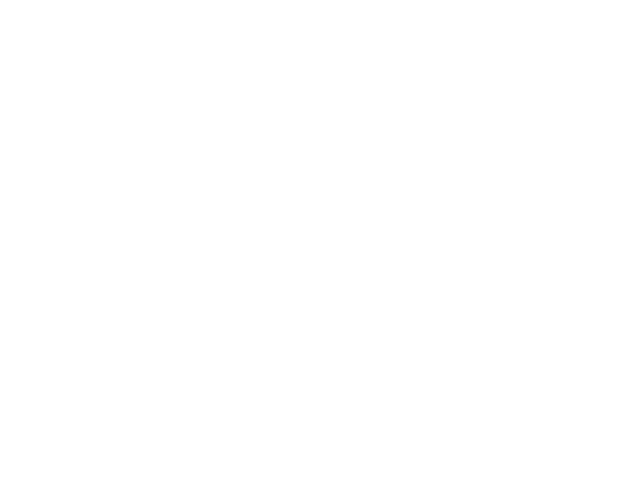

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1070.09it/s]


<IPython.core.display.Javascript object>


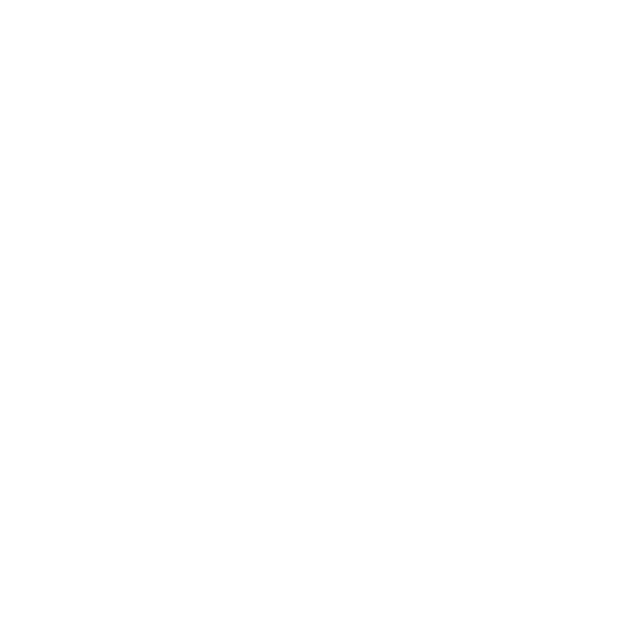

The file: uid=3e13b8_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:09<00:00,  1.62it/s]


G2 calculation DONE!
Total time: 18.017 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/ with filename as uid=3e13b8_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/uid=3e13b8_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


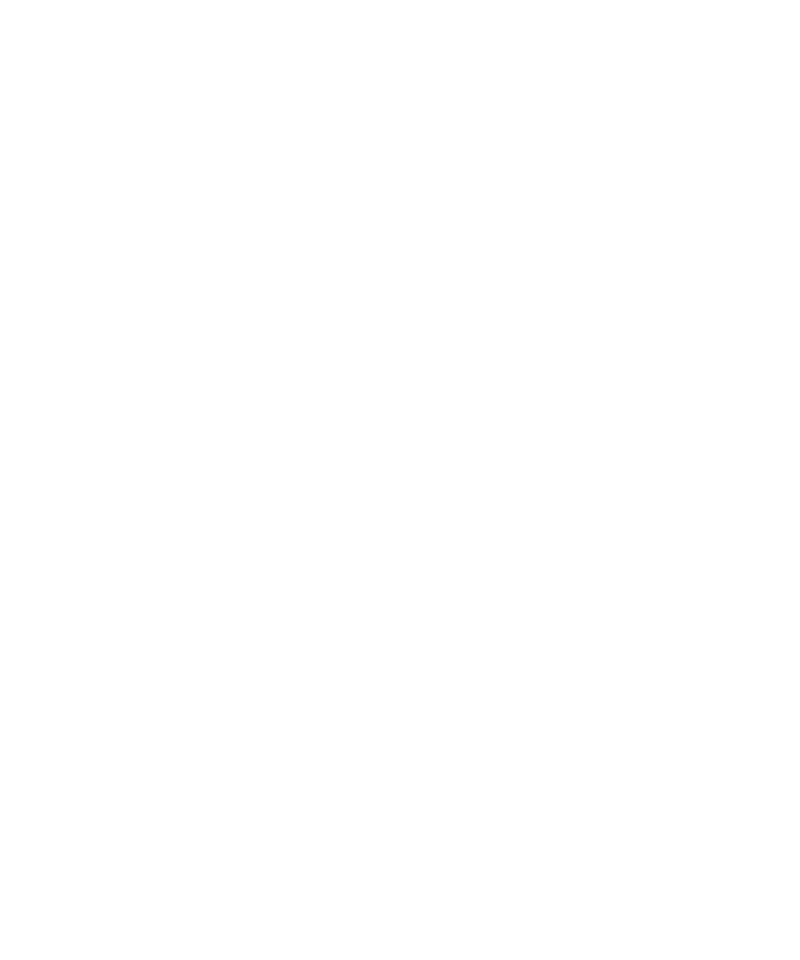

The fitted diffusion coefficient D0 is:  3.362e+05   A^2S-1


<IPython.core.display.Javascript object>


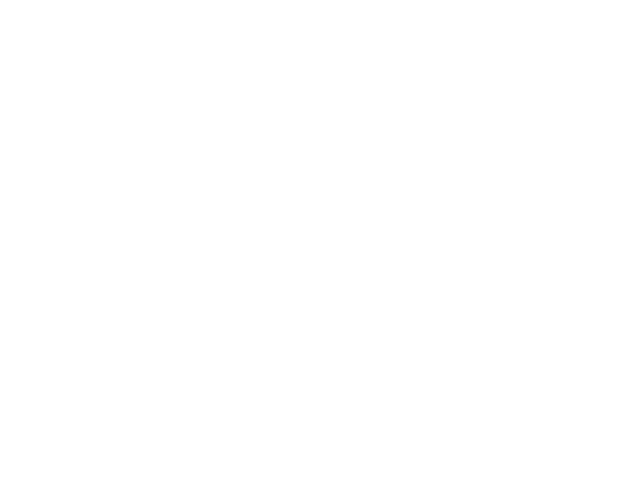

100%|██████████| 16/16 [00:06<00:00,  1.91it/s]

Total time: 7.045 sec


<IPython.core.display.Javascript object>


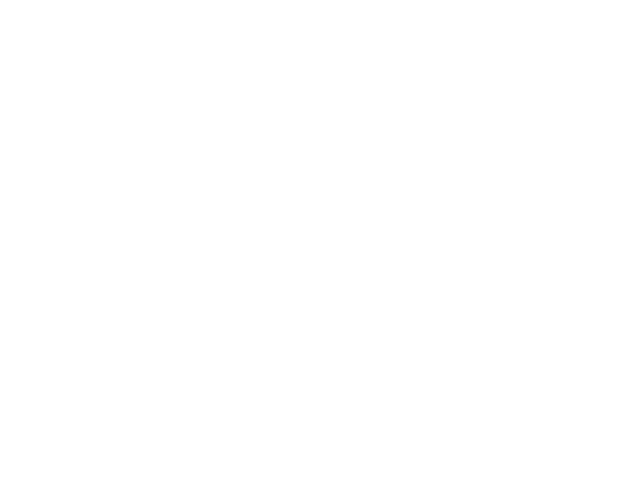

Total time: 0.093 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/ with filename as uid=3e13b8_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/3e13b812/uid=3e13b8_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.494e+05   A^2S-1


<IPython.core.display.Javascript object>


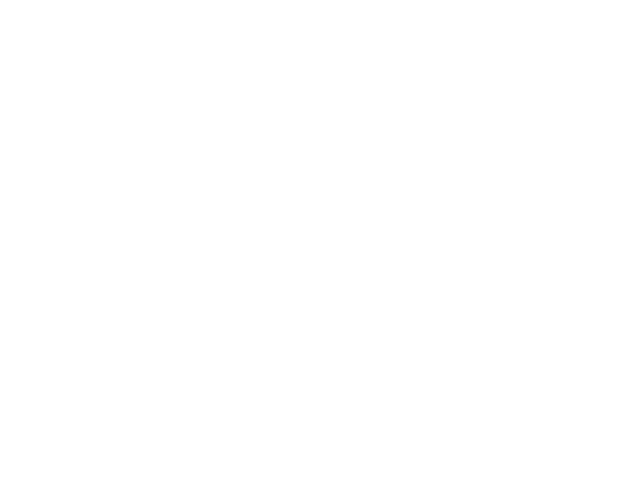

<IPython.core.display.Javascript object>


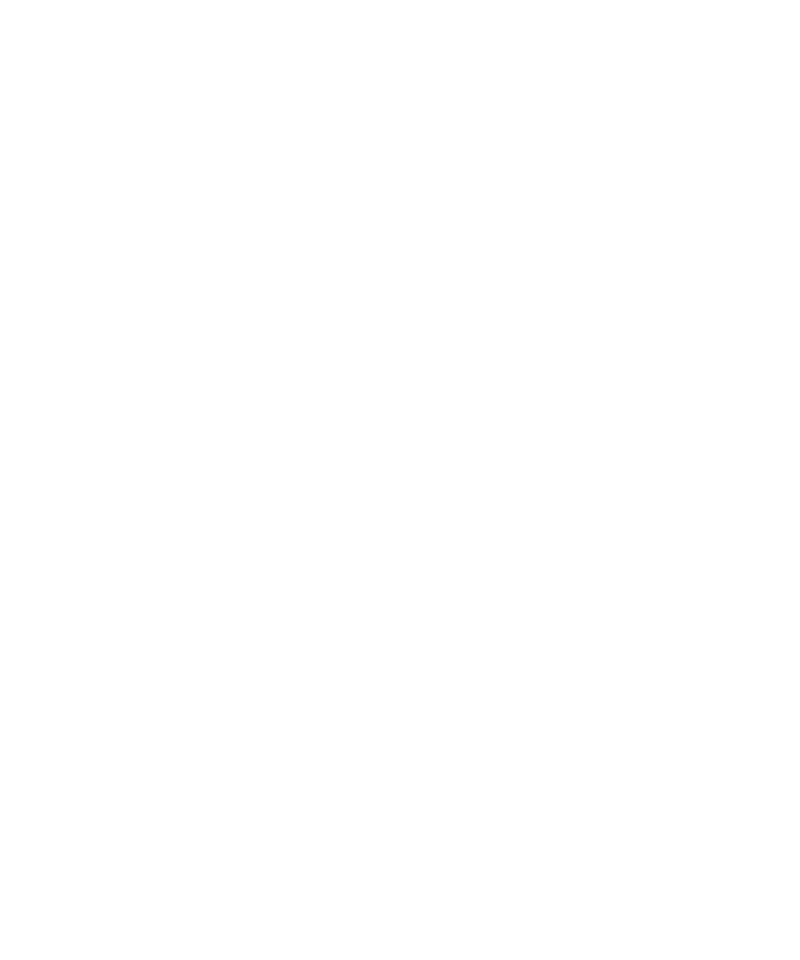

<IPython.core.display.Javascript object>


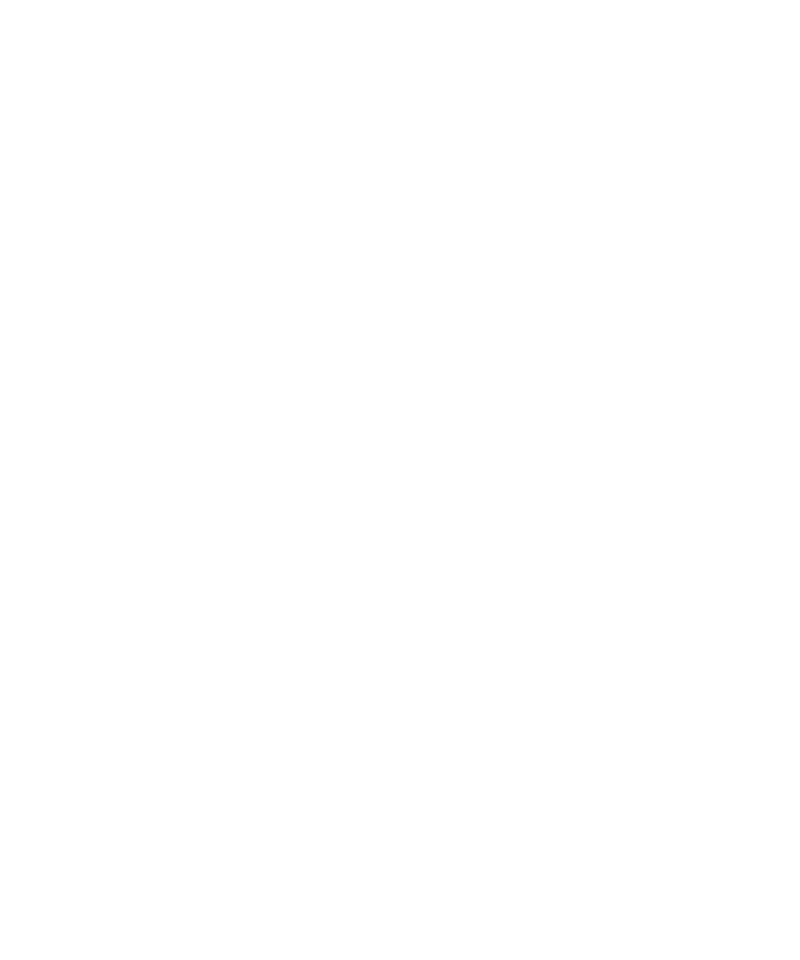

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/3e13b812/ with filename as uid=3e13b812-e2b1-4069-b153-05b4a0c90822_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/3e13b812/ 3e13b8 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=3e13b812_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=3e13b812_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 8eaa5819*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/
The data are: S

<IPython.core.display.Javascript object>


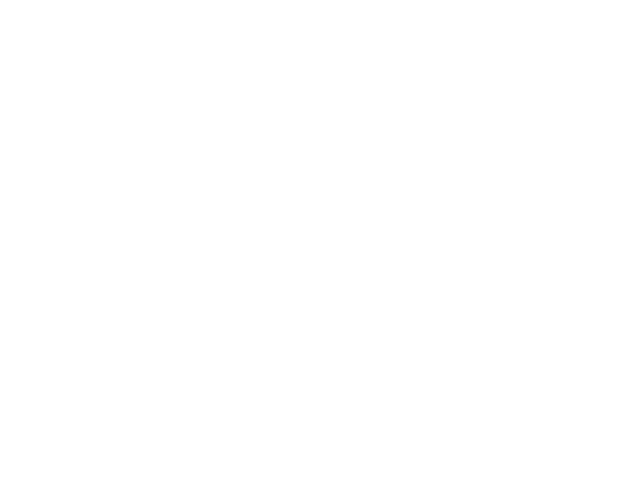

<IPython.core.display.Javascript object>


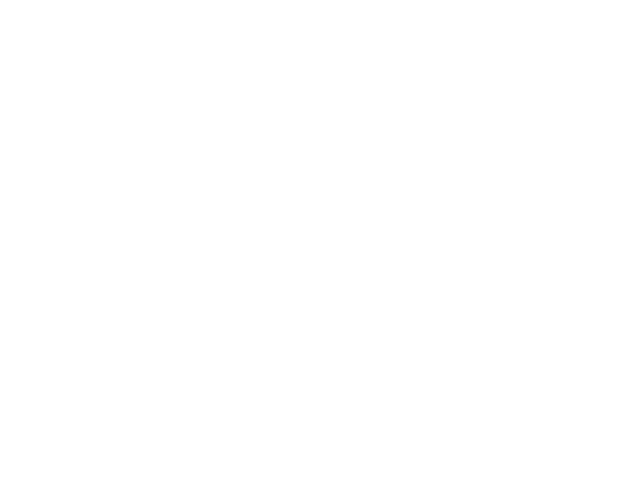

The non-zeros photon occupation is 0.010080277504687127.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_8eaa5819-c55c-47ae-b20e-8a0e9dac3e32.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=8eaa58_fra_5_500


<IPython.core.display.Javascript object>


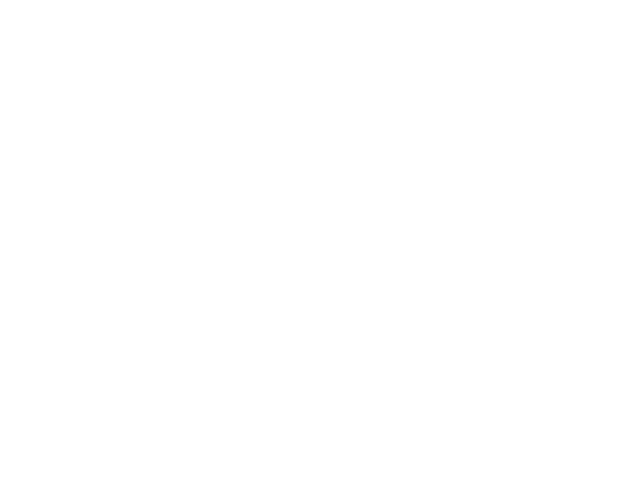

Total time: 11.872 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


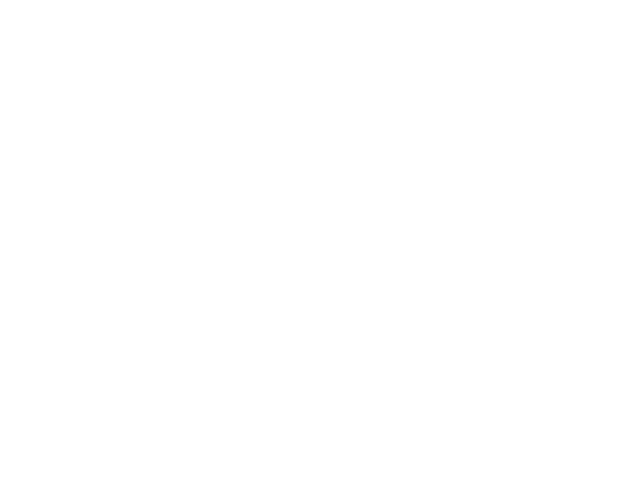

The bad frame list length is: 5


<IPython.core.display.Javascript object>


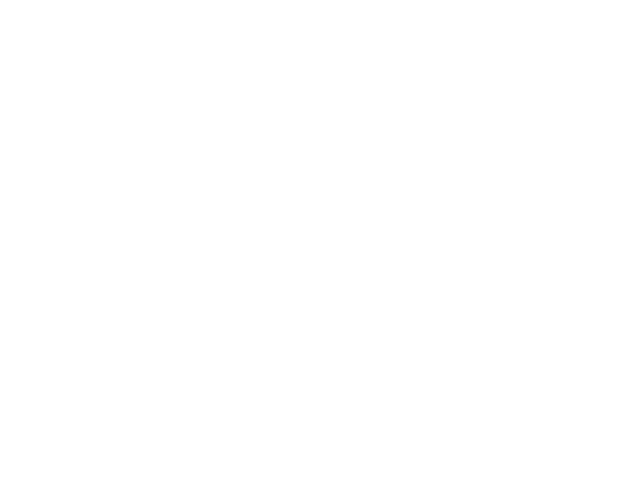

<IPython.core.display.Javascript object>


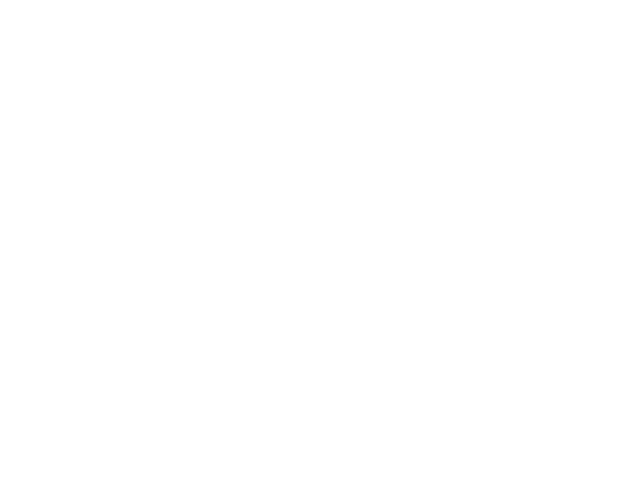

<IPython.core.display.Javascript object>


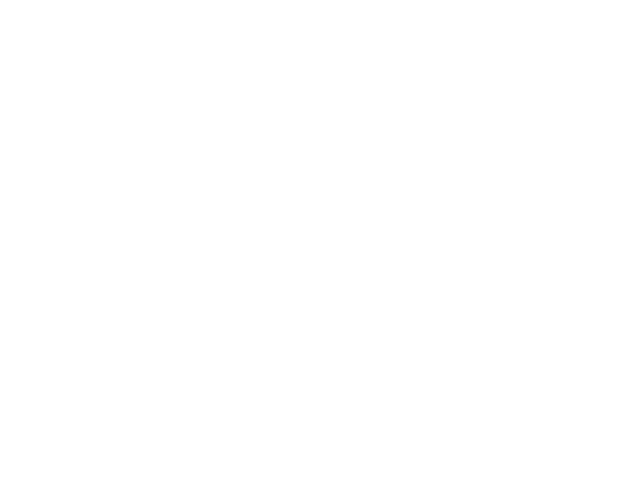

<IPython.core.display.Javascript object>


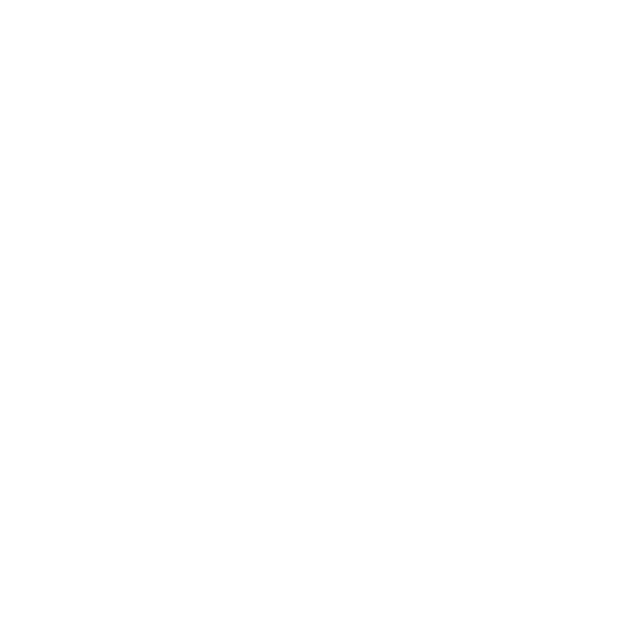

<IPython.core.display.Javascript object>


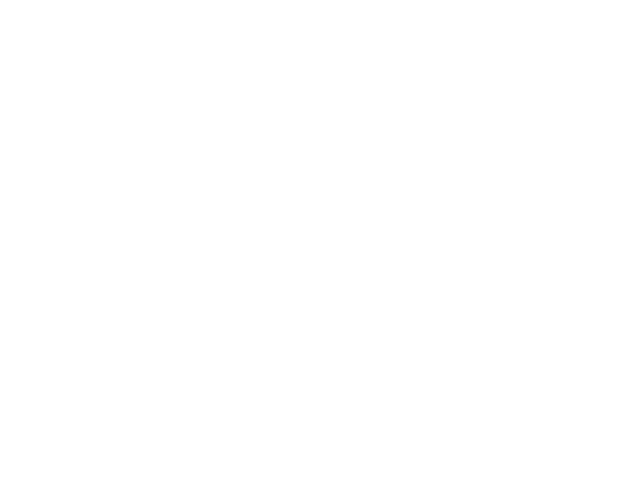

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 85.34it/s]


<IPython.core.display.Javascript object>


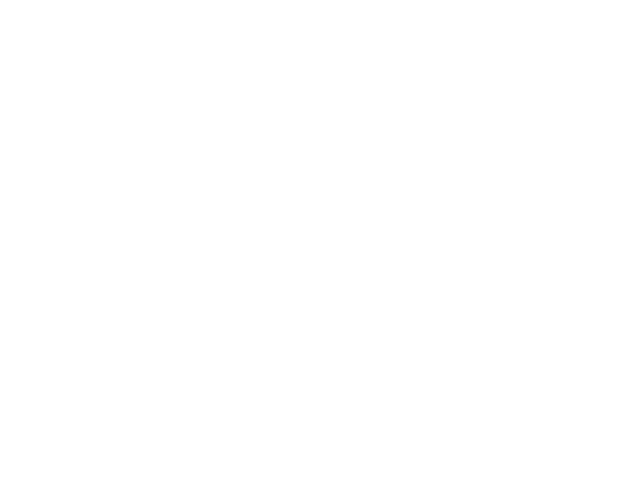

The file: uid=8eaa58_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/


<IPython.core.display.Javascript object>


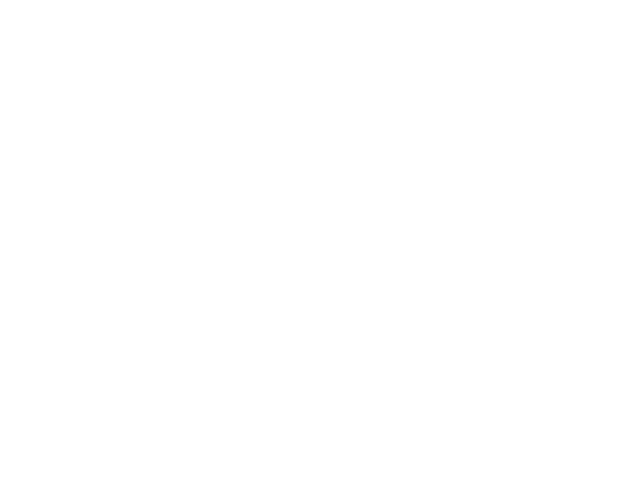

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 1841.71it/s]


<IPython.core.display.Javascript object>


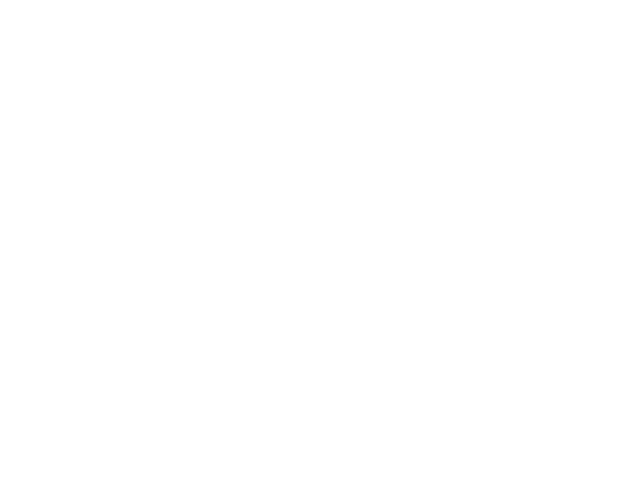

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1278.98it/s]


<IPython.core.display.Javascript object>


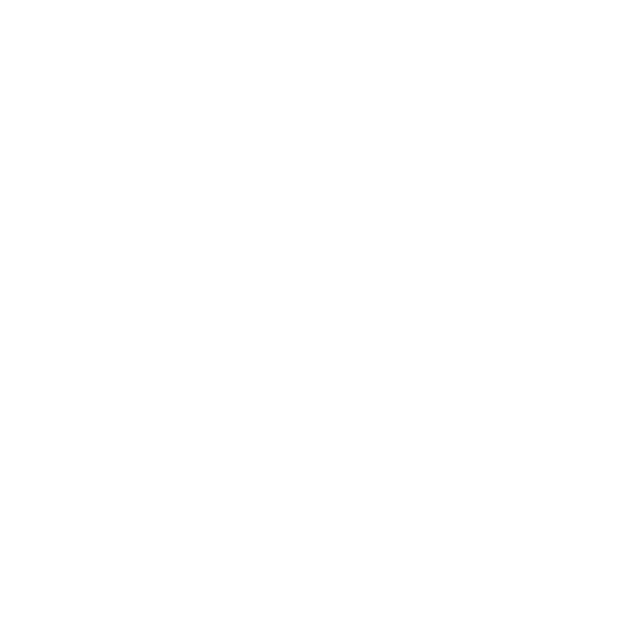

The file: uid=8eaa58_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  6%|▋         | 1/16 [00:00<00:01,  9.24it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:09<00:00,  1.61it/s]


G2 calculation DONE!
Total time: 18.693 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/ with filename as uid=8eaa58_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/uid=8eaa58_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


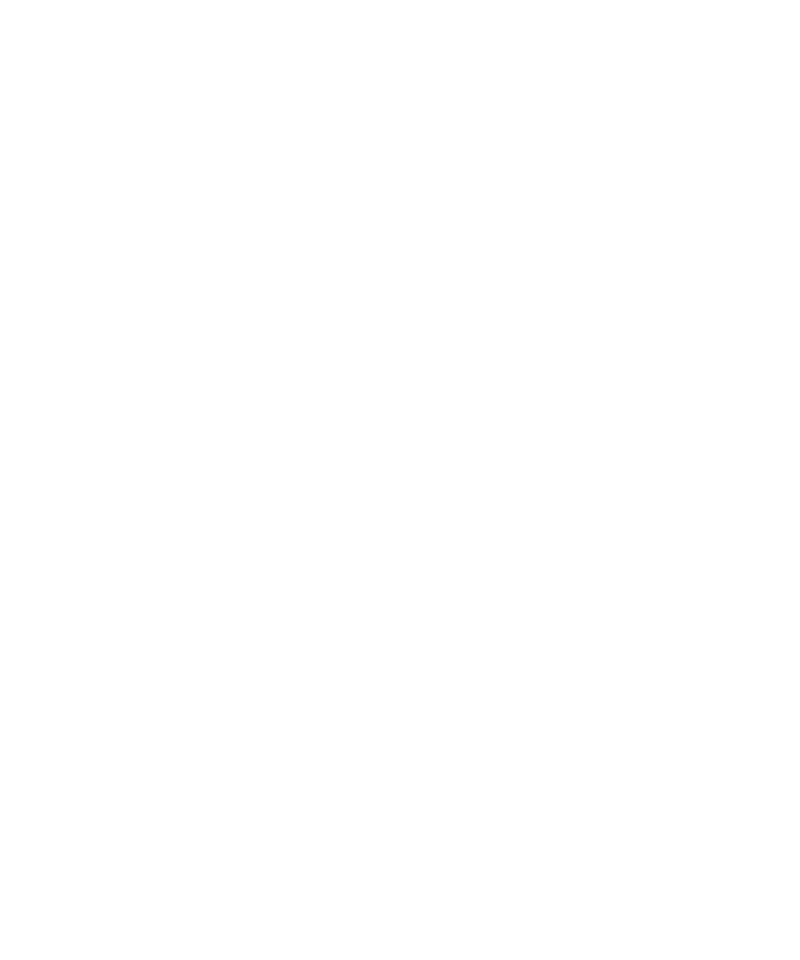

The fitted diffusion coefficient D0 is:  2.682e+05   A^2S-1


<IPython.core.display.Javascript object>


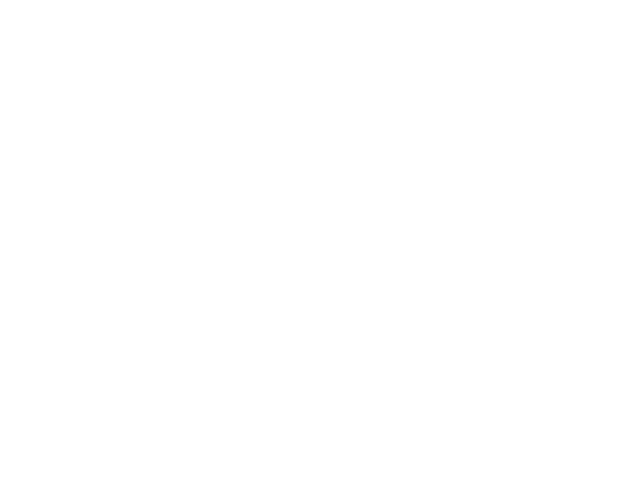

100%|██████████| 16/16 [00:06<00:00,  2.00it/s]

Total time: 6.610 sec


<IPython.core.display.Javascript object>


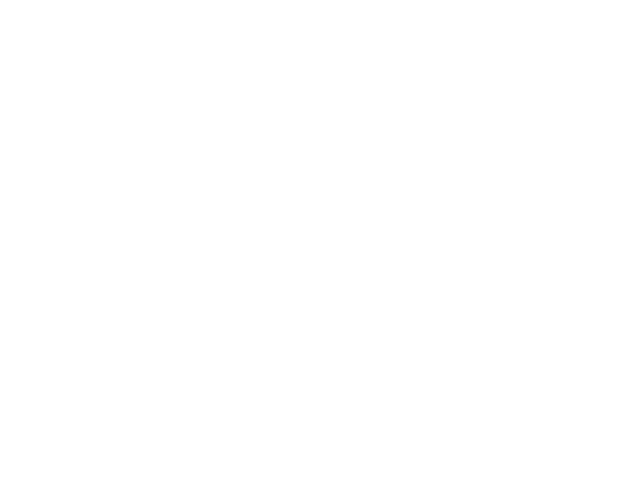

Total time: 0.046 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/ with filename as uid=8eaa58_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/uid=8eaa58_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  5.716e+05   A^2S-1


<IPython.core.display.Javascript object>


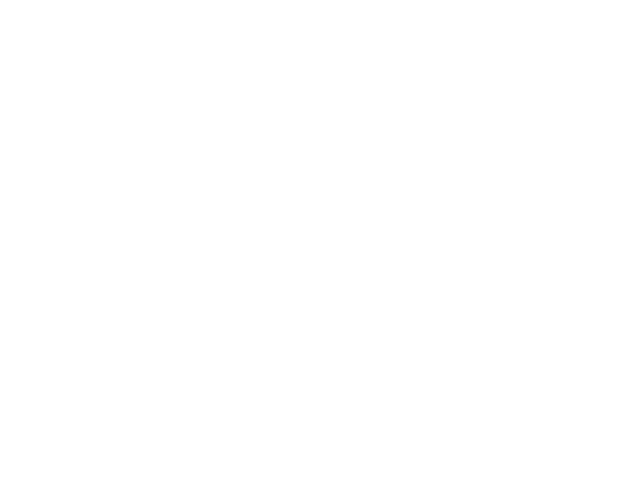

<IPython.core.display.Javascript object>


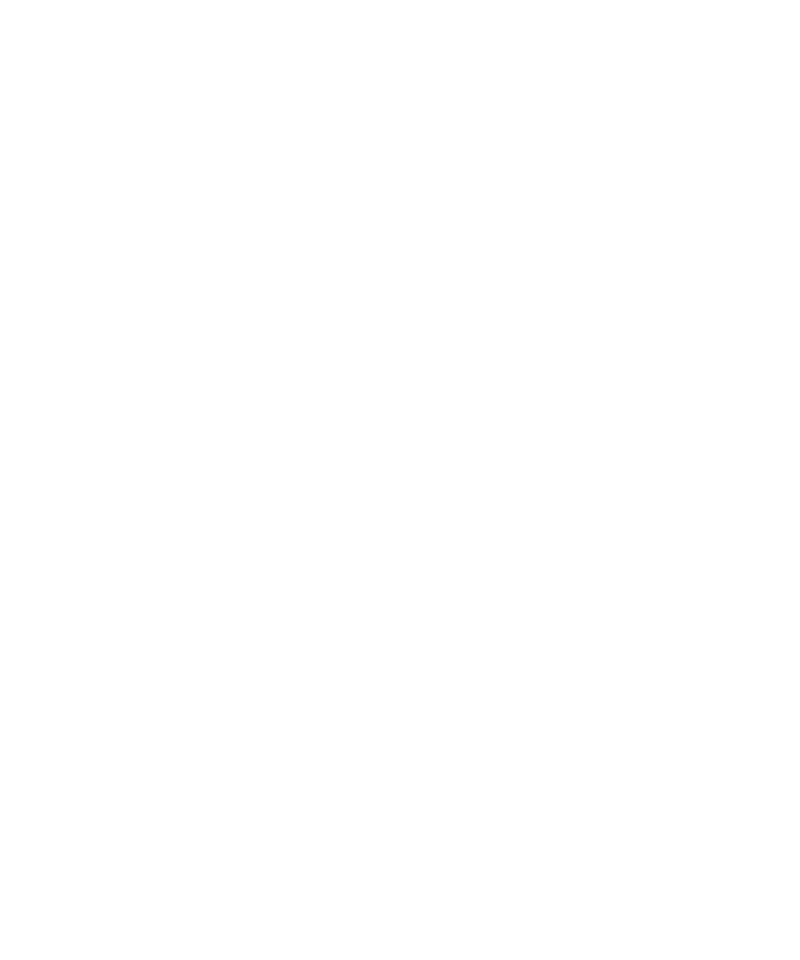

<IPython.core.display.Javascript object>


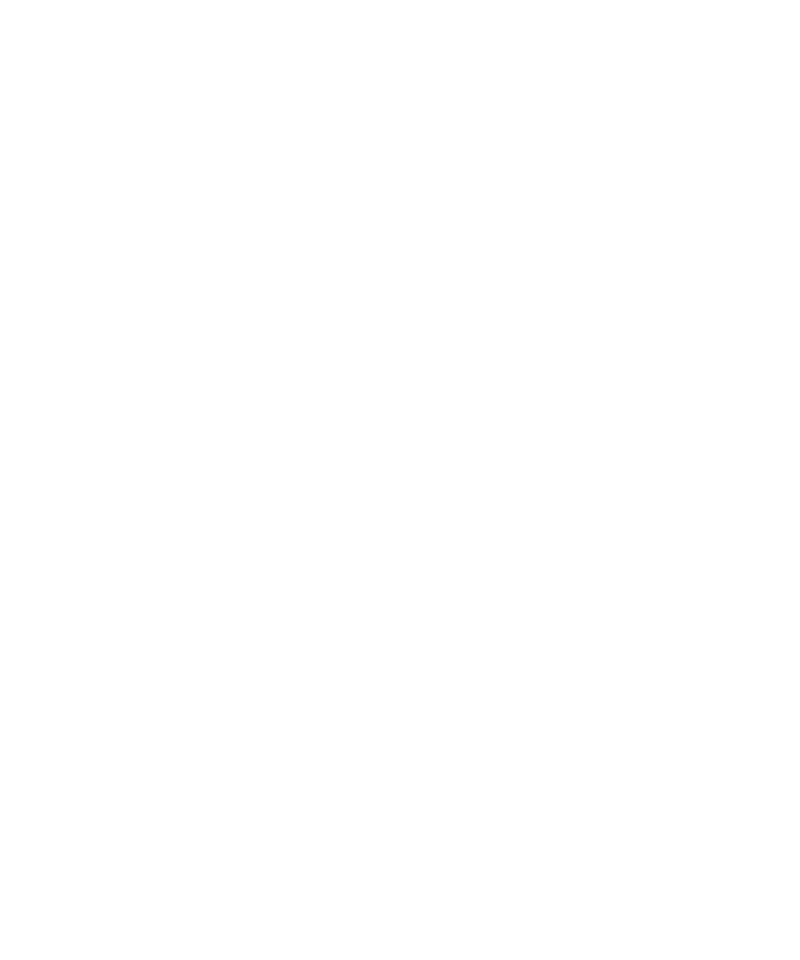

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/8eaa5819/ with filename as uid=8eaa5819-c55c-47ae-b20e-8a0e9dac3e32_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/8eaa5819/ 8eaa58 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=8eaa5819_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=8eaa5819_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 869a12eb*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/869a12eb/
The data are: S

<IPython.core.display.Javascript object>


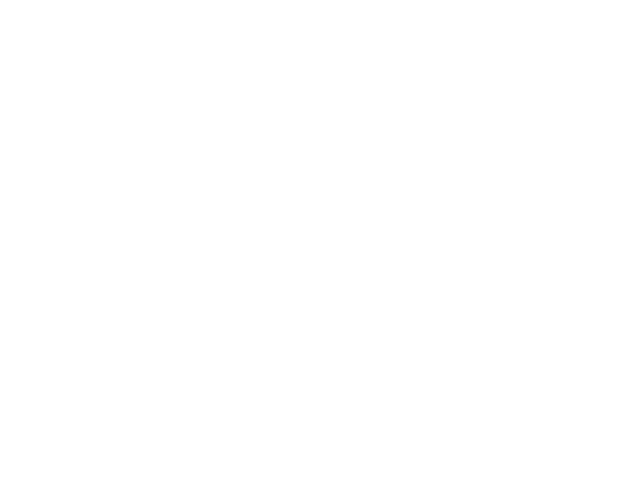

<IPython.core.display.Javascript object>


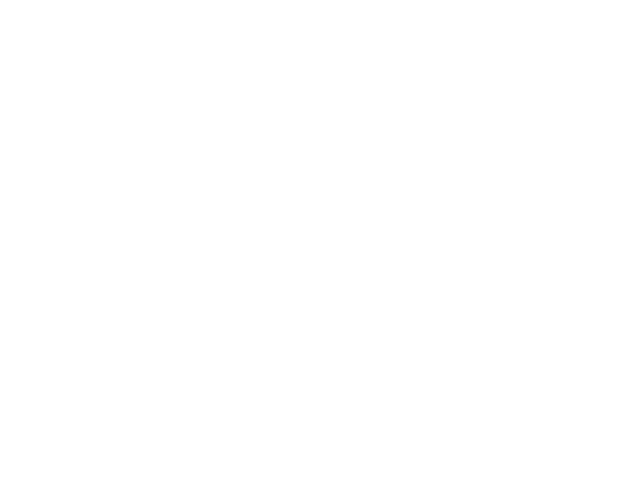

The non-zeros photon occupation is 0.011039104351838847.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_869a12eb-c7f4-41d5-9597-090e89782117.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####Bad frame list are: [0]
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=869a12_fra_5_500


<IPython.core.display.Javascript object>


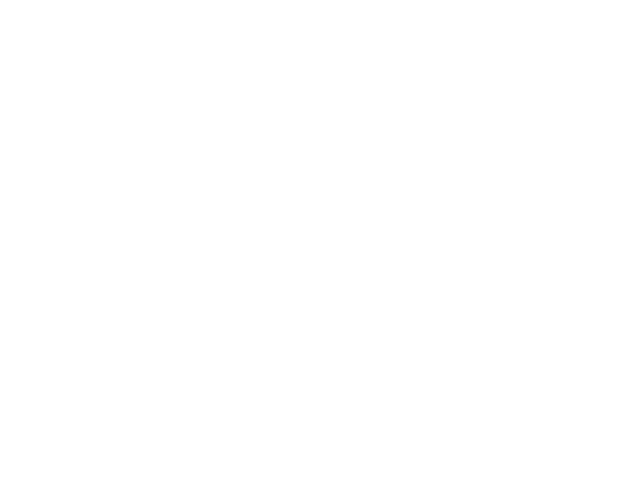

Total time: 11.513 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


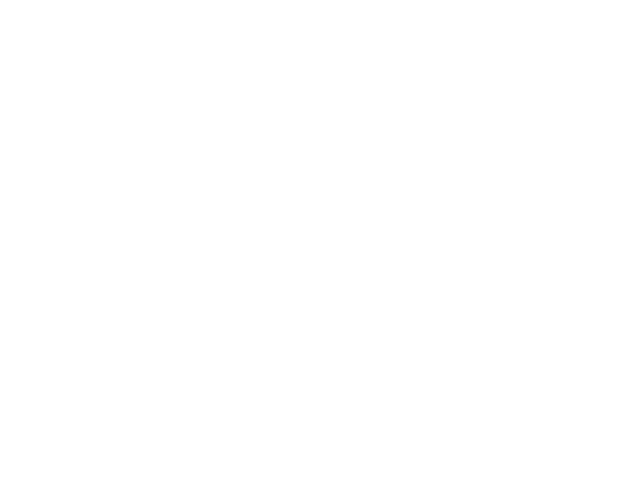

The bad frame list length is: 5


<IPython.core.display.Javascript object>


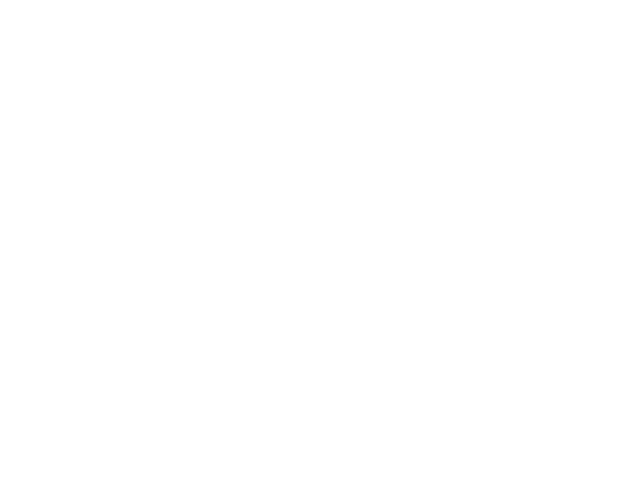

<IPython.core.display.Javascript object>


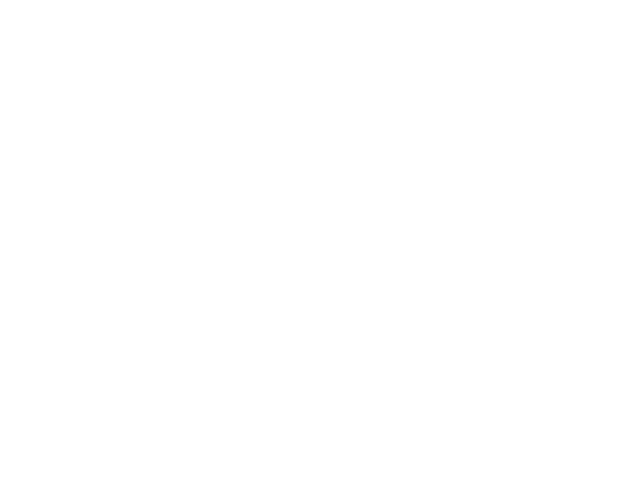

<IPython.core.display.Javascript object>


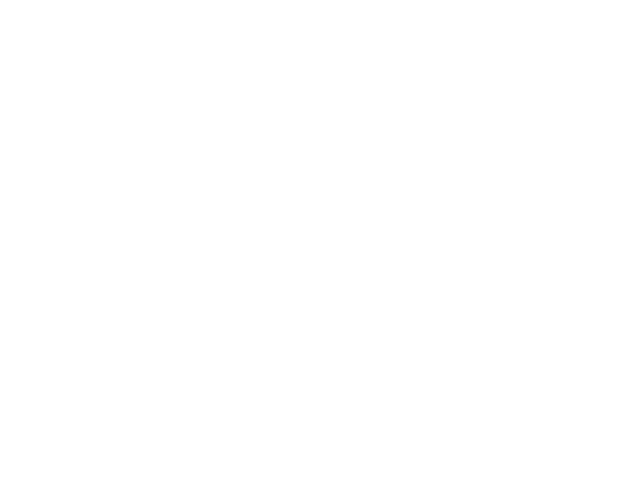

<IPython.core.display.Javascript object>


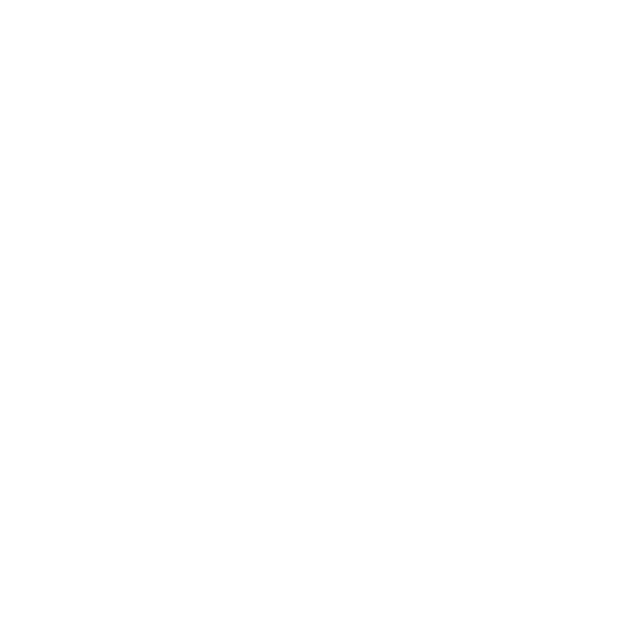

<IPython.core.display.Javascript object>


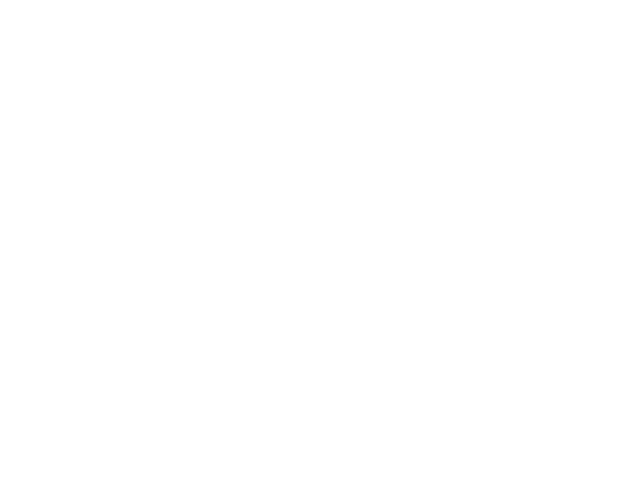

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 46.22it/s]


<IPython.core.display.Javascript object>


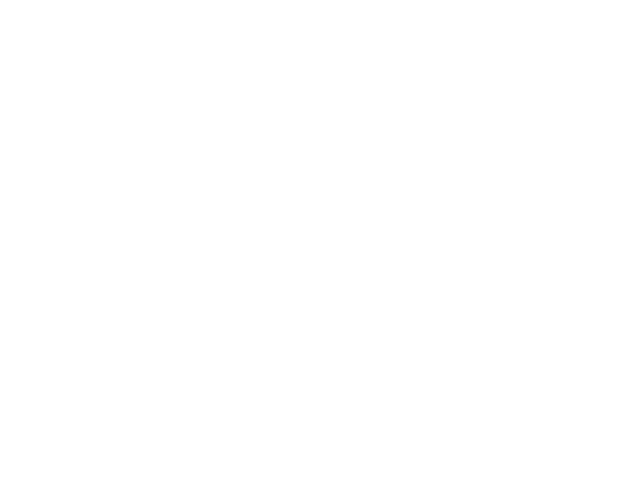

The file: uid=869a12_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/


<IPython.core.display.Javascript object>


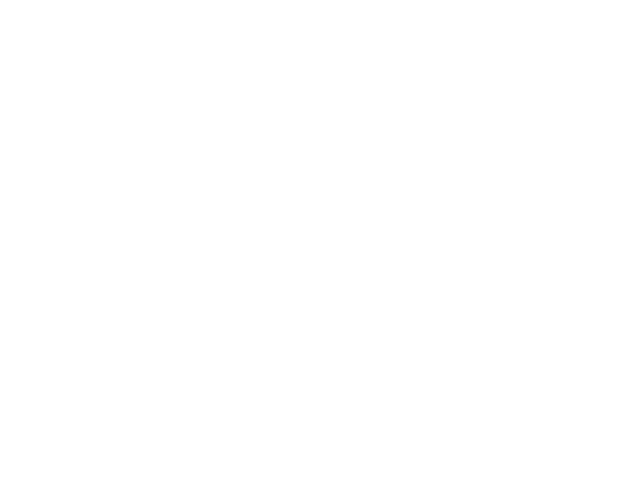

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 885.17it/s]


<IPython.core.display.Javascript object>


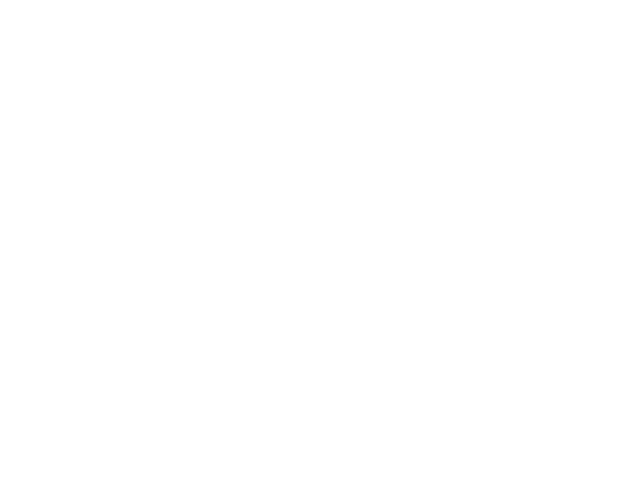

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 945.77it/s]


<IPython.core.display.Javascript object>


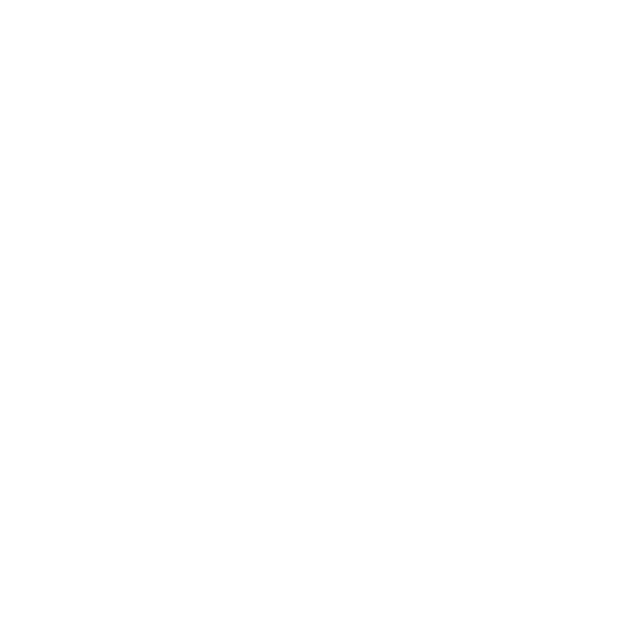

The file: uid=869a12_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:09<00:00,  1.66it/s]

G2 calculation DONE!
Total time: 18.291 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/ with filename as uid=869a12_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/uid=869a12_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


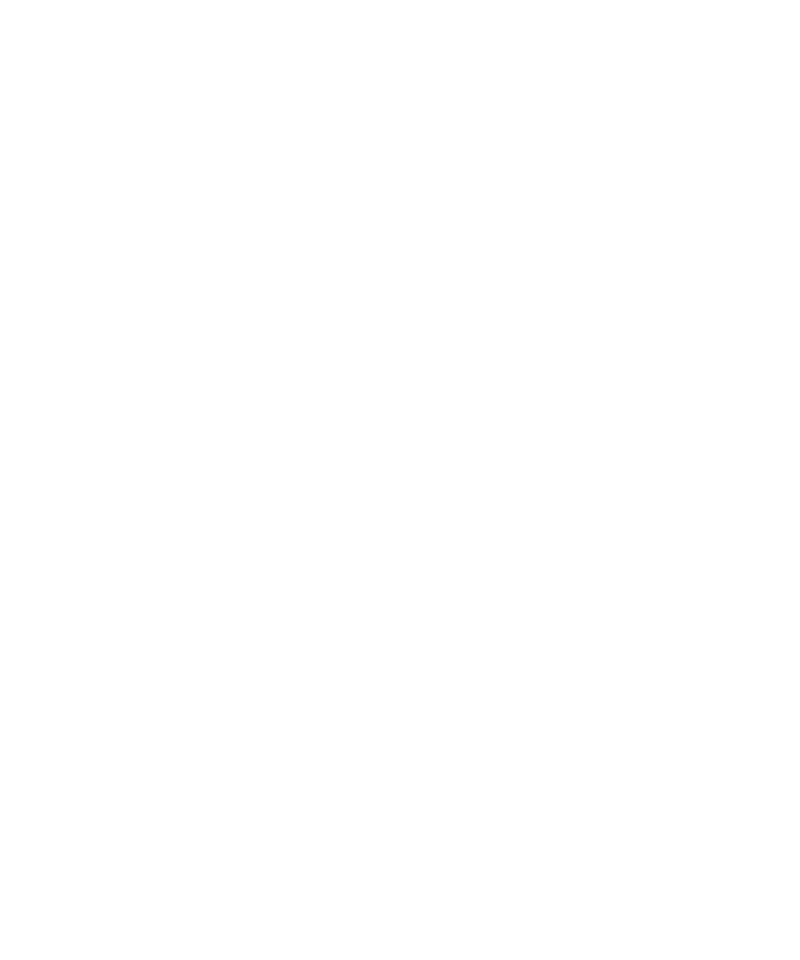

The fitted diffusion coefficient D0 is:  1.385e+06   A^2S-1


<IPython.core.display.Javascript object>


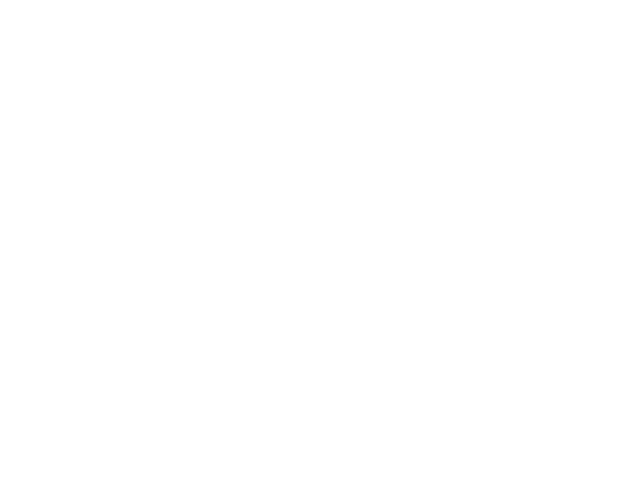

100%|██████████| 16/16 [00:06<00:00,  2.11it/s]

Total time: 6.451 sec


<IPython.core.display.Javascript object>


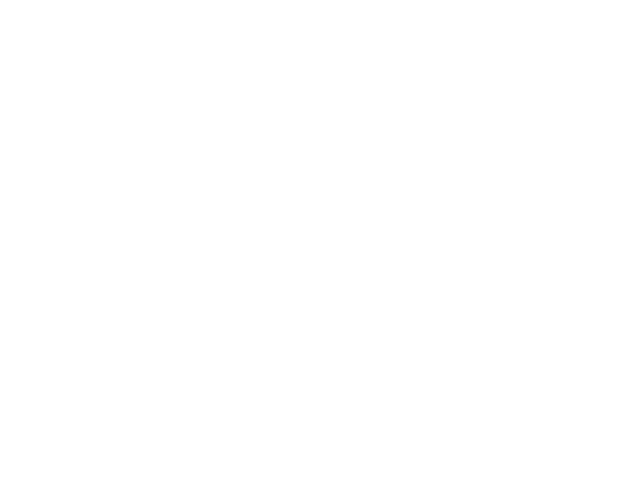

Total time: 0.060 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/ with filename as uid=869a12_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/869a12eb/uid=869a12_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.699e+06   A^2S-1


<IPython.core.display.Javascript object>


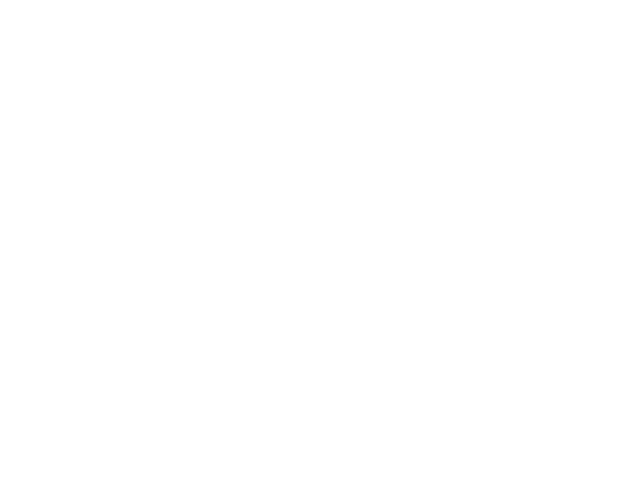

<IPython.core.display.Javascript object>


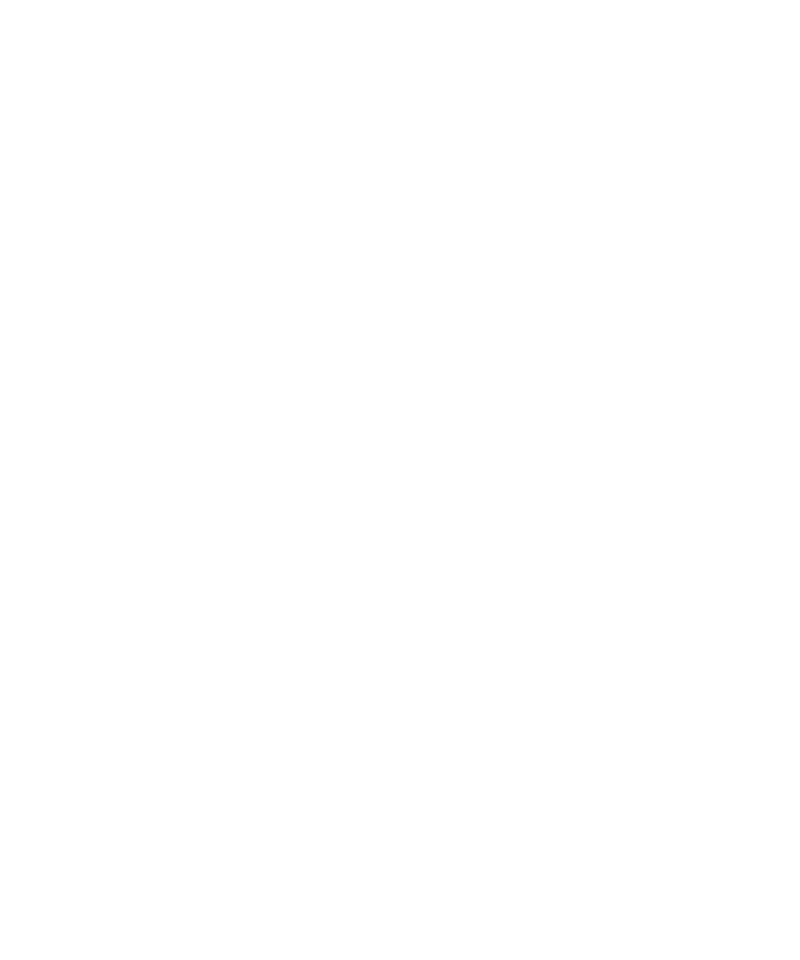

<IPython.core.display.Javascript object>


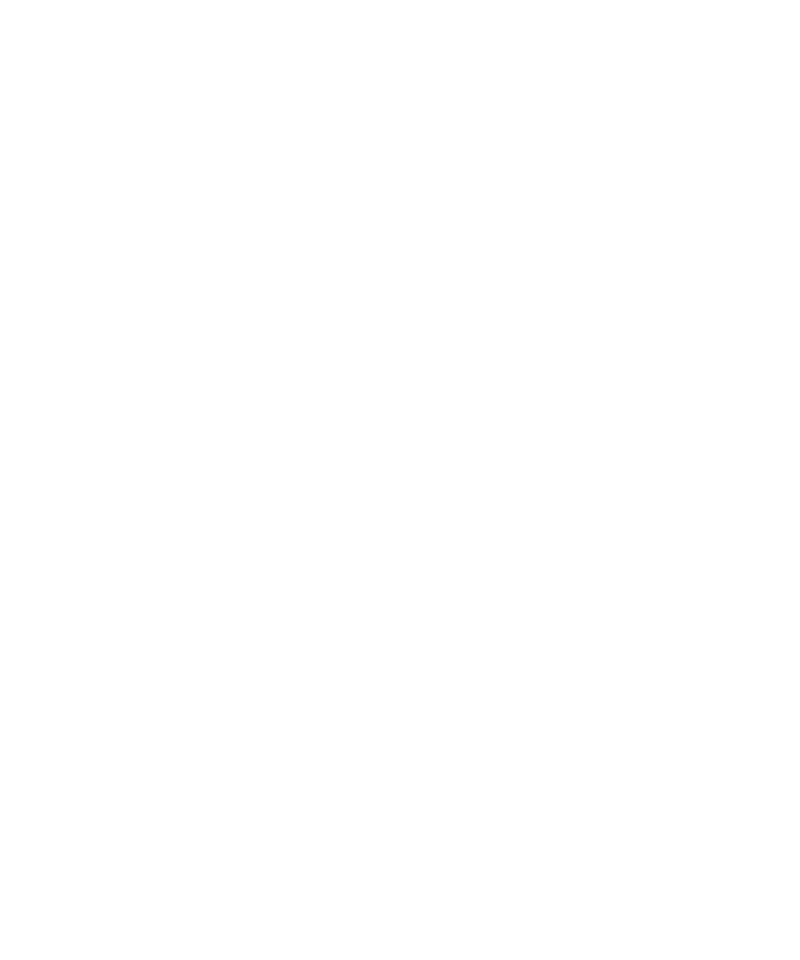

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/869a12eb/ with filename as uid=869a12eb-c7f4-41d5-9597-090e89782117_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/869a12eb/ 869a12 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=869a12eb_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=869a12eb_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 59f7d3c5*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/
The data are: S

<IPython.core.display.Javascript object>


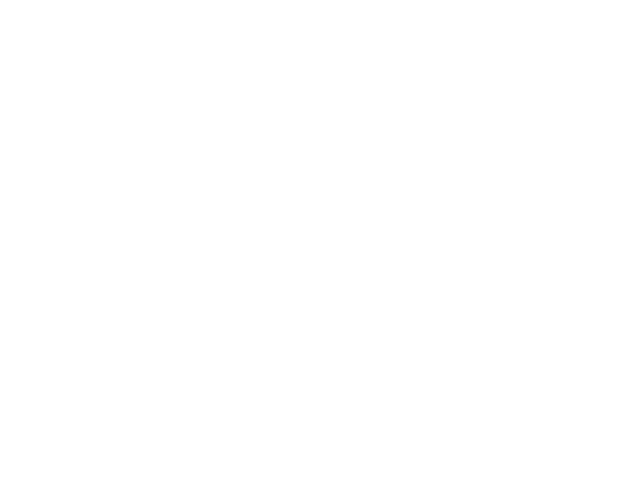

<IPython.core.display.Javascript object>


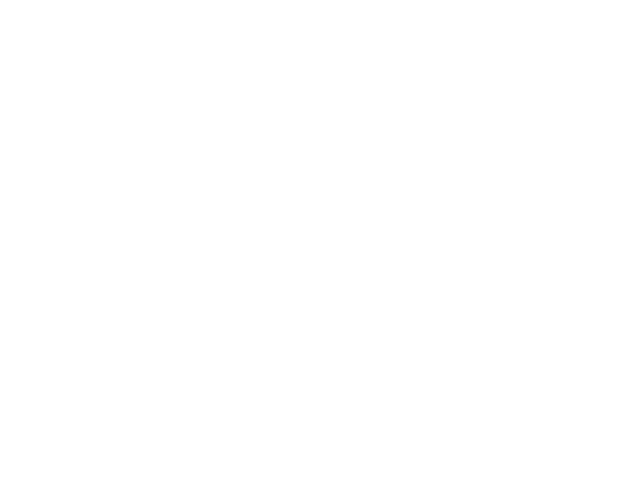

The non-zeros photon occupation is 0.008974316102985271.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_59f7d3c5-a76c-44fe-a22f-bae69ac40252.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=59f7d3_fra_5_500


<IPython.core.display.Javascript object>


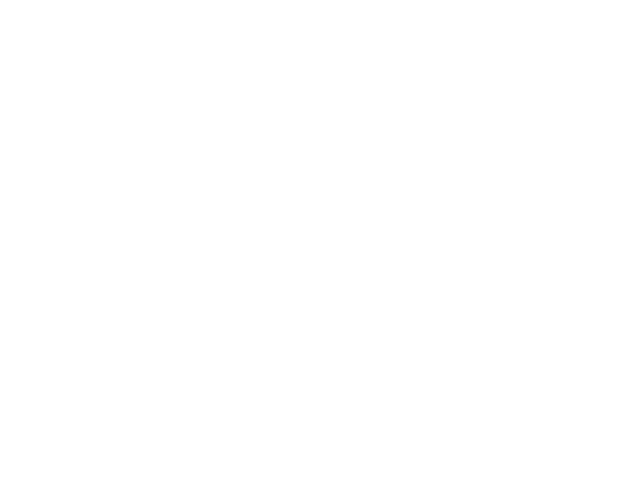

Total time: 13.598 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


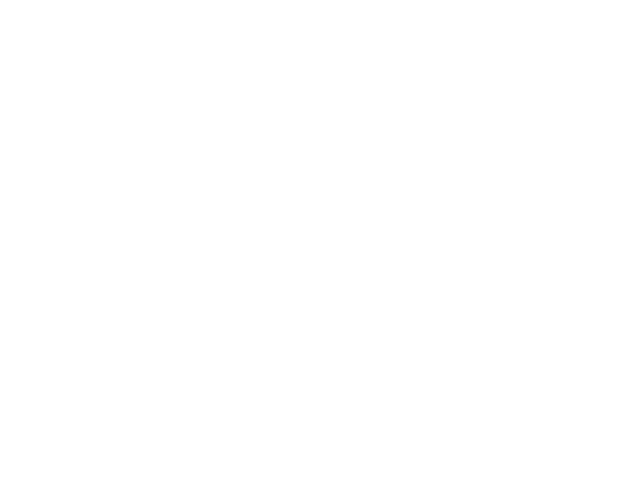

The bad frame list length is: 5


<IPython.core.display.Javascript object>


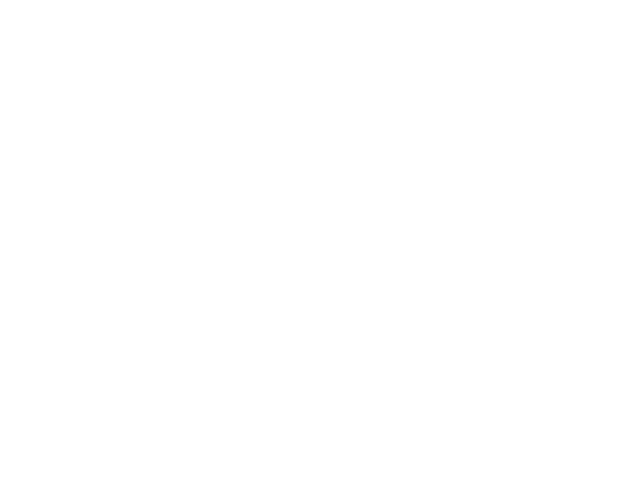

<IPython.core.display.Javascript object>


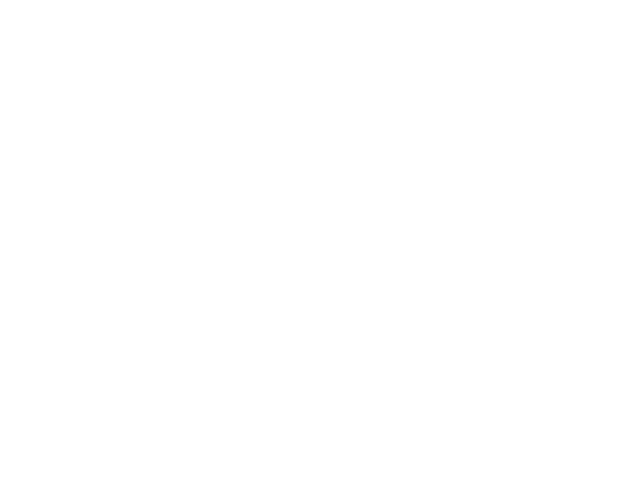

<IPython.core.display.Javascript object>


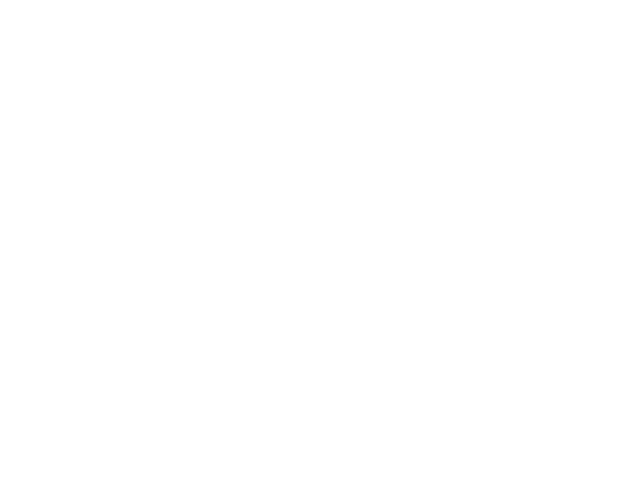

<IPython.core.display.Javascript object>


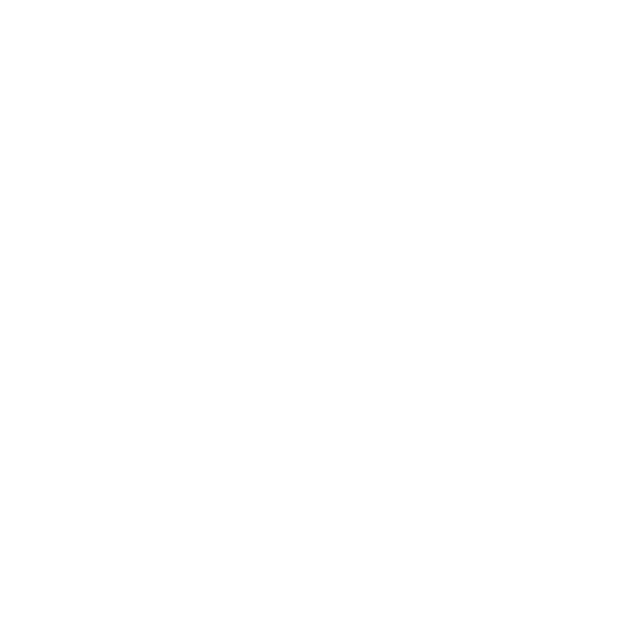

<IPython.core.display.Javascript object>


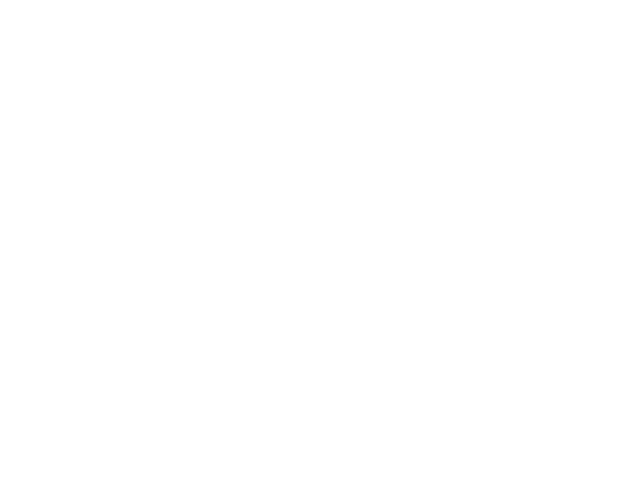

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 87.06it/s]


<IPython.core.display.Javascript object>


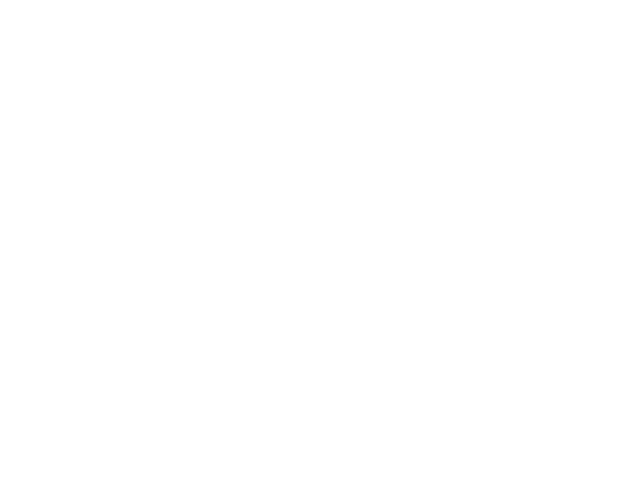

The file: uid=59f7d3_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/


<IPython.core.display.Javascript object>


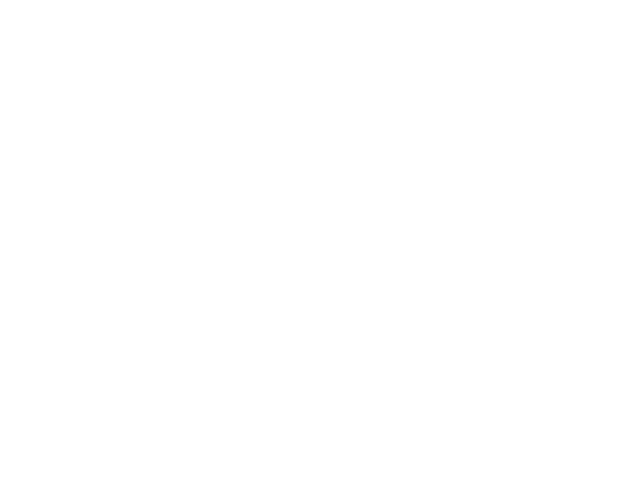

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 2534.55it/s]


<IPython.core.display.Javascript object>


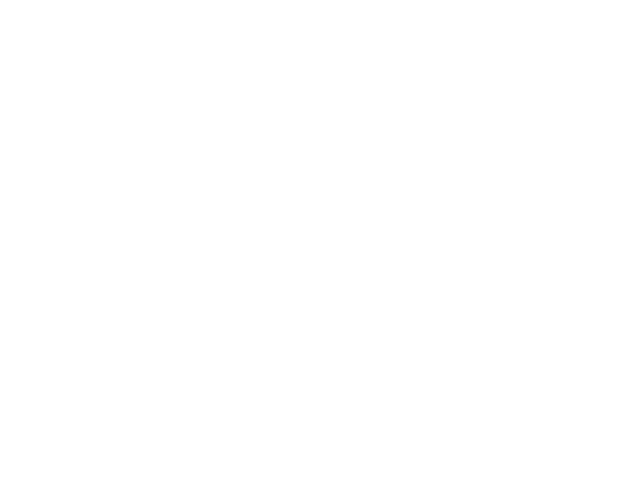

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1755.22it/s]


<IPython.core.display.Javascript object>


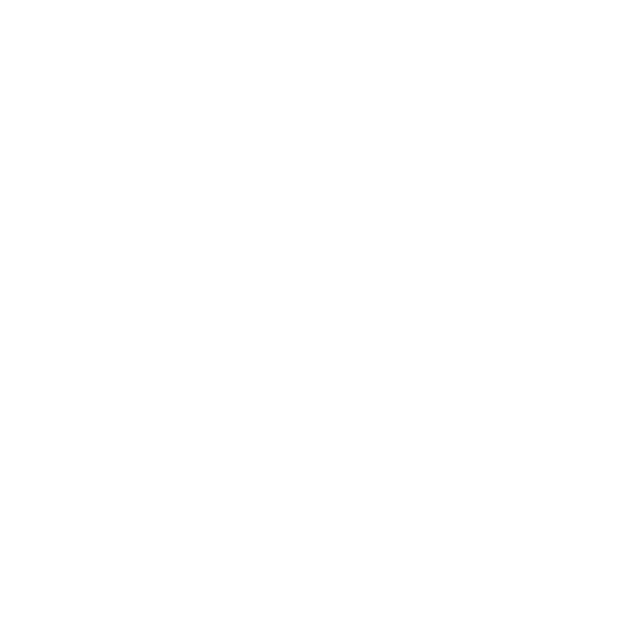

The file: uid=59f7d3_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:09<00:00,  1.66it/s]

G2 calculation DONE!
Total time: 17.314 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/ with filename as uid=59f7d3_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/uid=59f7d3_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


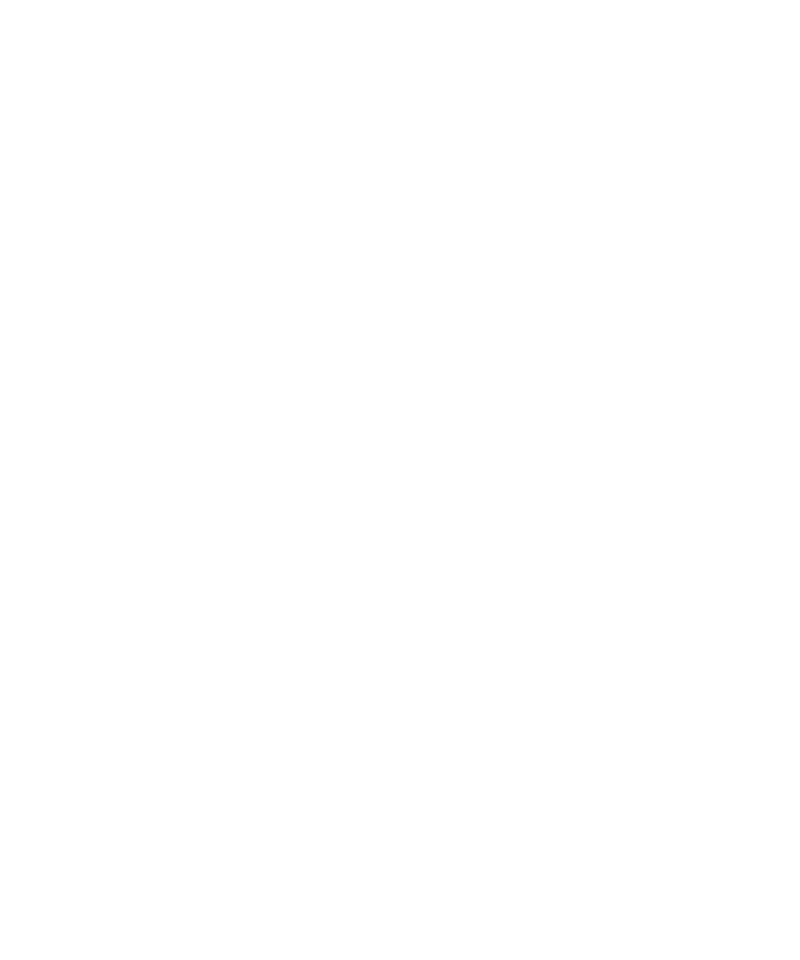

The fitted diffusion coefficient D0 is:  1.717e+04   A^2S-1


<IPython.core.display.Javascript object>


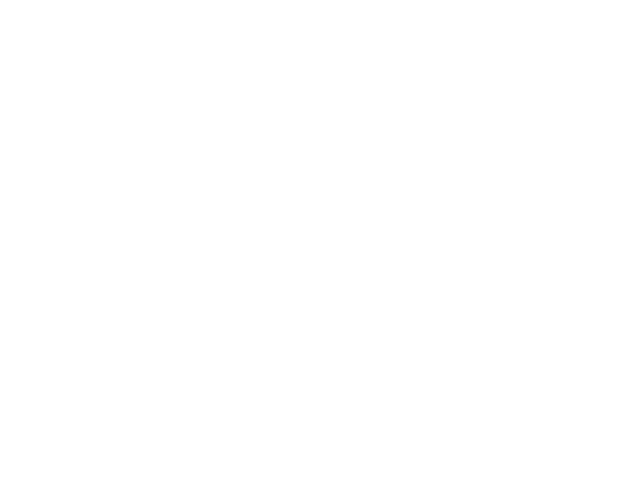

100%|██████████| 16/16 [00:06<00:00,  2.10it/s]

Total time: 6.144 sec


<IPython.core.display.Javascript object>


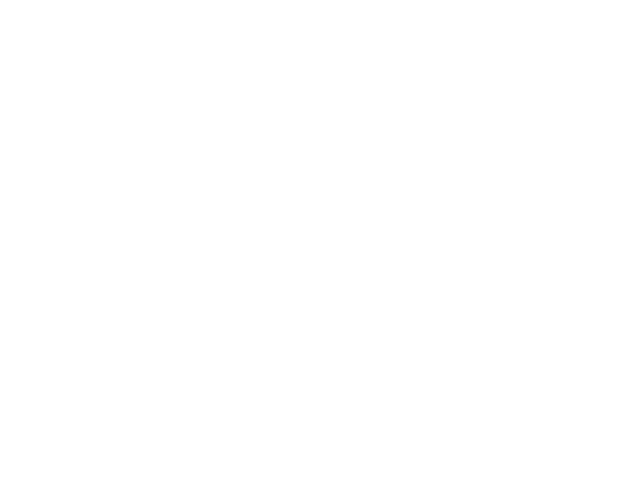

Total time: 0.041 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/ with filename as uid=59f7d3_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/uid=59f7d3_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.186e+06   A^2S-1


<IPython.core.display.Javascript object>


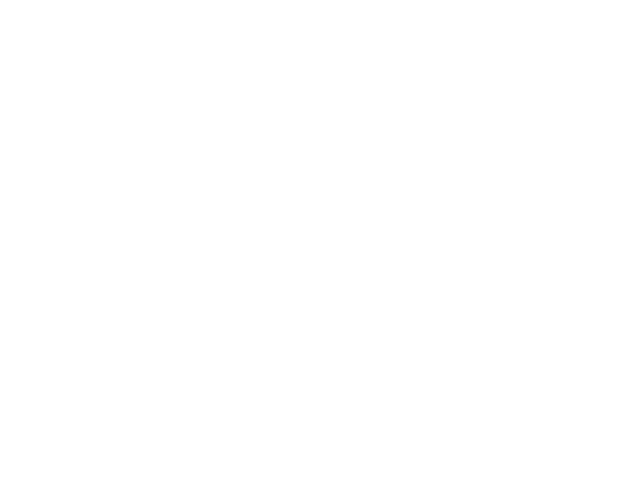

<IPython.core.display.Javascript object>


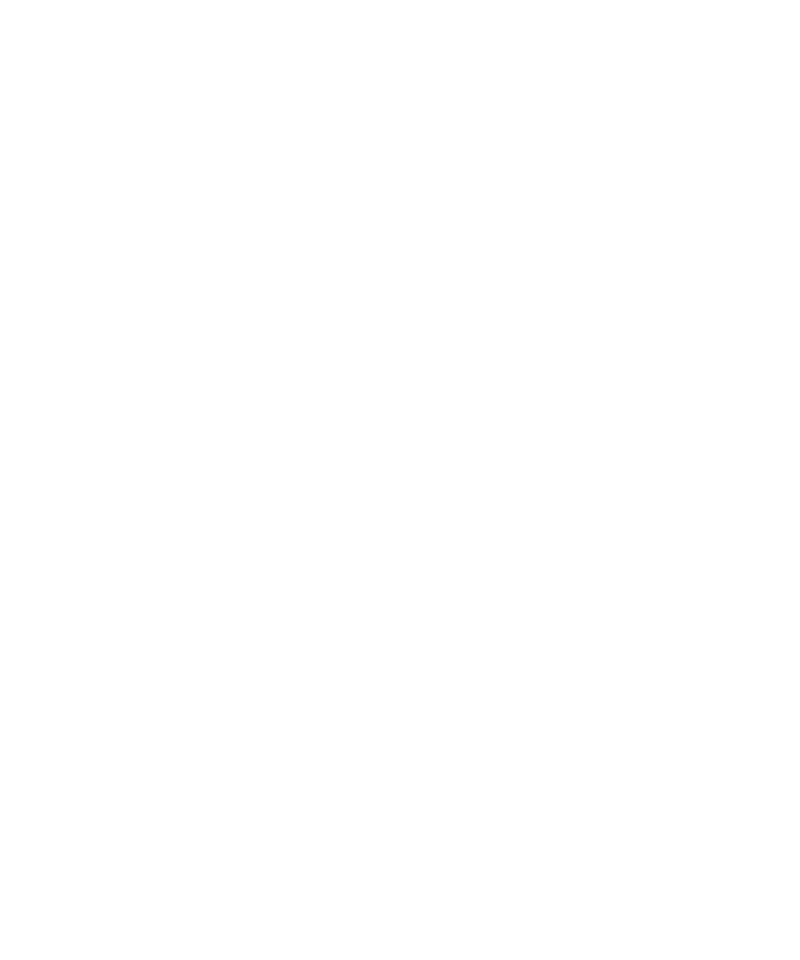

<IPython.core.display.Javascript object>


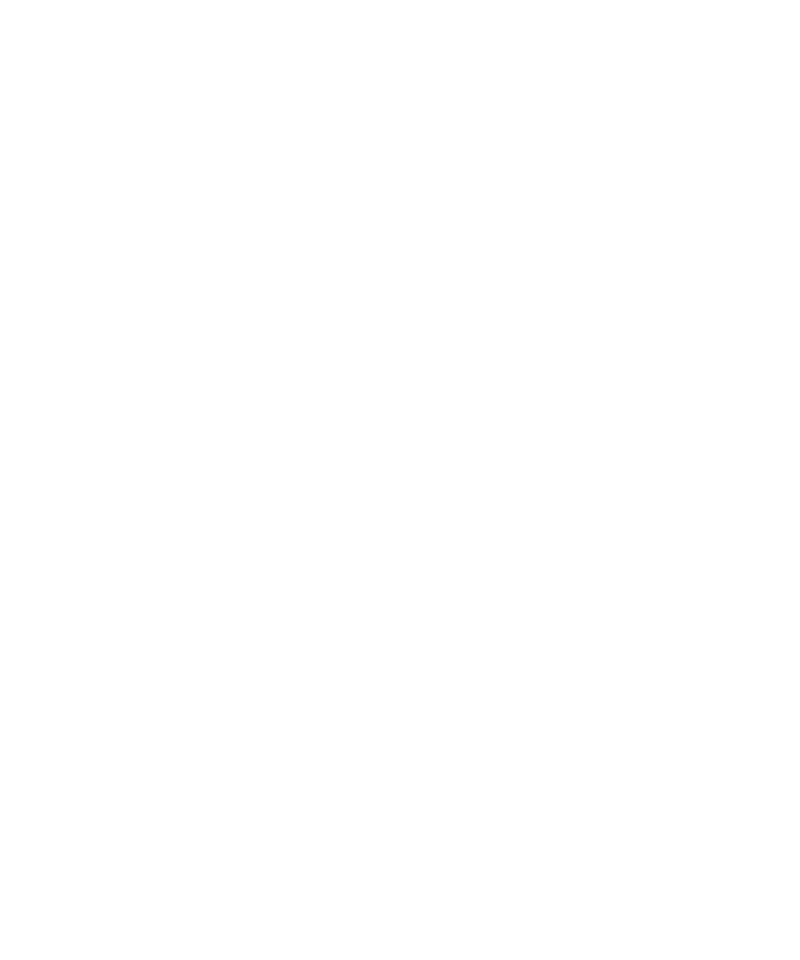

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/ with filename as uid=59f7d3c5-a76c-44fe-a22f-bae69ac40252_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/59f7d3c5/ 59f7d3 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=59f7d3c5_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=59f7d3c5_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 675344e3*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/675344e3/
The data are: S

<IPython.core.display.Javascript object>


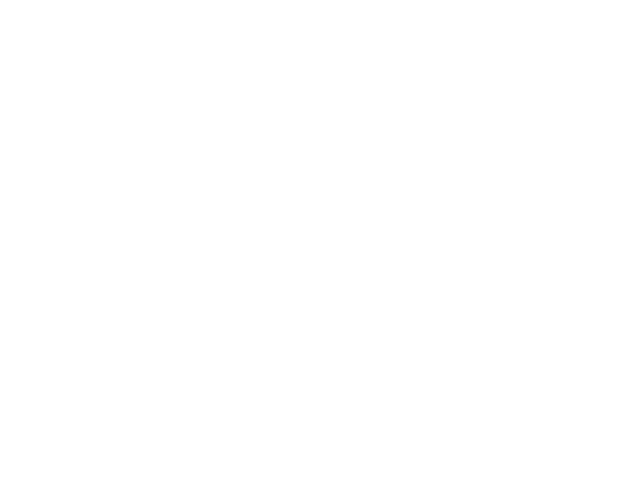

<IPython.core.display.Javascript object>


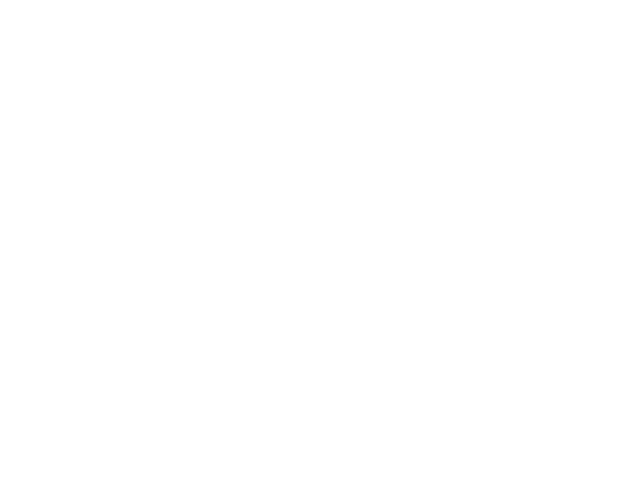

The non-zeros photon occupation is 0.009029380095369943.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_675344e3-213c-4b47-bdf0-108bed85be35.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=675344_fra_5_500


<IPython.core.display.Javascript object>


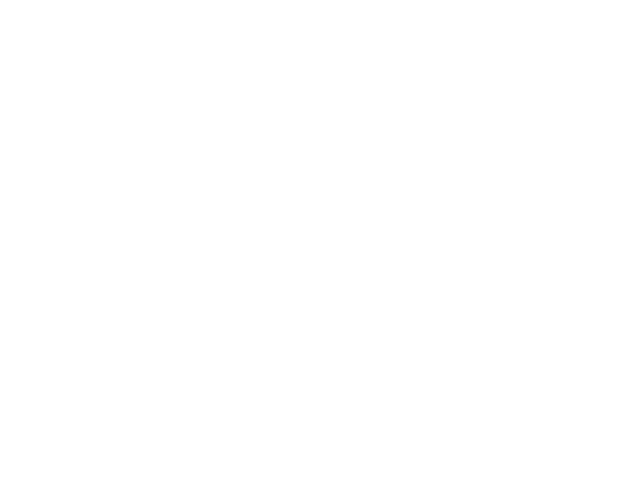

Total time: 11.973 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


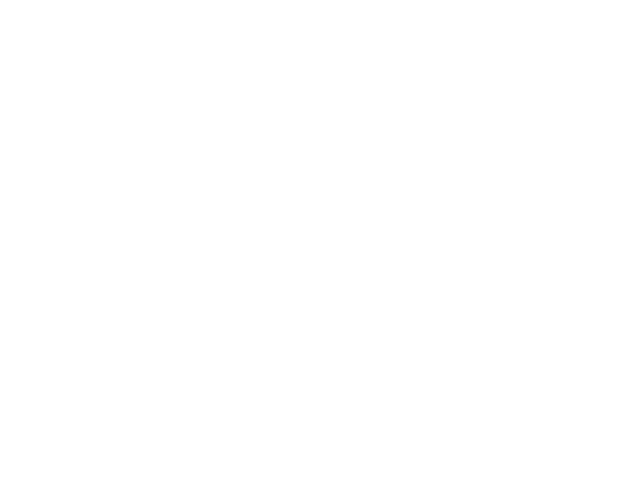

The bad frame list length is: 5


<IPython.core.display.Javascript object>


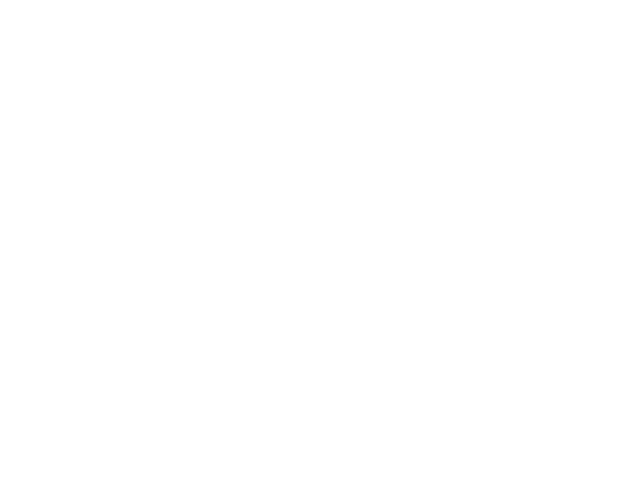

<IPython.core.display.Javascript object>


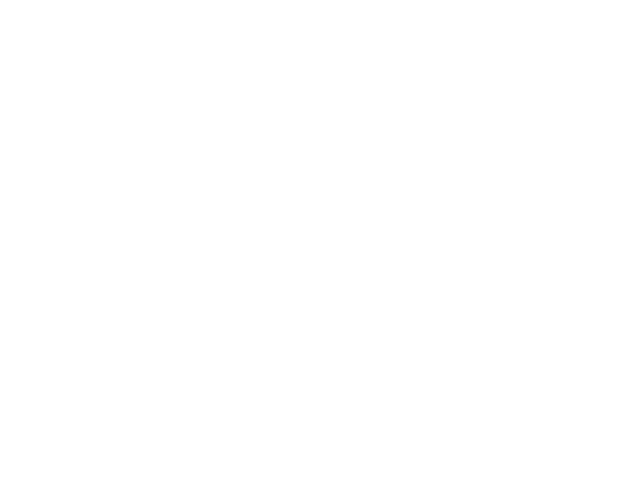

<IPython.core.display.Javascript object>


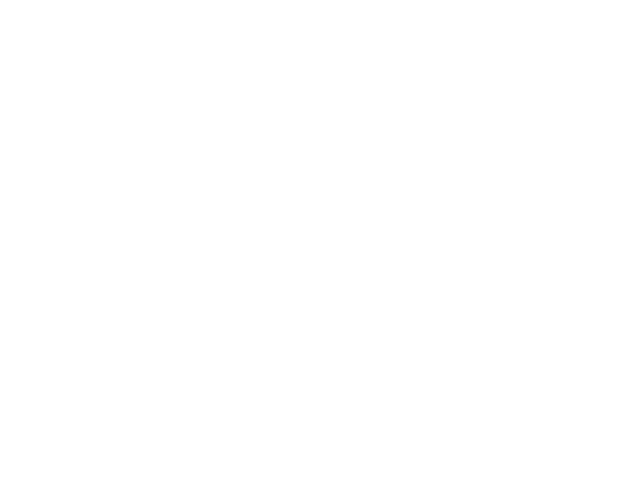

<IPython.core.display.Javascript object>


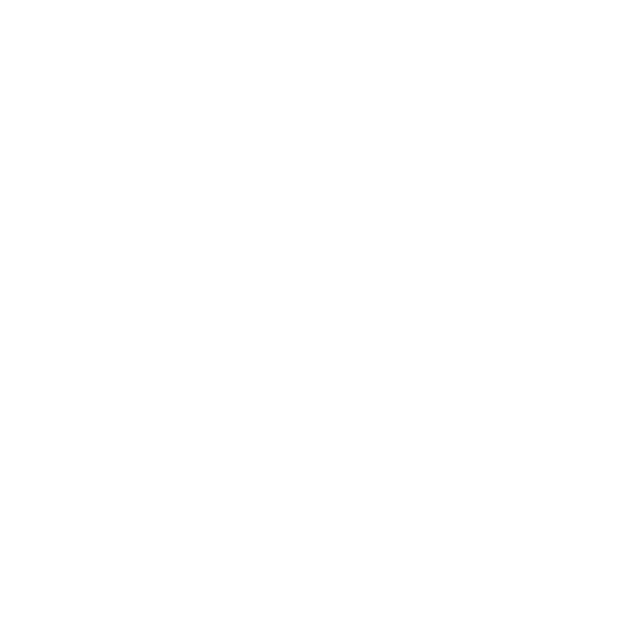

<IPython.core.display.Javascript object>


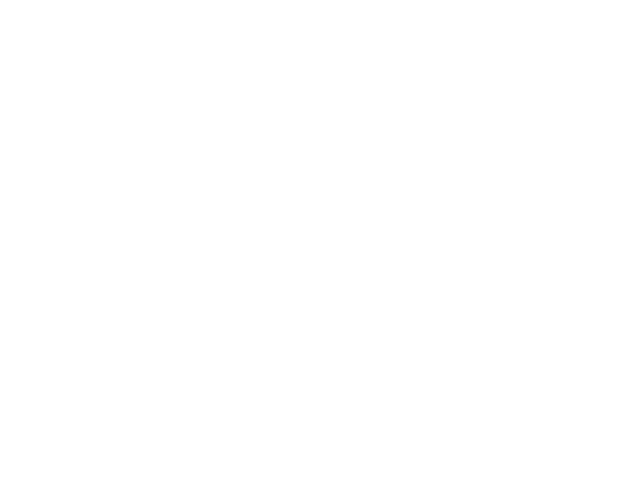

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 81.38it/s]


<IPython.core.display.Javascript object>


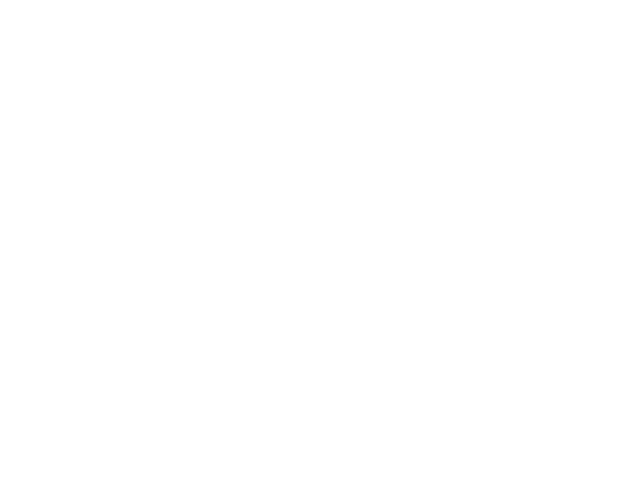

The file: uid=675344_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/


<IPython.core.display.Javascript object>


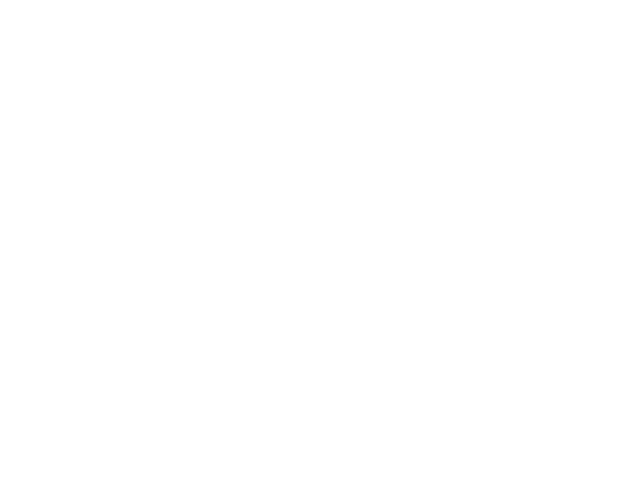

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 2648.57it/s]


<IPython.core.display.Javascript object>


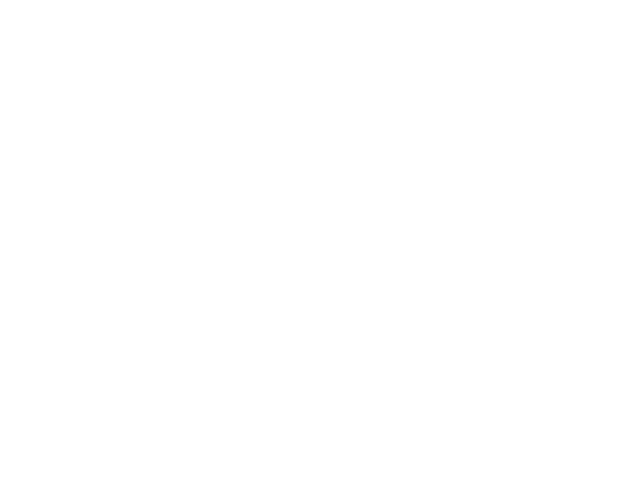

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1406.58it/s]


<IPython.core.display.Javascript object>


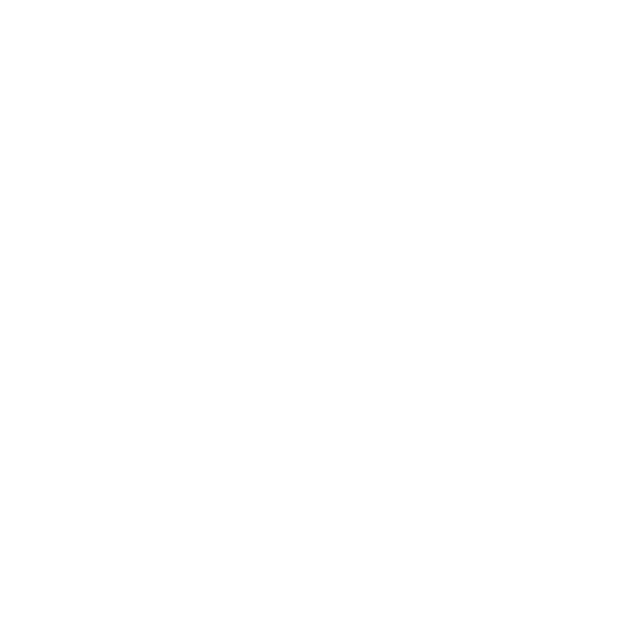

The file: uid=675344_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


G2 calculation DONE!
Total time: 17.825 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/ with filename as uid=675344_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/uid=675344_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


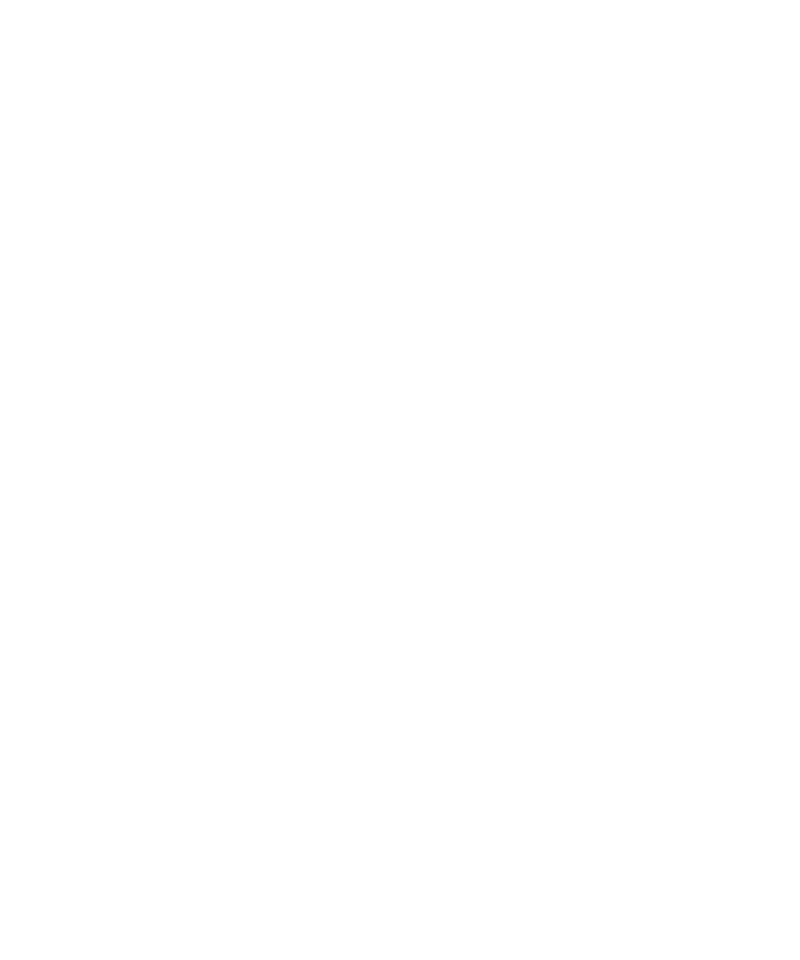

The fitted diffusion coefficient D0 is:  1.654e+06   A^2S-1


<IPython.core.display.Javascript object>


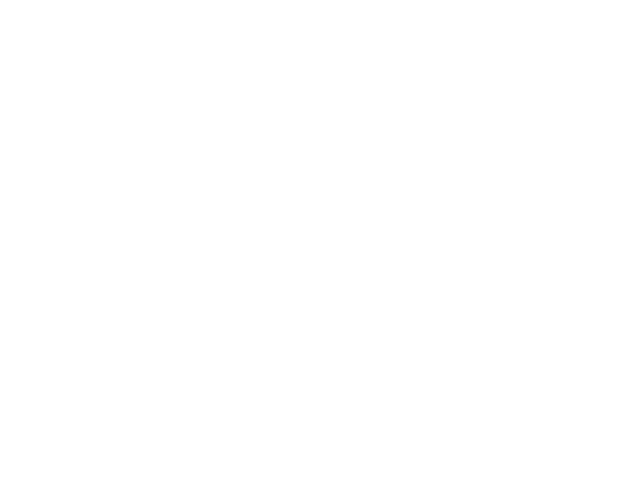

100%|██████████| 16/16 [00:06<00:00,  1.93it/s]

Total time: 6.726 sec


<IPython.core.display.Javascript object>


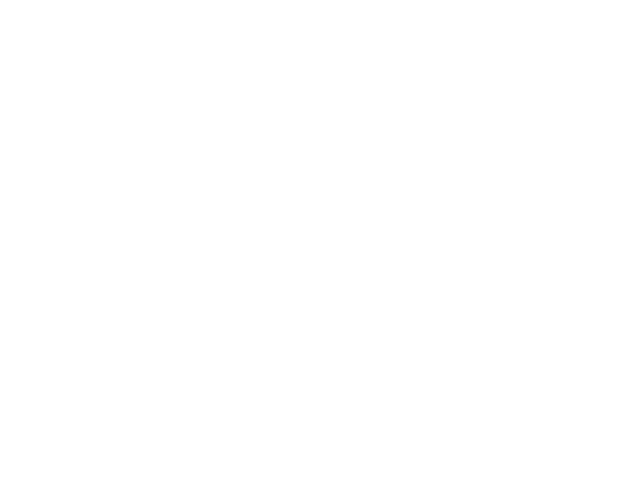

Total time: 0.065 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/ with filename as uid=675344_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/675344e3/uid=675344_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.389e+06   A^2S-1


<IPython.core.display.Javascript object>


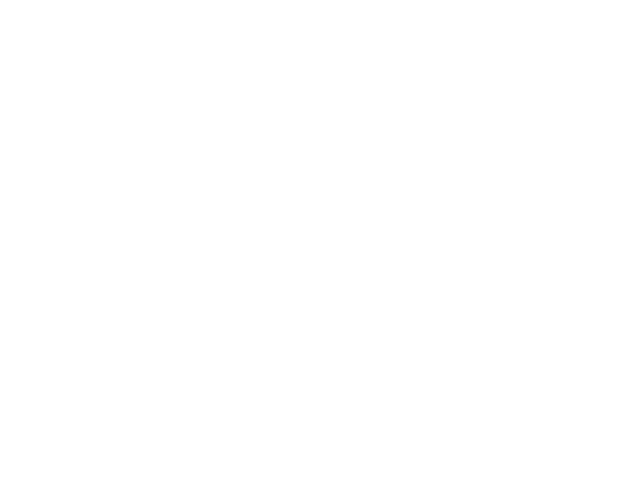

<IPython.core.display.Javascript object>


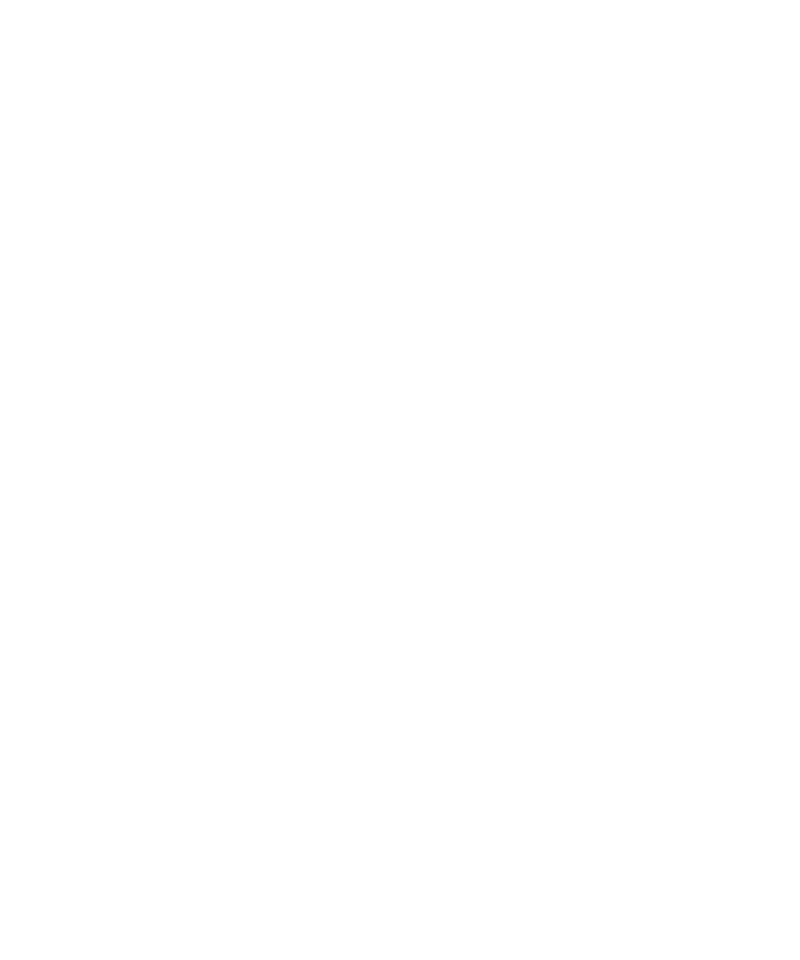

<IPython.core.display.Javascript object>


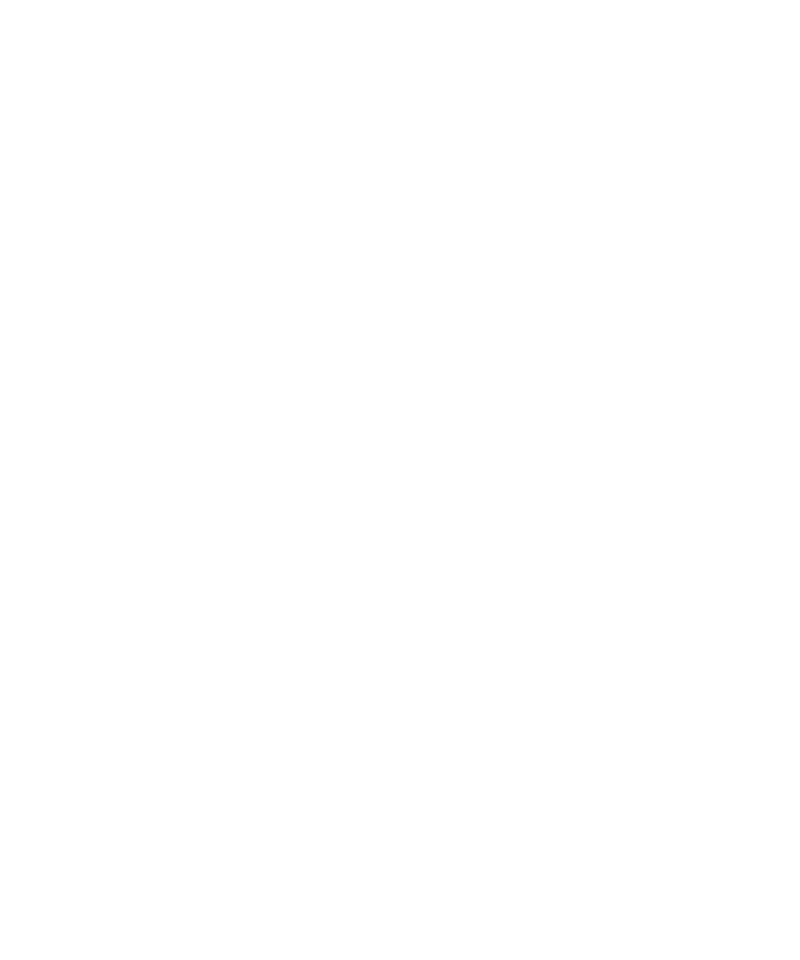

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/675344e3/ with filename as uid=675344e3-213c-4b47-bdf0-108bed85be35_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/675344e3/ 675344 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=675344e3_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=675344e3_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 55fced8f*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/55fced8f/
The data are: S

<IPython.core.display.Javascript object>


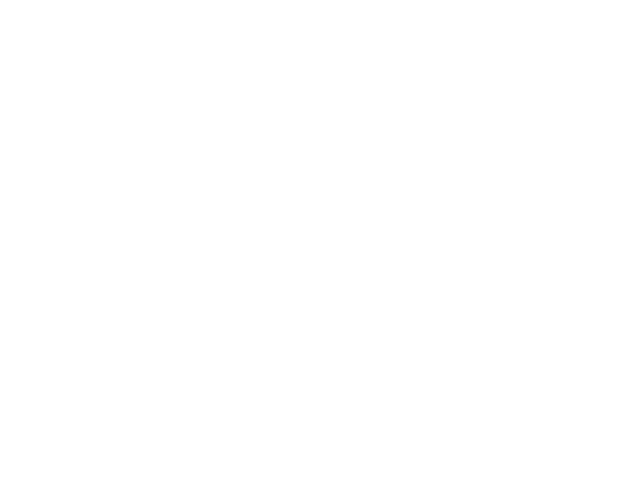

<IPython.core.display.Javascript object>


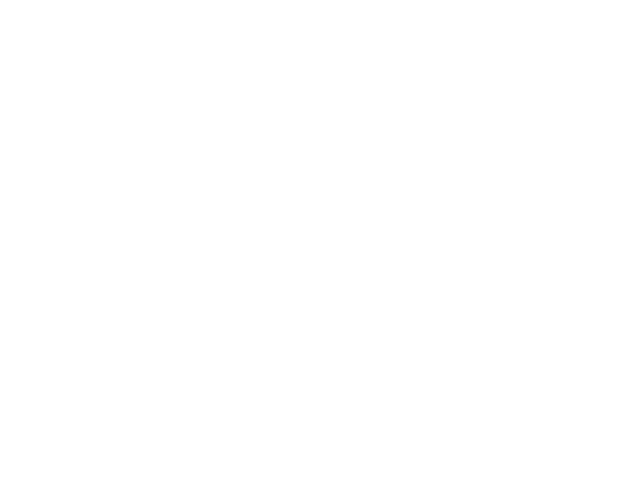

The non-zeros photon occupation is 0.008130075863468051.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_55fced8f-2a1c-4745-bb68-8a08f1845585.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=55fced_fra_5_500


<IPython.core.display.Javascript object>


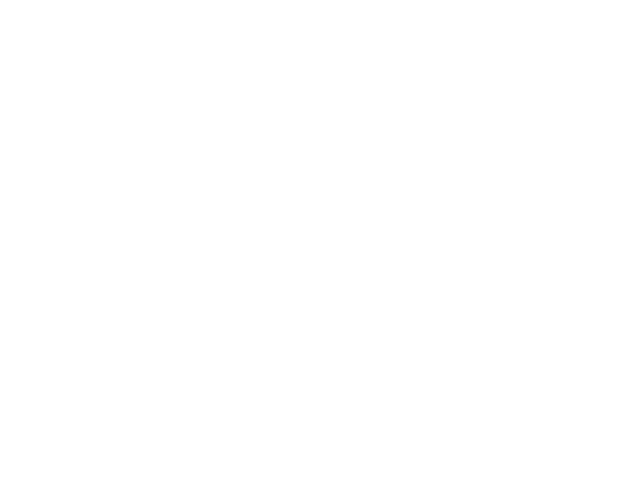

Total time: 11.278 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


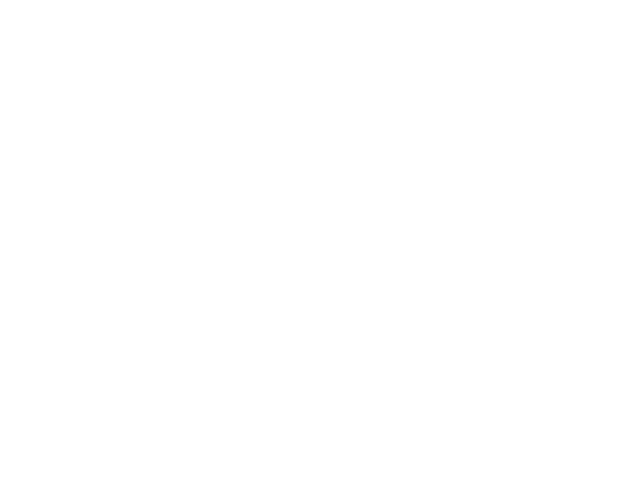

The bad frame list length is: 5


<IPython.core.display.Javascript object>


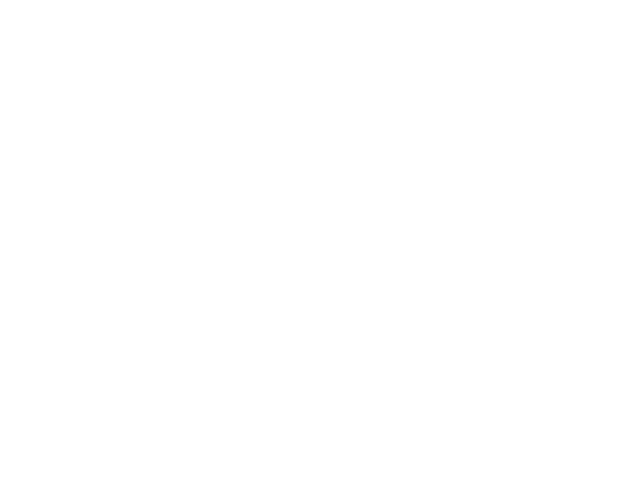

<IPython.core.display.Javascript object>


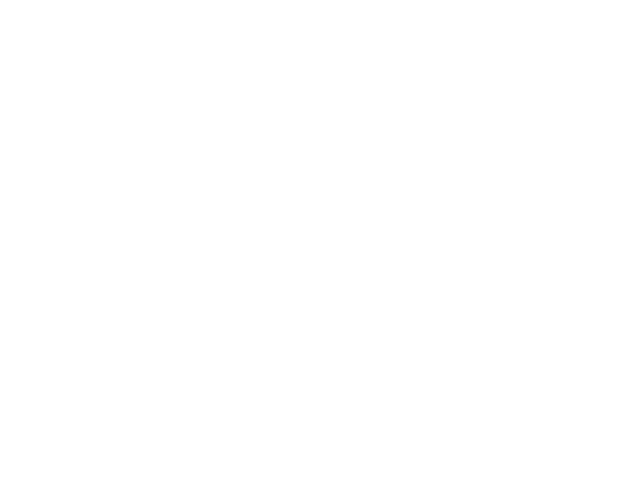

<IPython.core.display.Javascript object>


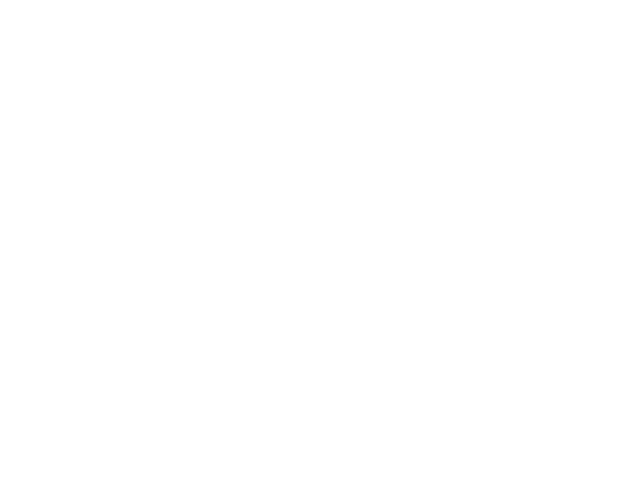

<IPython.core.display.Javascript object>


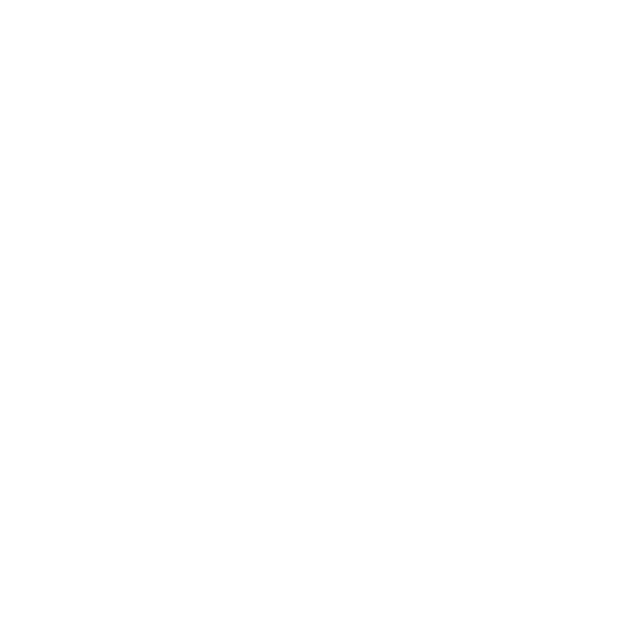

<IPython.core.display.Javascript object>


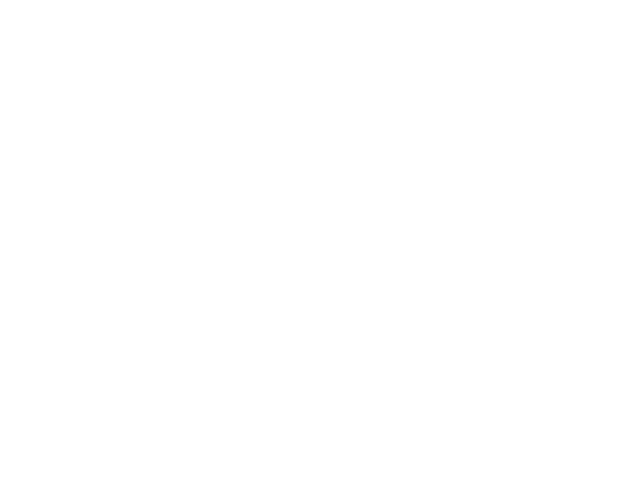

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 76.36it/s]


<IPython.core.display.Javascript object>


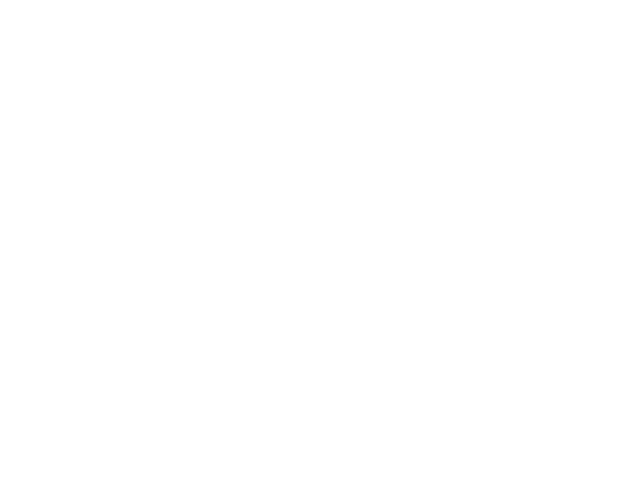

The file: uid=55fced_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/


<IPython.core.display.Javascript object>


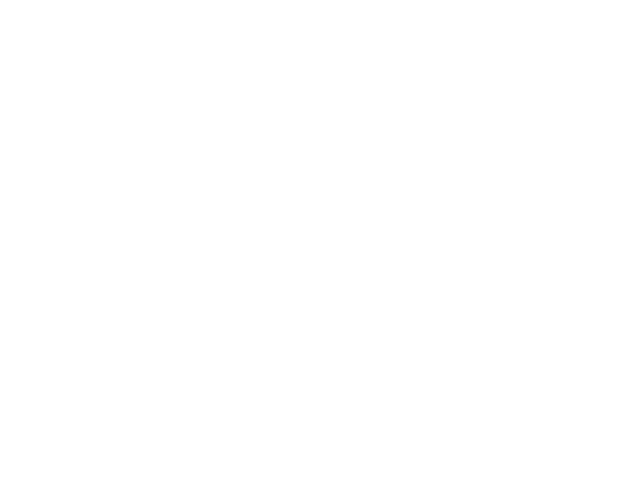

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 2866.30it/s]


<IPython.core.display.Javascript object>


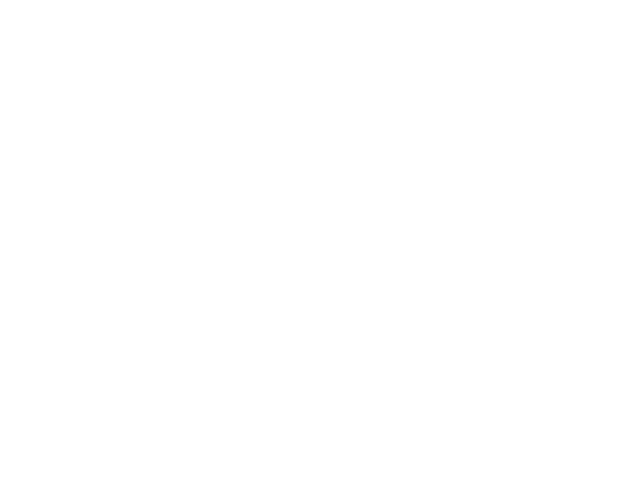

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 2091.69it/s]


<IPython.core.display.Javascript object>


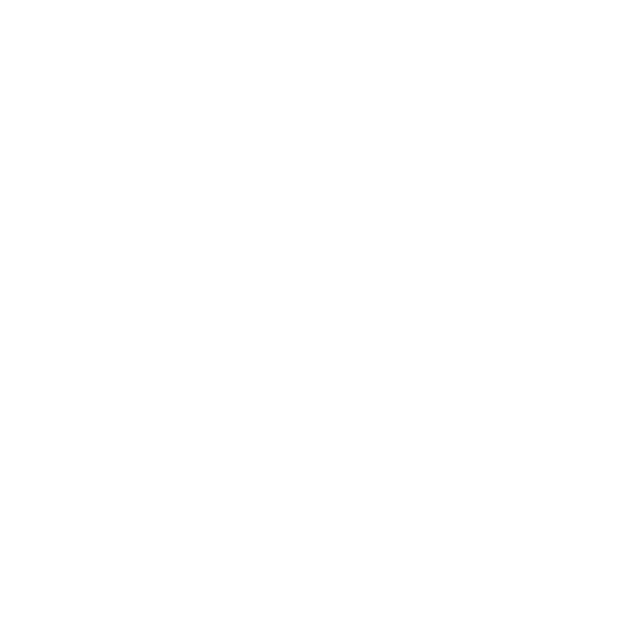

The file: uid=55fced_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:08<00:00,  1.81it/s]


G2 calculation DONE!
Total time: 19.149 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/ with filename as uid=55fced_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/uid=55fced_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


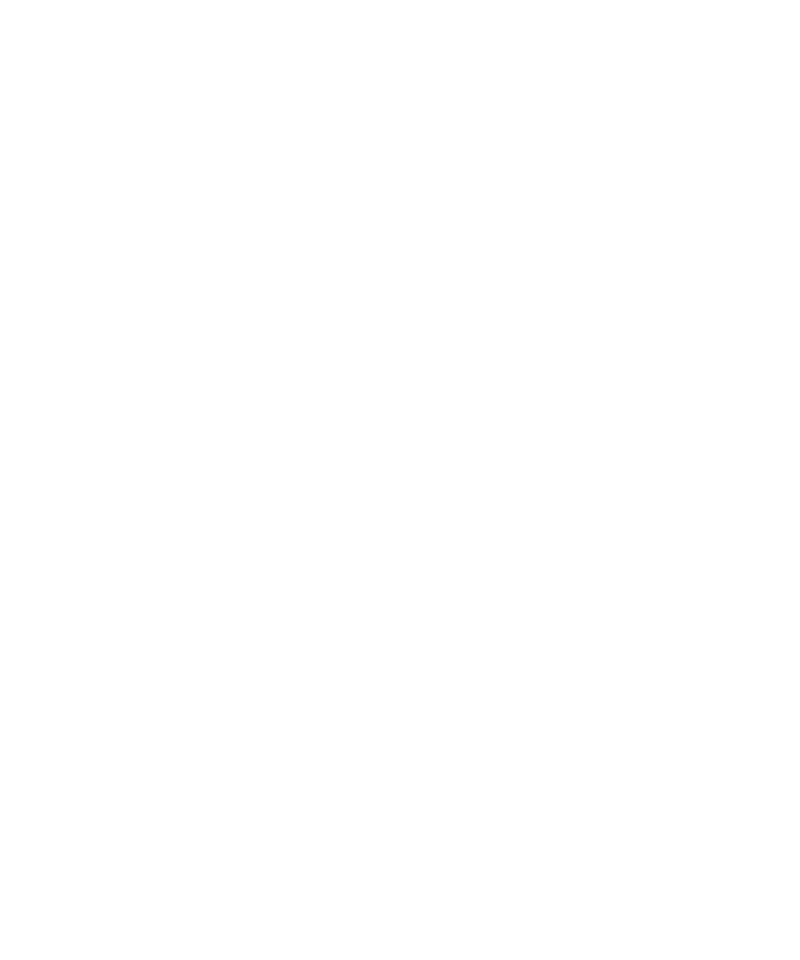

The fitted diffusion coefficient D0 is:  1.759e+06   A^2S-1


<IPython.core.display.Javascript object>


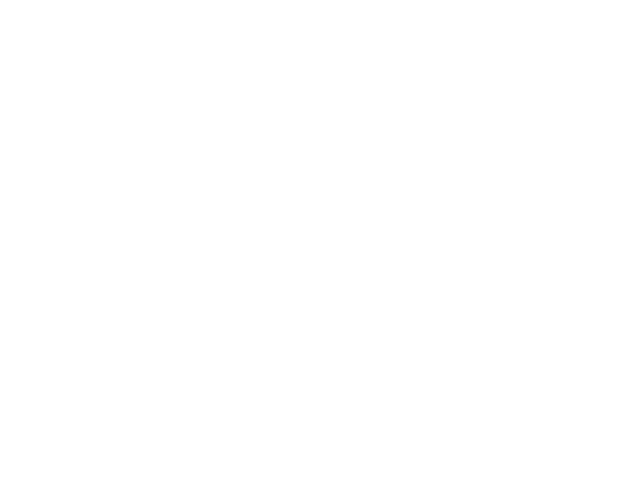

100%|██████████| 16/16 [00:06<00:00,  2.04it/s]

Total time: 6.497 sec


<IPython.core.display.Javascript object>


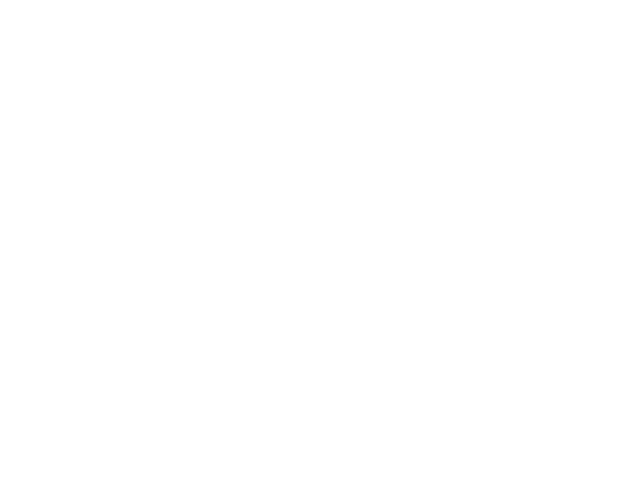

Total time: 0.074 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/ with filename as uid=55fced_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/55fced8f/uid=55fced_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  3.064e+06   A^2S-1


<IPython.core.display.Javascript object>


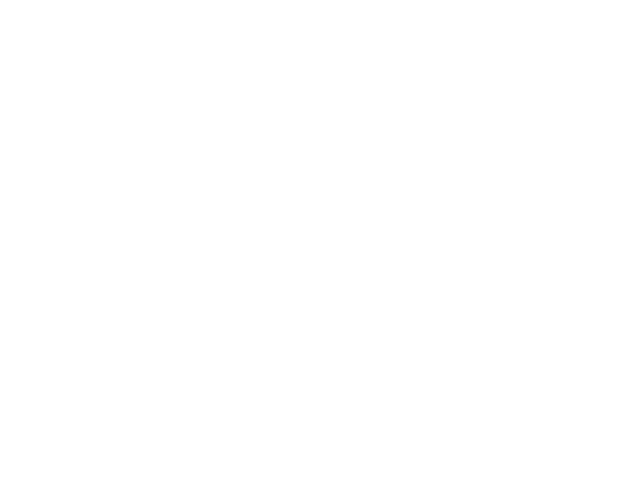

<IPython.core.display.Javascript object>


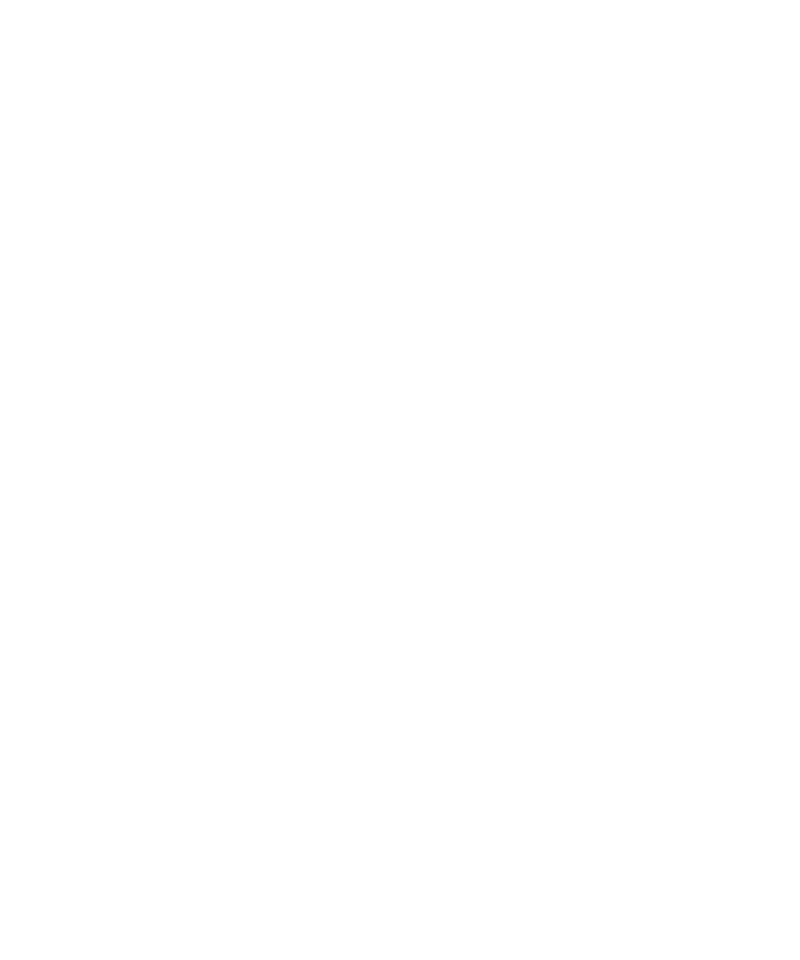

<IPython.core.display.Javascript object>


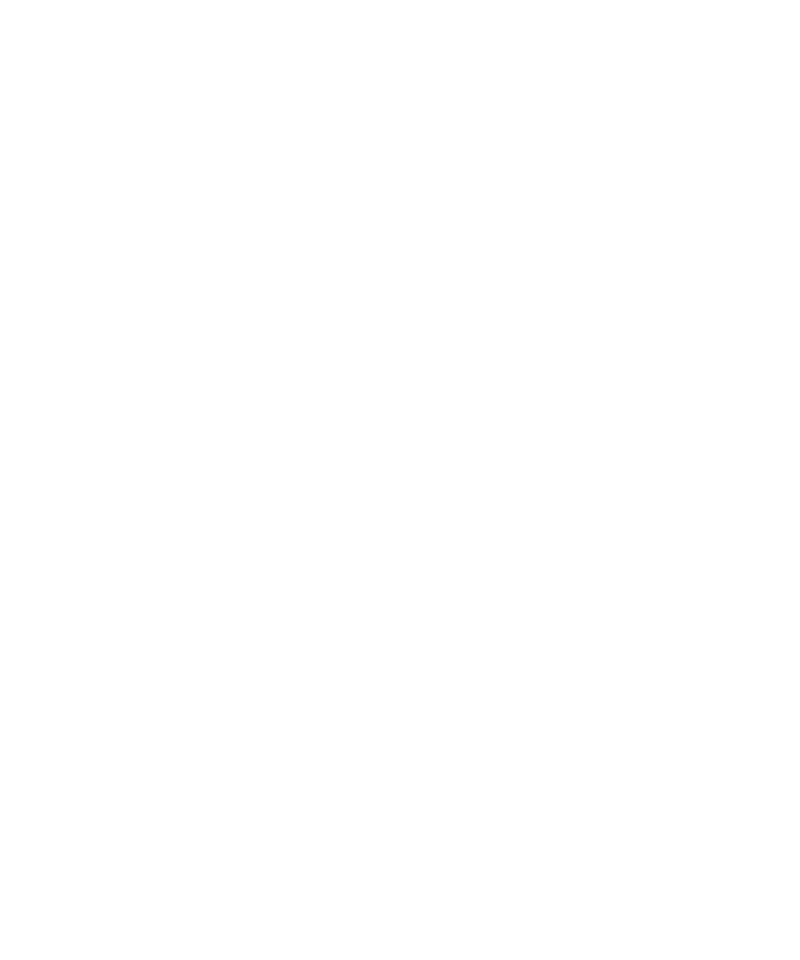

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/55fced8f/ with filename as uid=55fced8f-2a1c-4745-bb68-8a08f1845585_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/55fced8f/ 55fced /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=55fced8f_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=55fced8f_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 933472a7*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/933472a7/
The data are: S

<IPython.core.display.Javascript object>


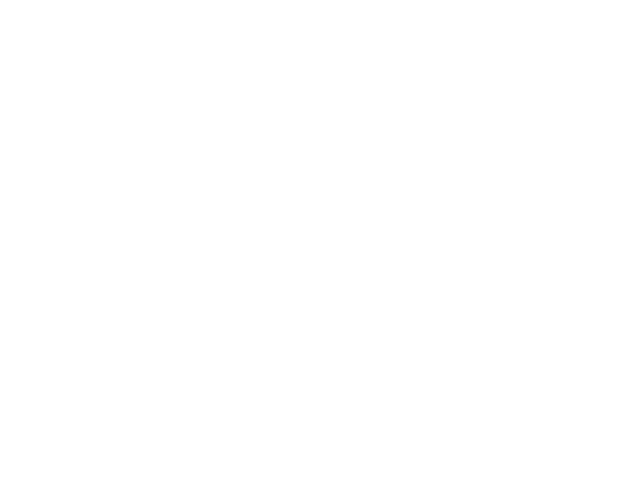

<IPython.core.display.Javascript object>


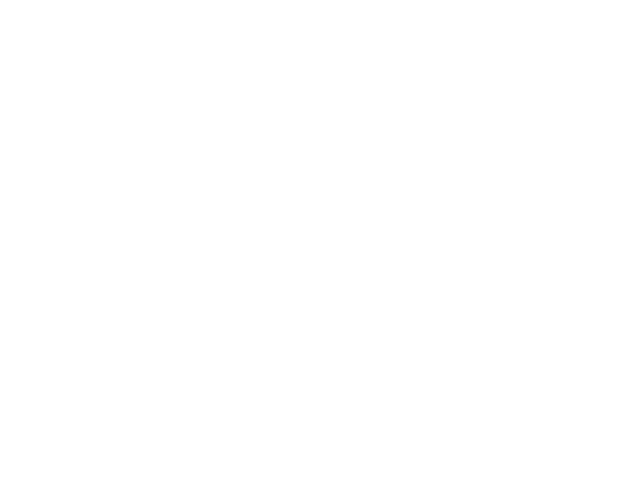

The non-zeros photon occupation is 0.009965022103622854.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_933472a7-f9a8-4937-a06c-d088bf2c520b.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=933472_fra_5_500


<IPython.core.display.Javascript object>


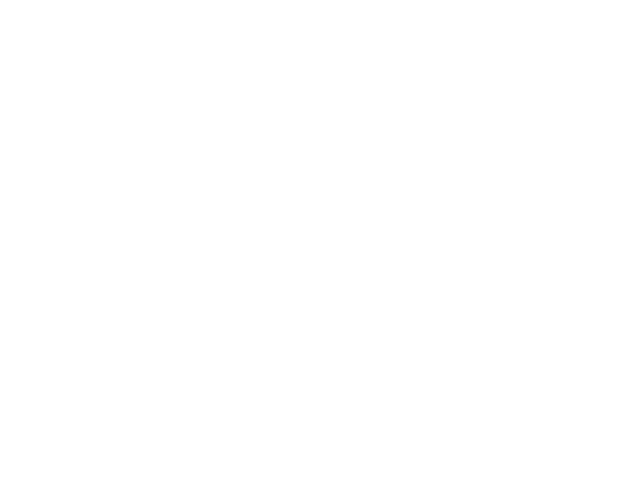

Total time: 11.720 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


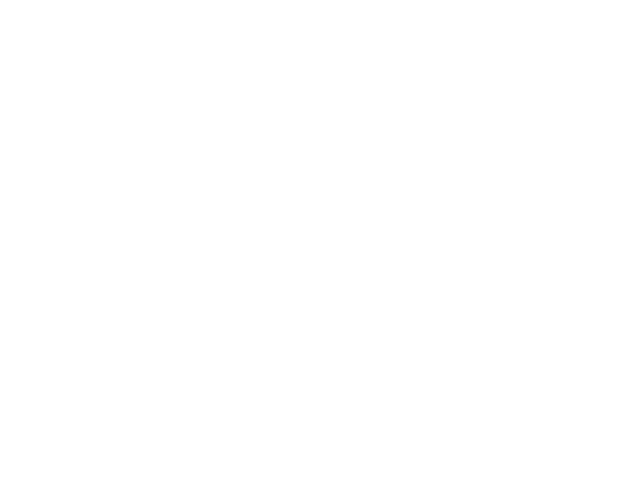

The bad frame list length is: 5


<IPython.core.display.Javascript object>


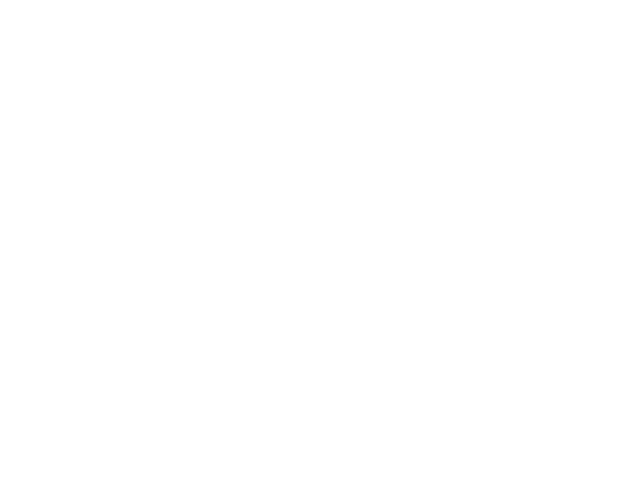

<IPython.core.display.Javascript object>


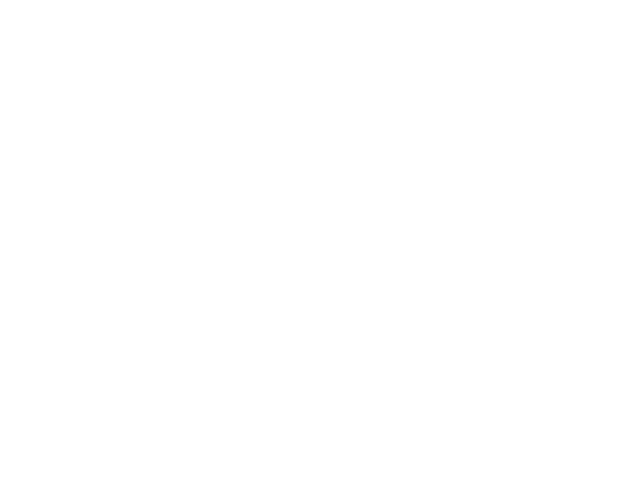

<IPython.core.display.Javascript object>


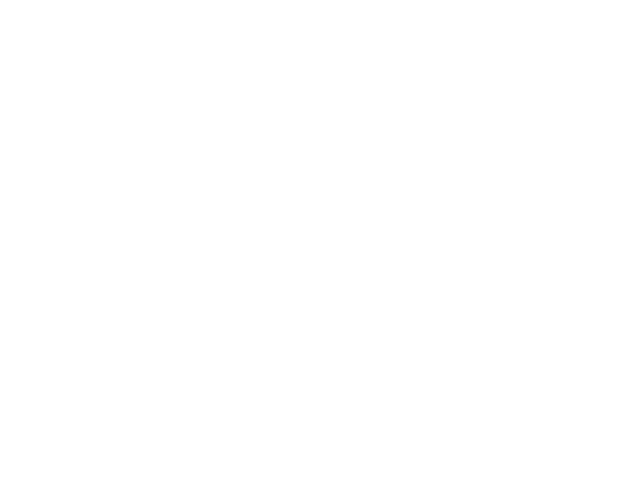

<IPython.core.display.Javascript object>


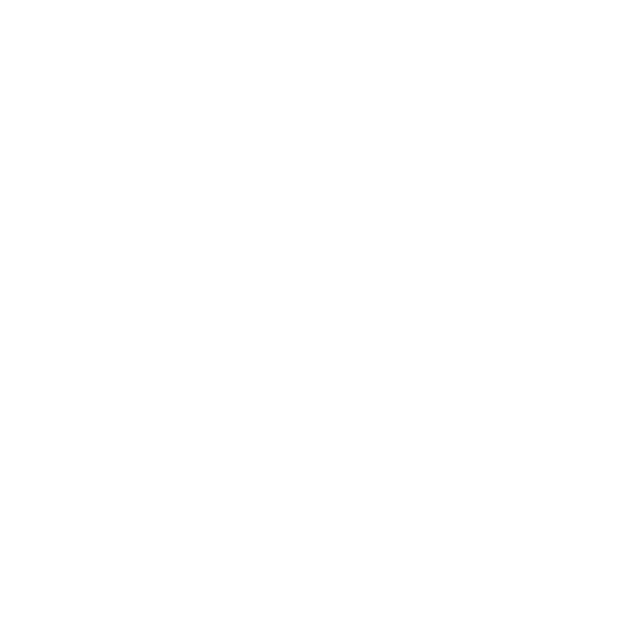

<IPython.core.display.Javascript object>


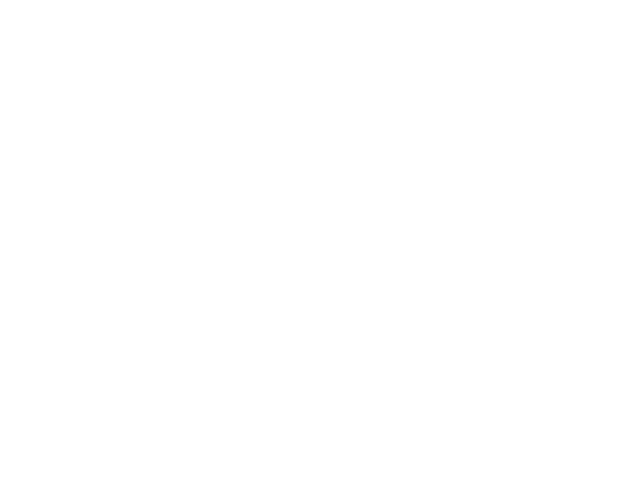

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 86.33it/s]


<IPython.core.display.Javascript object>


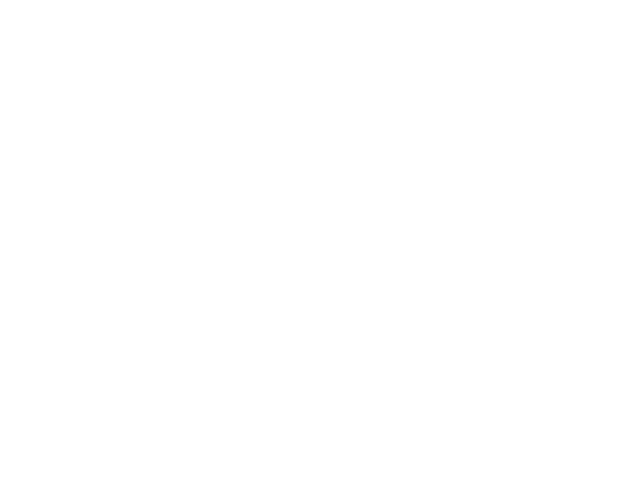

The file: uid=933472_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/


<IPython.core.display.Javascript object>


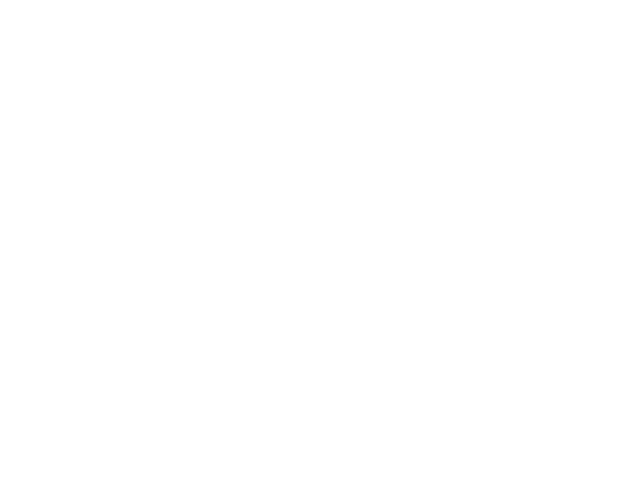

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 3076.14it/s]


<IPython.core.display.Javascript object>


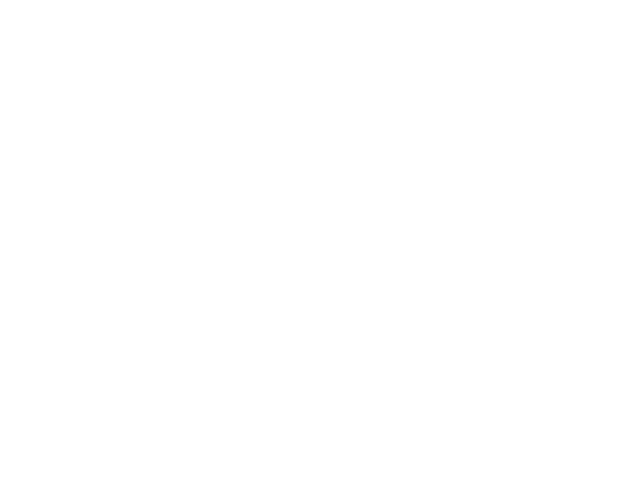

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 2153.37it/s]


<IPython.core.display.Javascript object>


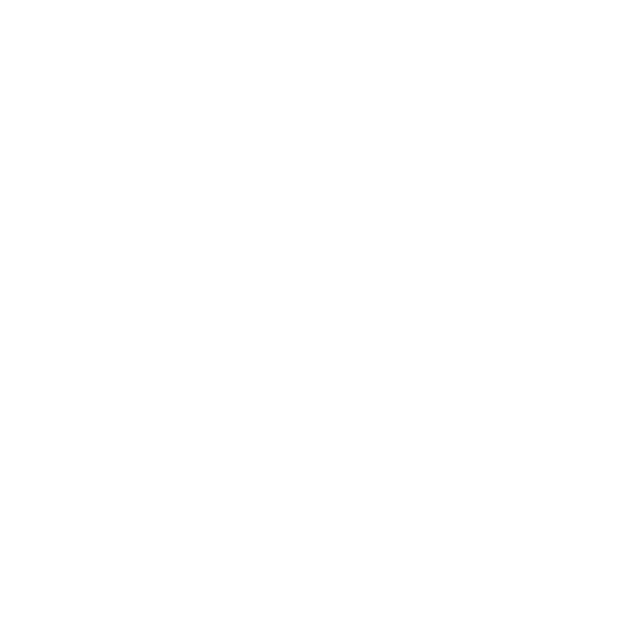

The file: uid=933472_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:08<00:00,  1.91it/s]


G2 calculation DONE!
Total time: 18.738 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/ with filename as uid=933472_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/uid=933472_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


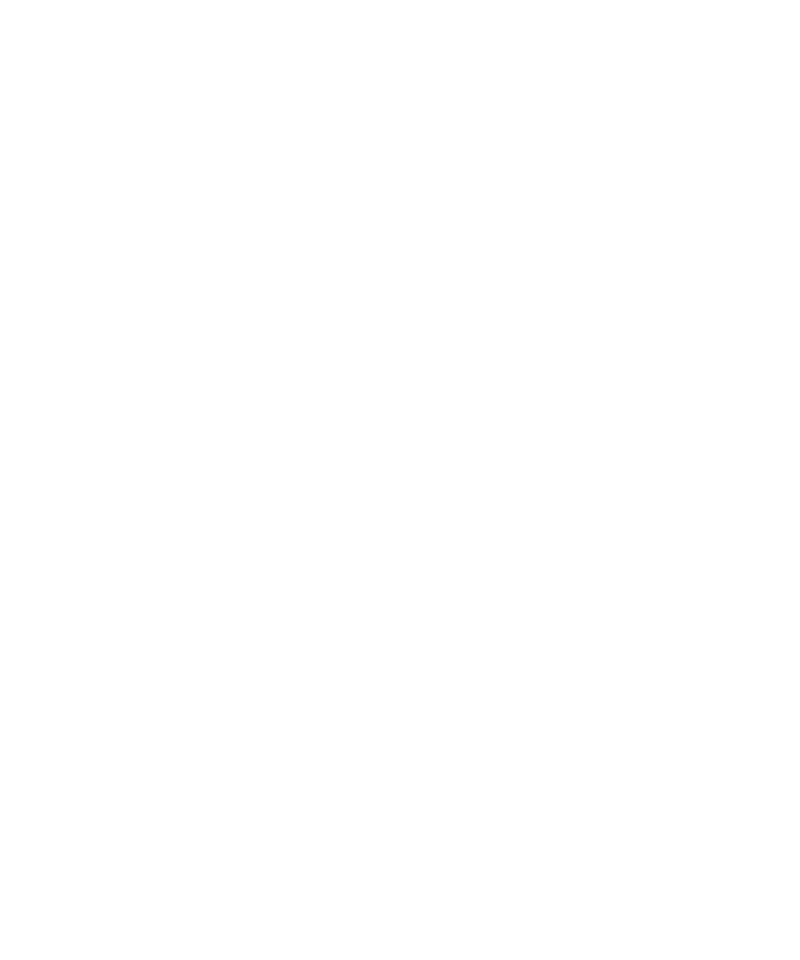

The fitted diffusion coefficient D0 is:  2.054e+06   A^2S-1


<IPython.core.display.Javascript object>


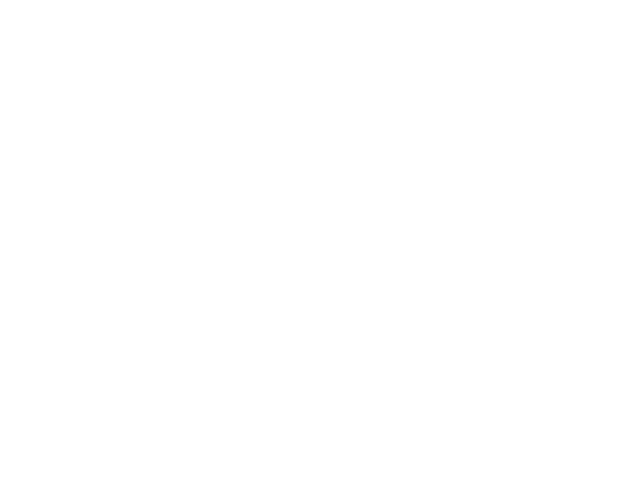

100%|██████████| 16/16 [00:06<00:00,  2.08it/s]

Total time: 6.702 sec


<IPython.core.display.Javascript object>


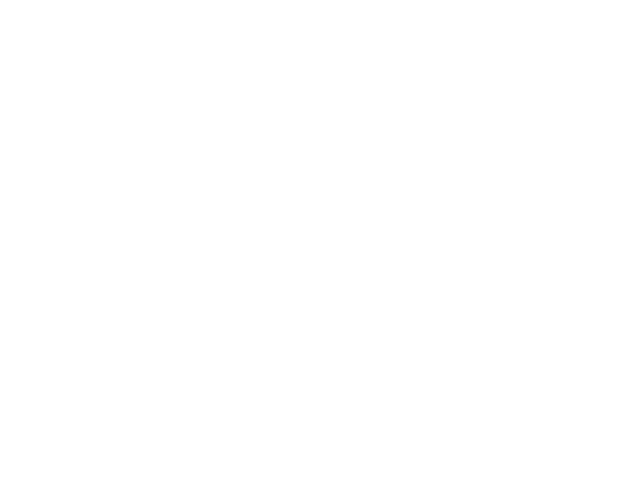

Total time: 0.102 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/ with filename as uid=933472_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/933472a7/uid=933472_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.882e+06   A^2S-1


<IPython.core.display.Javascript object>


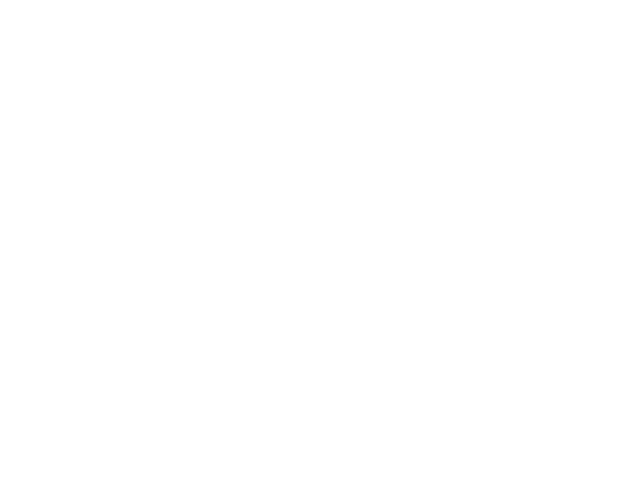

<IPython.core.display.Javascript object>


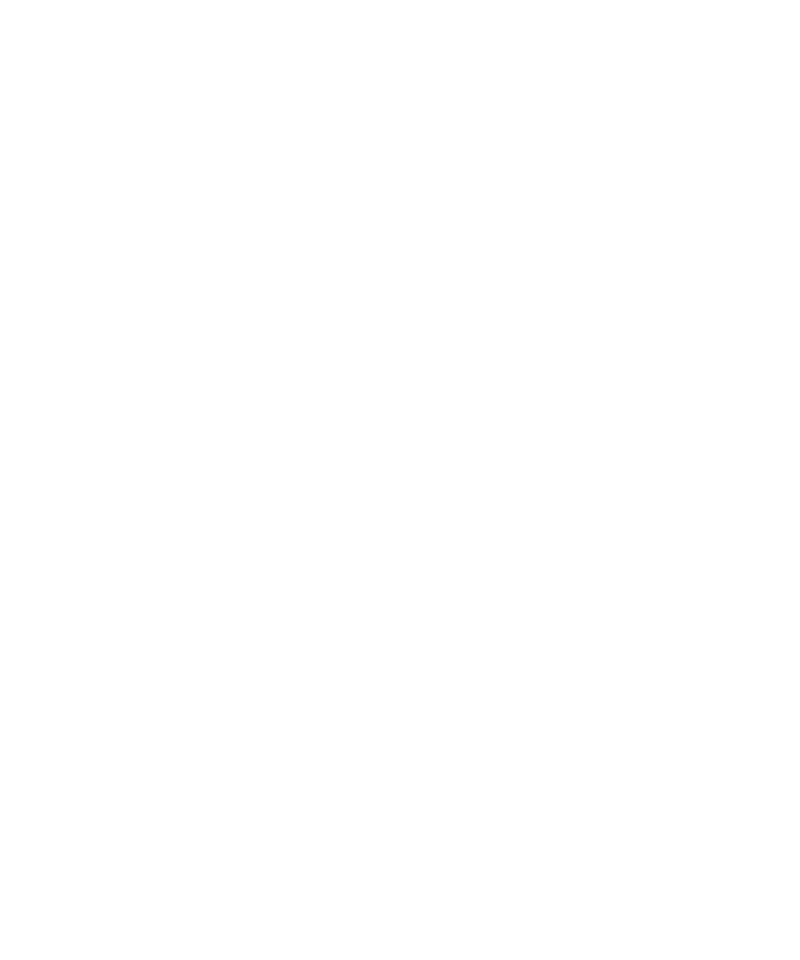

<IPython.core.display.Javascript object>


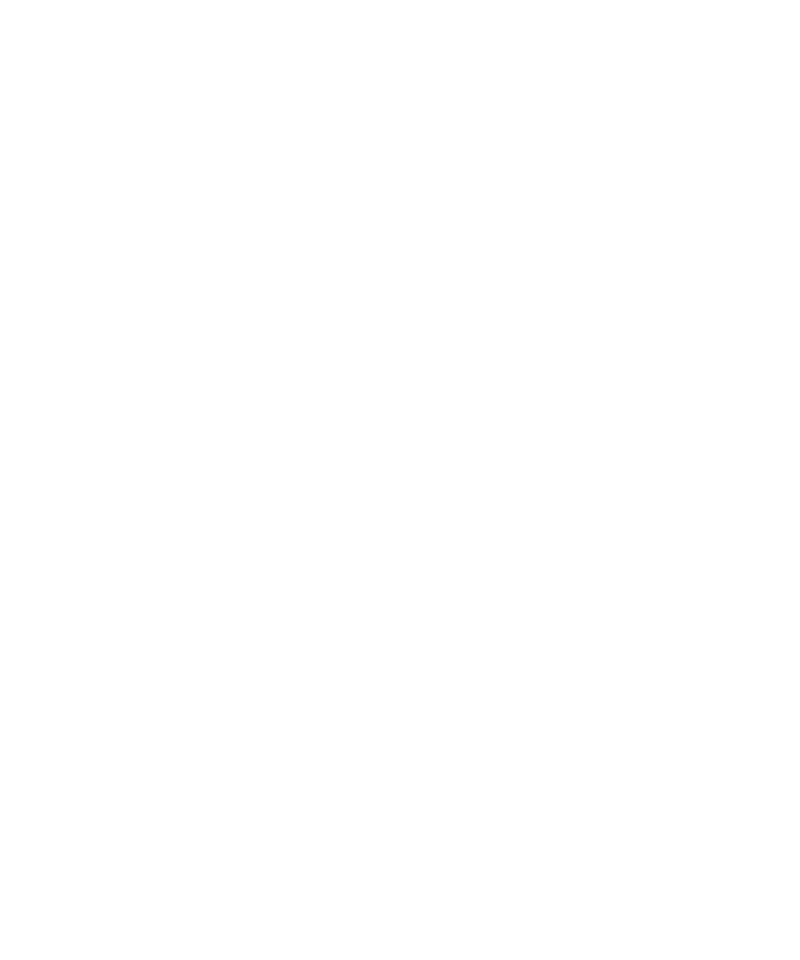

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/933472a7/ with filename as uid=933472a7-f9a8-4937-a06c-d088bf2c520b_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/933472a7/ 933472 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=933472a7_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=933472a7_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 9fd0814c*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/
The data are: S

<IPython.core.display.Javascript object>


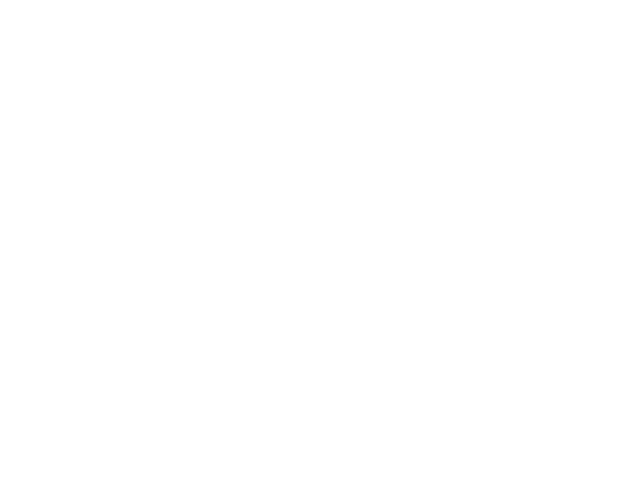

<IPython.core.display.Javascript object>


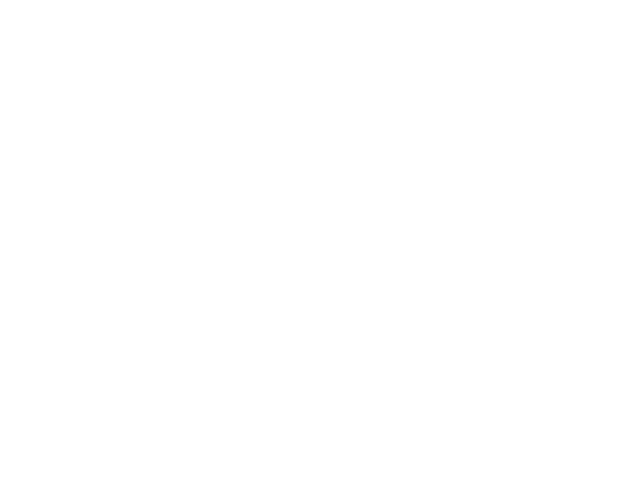

The non-zeros photon occupation is 0.010653433474002884.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_9fd0814c-8b02-4619-8358-19edf577ff38.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=9fd081_fra_5_500


<IPython.core.display.Javascript object>


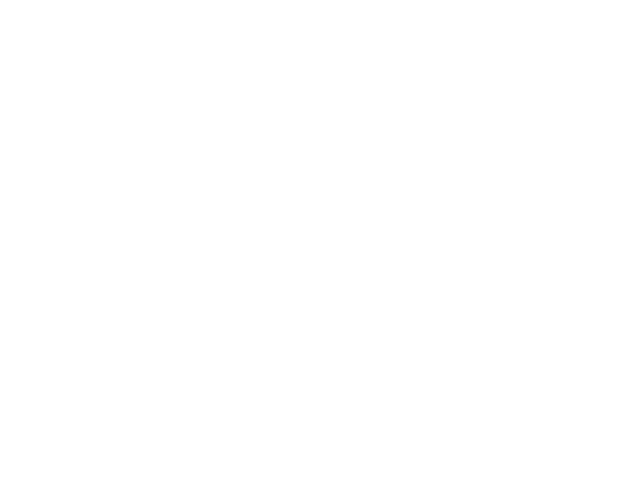

Total time: 11.433 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


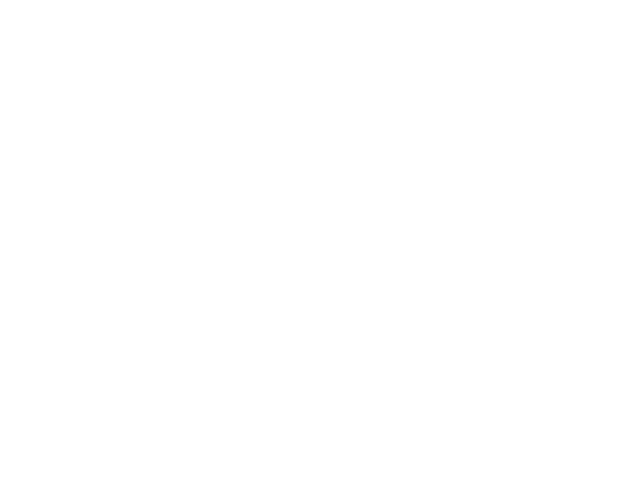

The bad frame list length is: 5


<IPython.core.display.Javascript object>


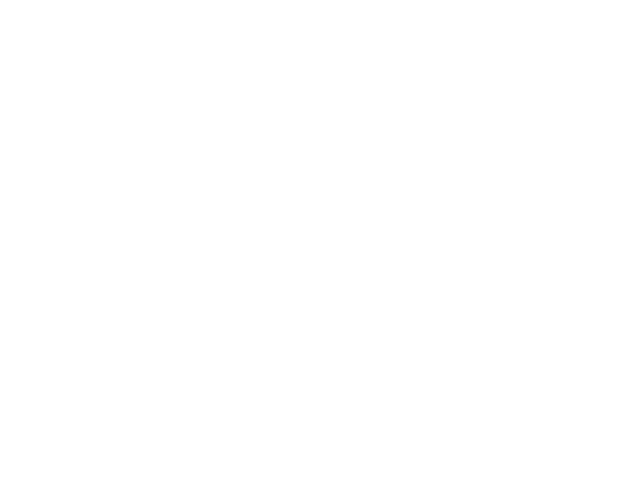

<IPython.core.display.Javascript object>


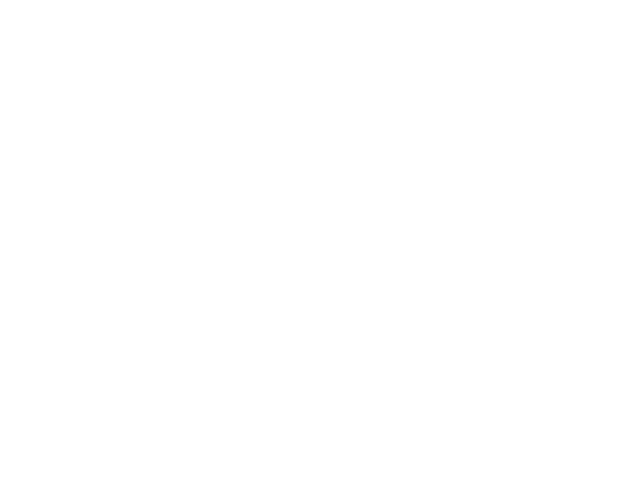

<IPython.core.display.Javascript object>


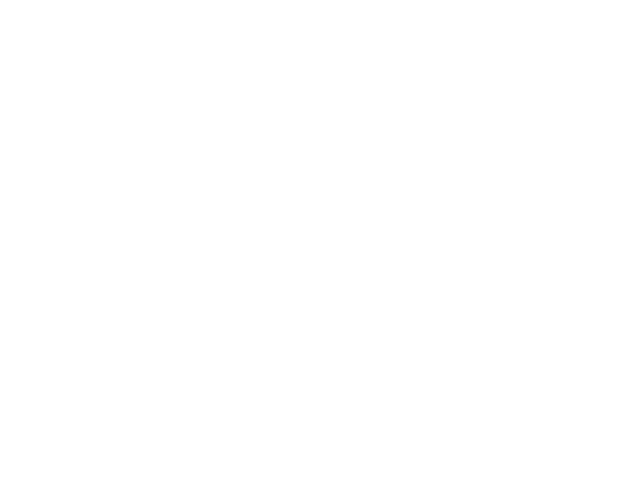

<IPython.core.display.Javascript object>


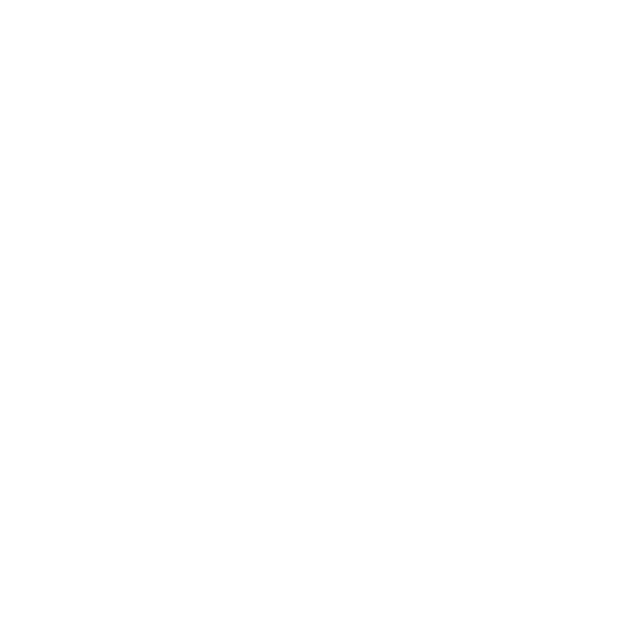

<IPython.core.display.Javascript object>


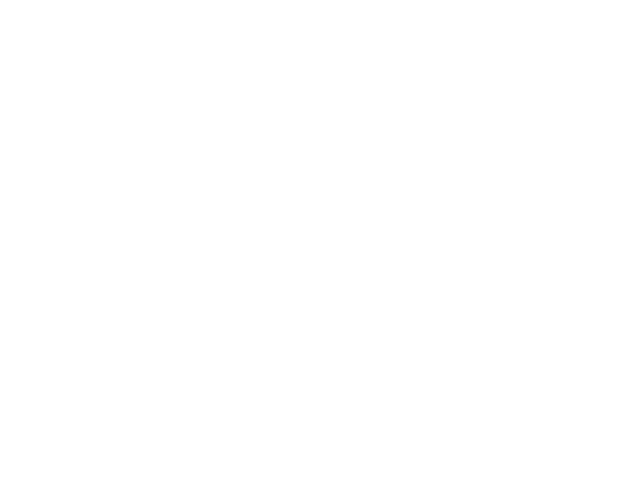

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 83.94it/s]


<IPython.core.display.Javascript object>


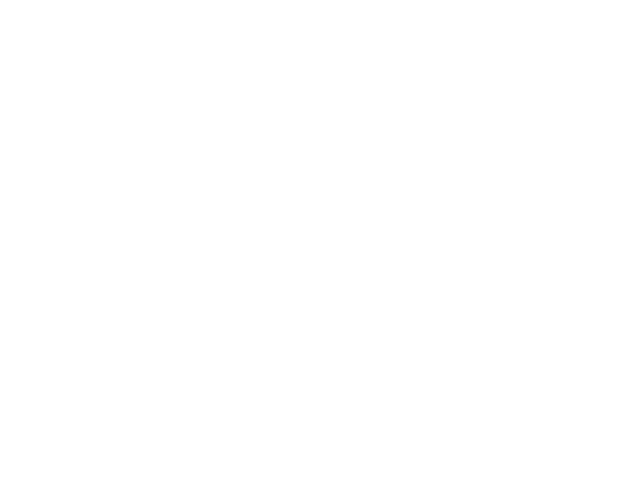

The file: uid=9fd081_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/


<IPython.core.display.Javascript object>


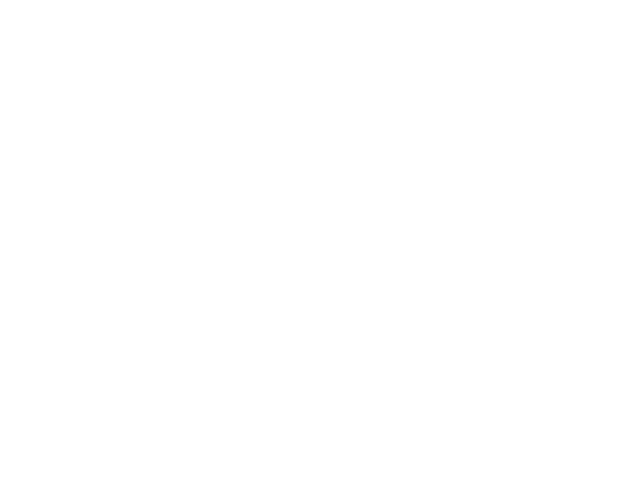

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 2927.18it/s]


<IPython.core.display.Javascript object>


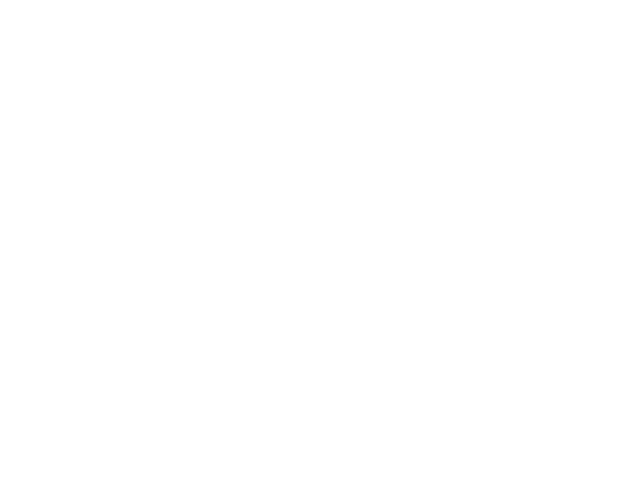

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1973.55it/s]


<IPython.core.display.Javascript object>


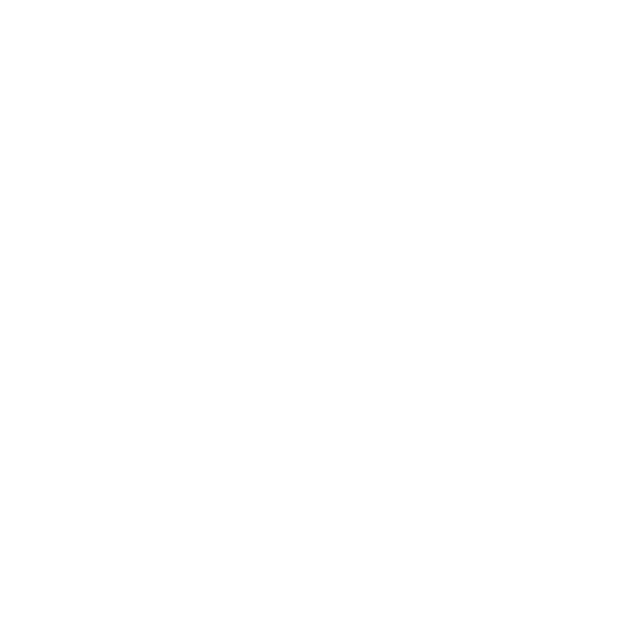

The file: uid=9fd081_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:08<00:00,  1.86it/s]


G2 calculation DONE!
Total time: 18.896 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/ with filename as uid=9fd081_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/uid=9fd081_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


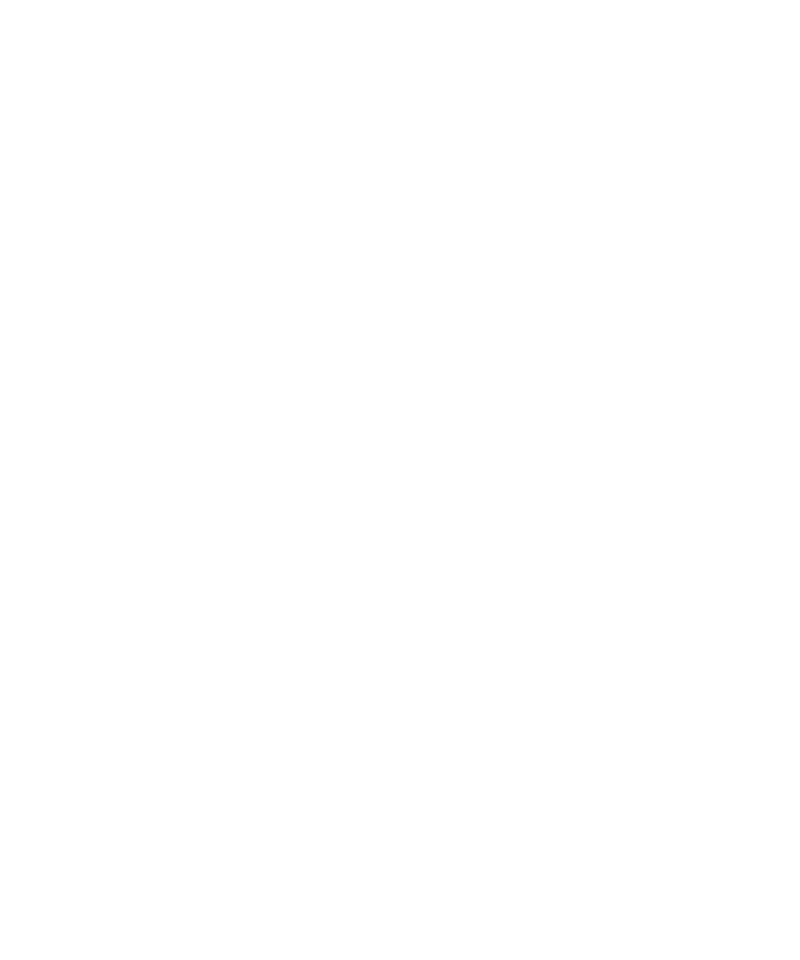

The fitted diffusion coefficient D0 is:  1.885e+06   A^2S-1


<IPython.core.display.Javascript object>


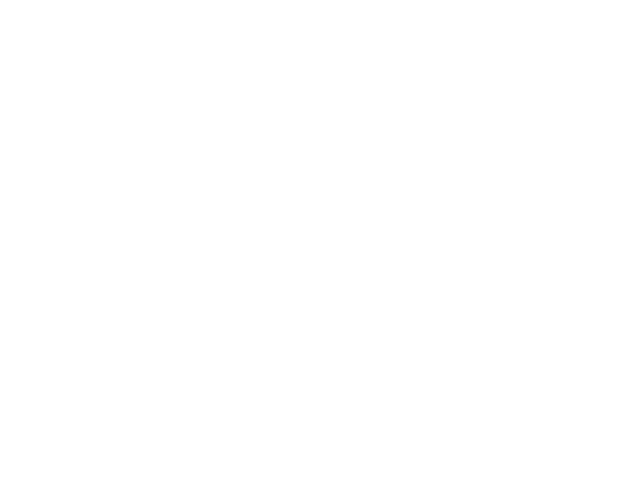

100%|██████████| 16/16 [00:06<00:00,  2.11it/s]

Total time: 6.306 sec


<IPython.core.display.Javascript object>


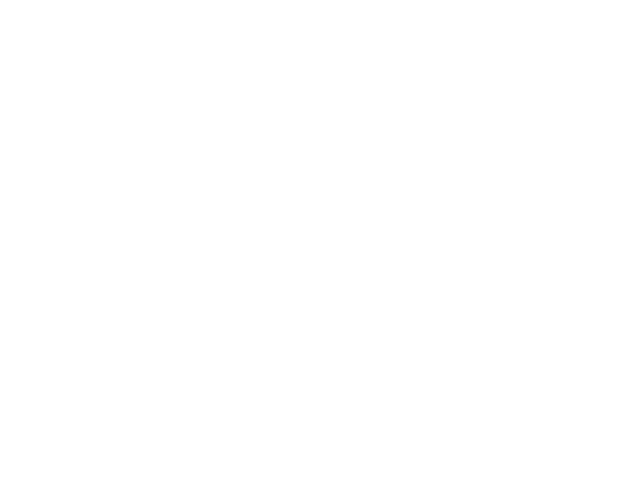

Total time: 0.049 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/ with filename as uid=9fd081_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/uid=9fd081_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  5.475e+05   A^2S-1


<IPython.core.display.Javascript object>


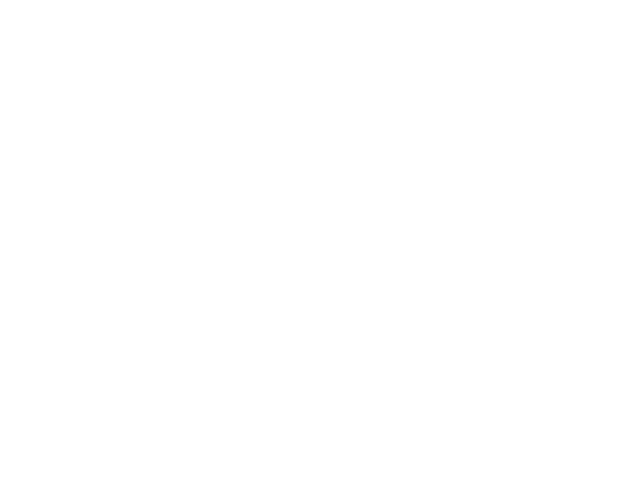

<IPython.core.display.Javascript object>


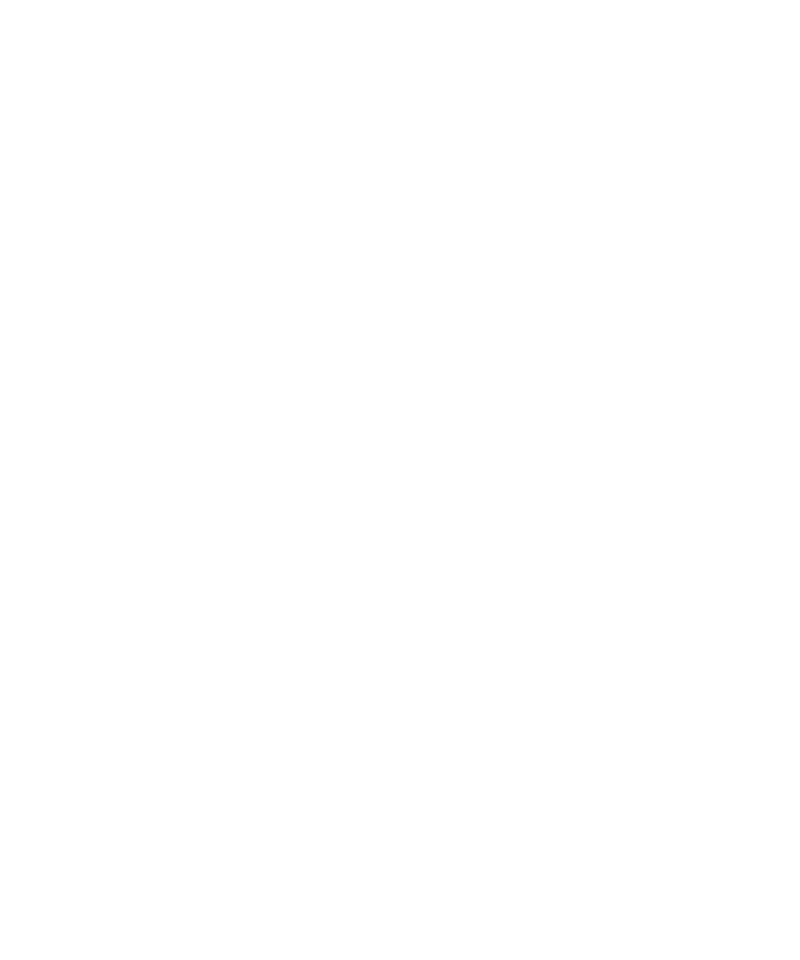

<IPython.core.display.Javascript object>


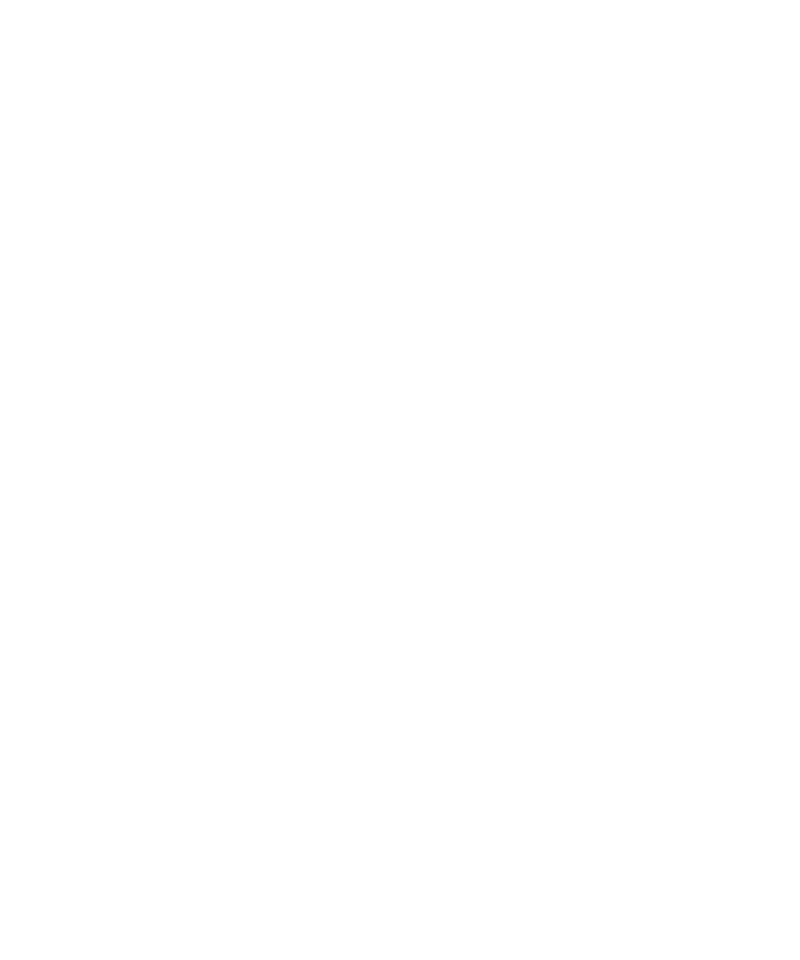

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/9fd0814c/ with filename as uid=9fd0814c-8b02-4619-8358-19edf577ff38_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/9fd0814c/ 9fd081 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=9fd0814c_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=9fd0814c_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: b5f86aa9*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/
The data are: S

<IPython.core.display.Javascript object>


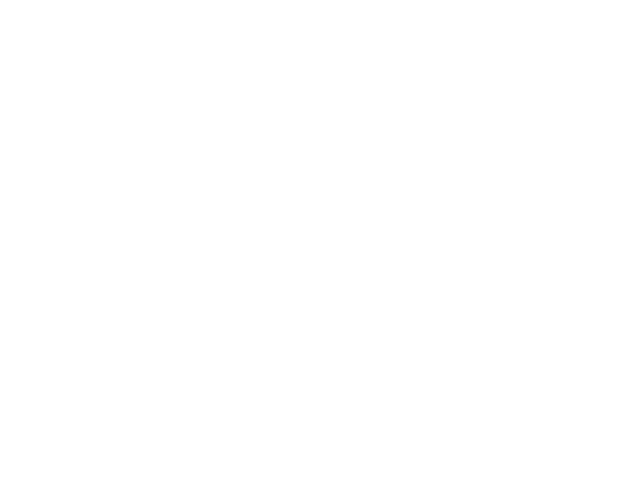

<IPython.core.display.Javascript object>


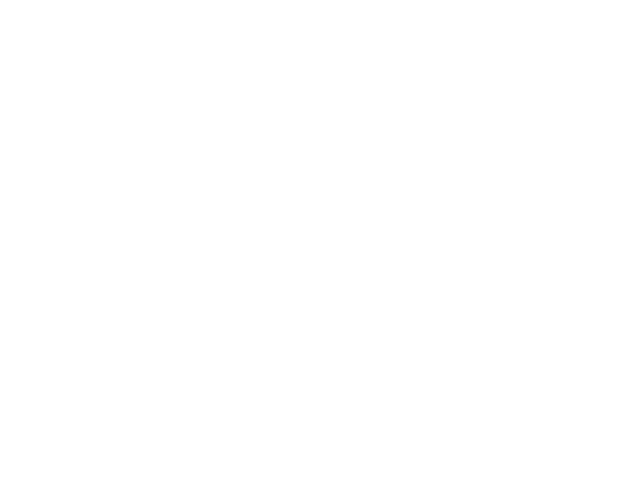

The non-zeros photon occupation is 0.009481484453896724.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_b5f86aa9-1d3a-4e41-aee1-120eab2fcc79.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=b5f86a_fra_5_500


<IPython.core.display.Javascript object>


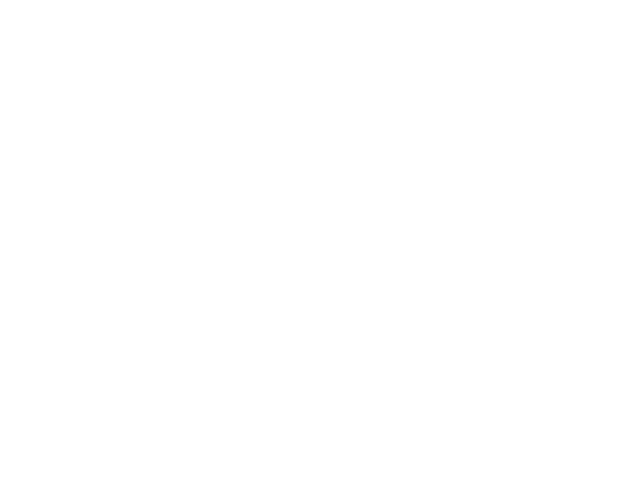

Total time: 11.101 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


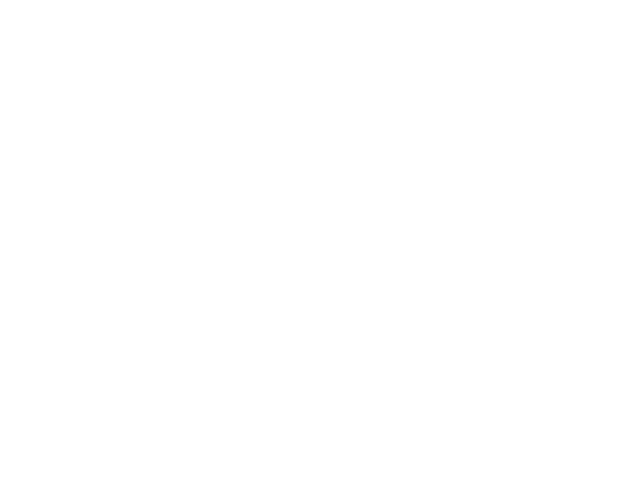

The bad frame list length is: 5


<IPython.core.display.Javascript object>


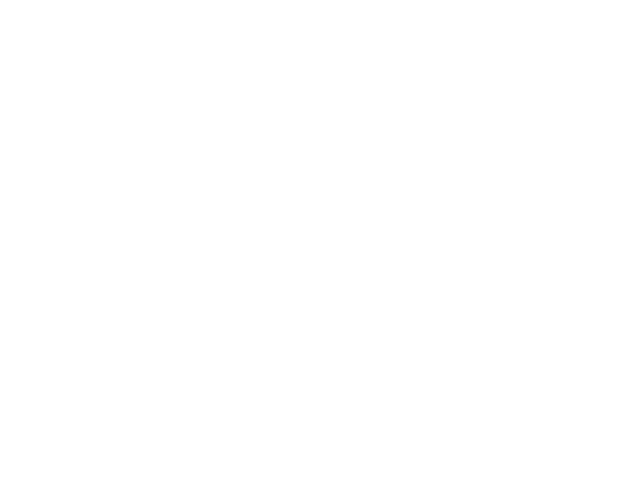

<IPython.core.display.Javascript object>


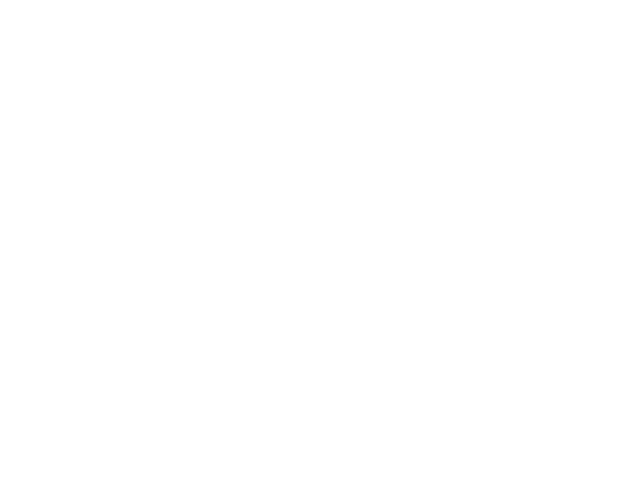

<IPython.core.display.Javascript object>


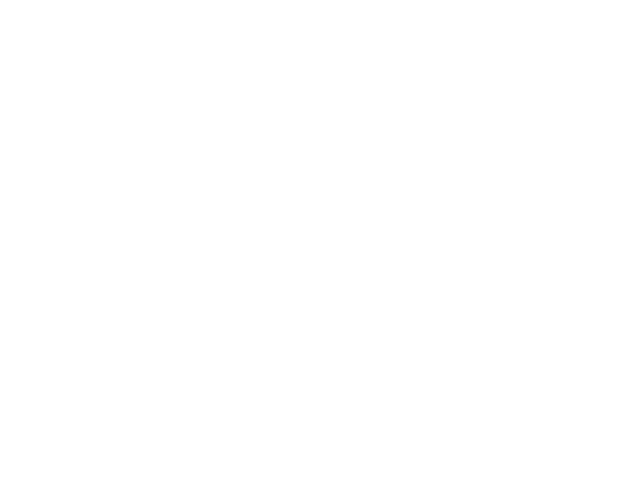

<IPython.core.display.Javascript object>


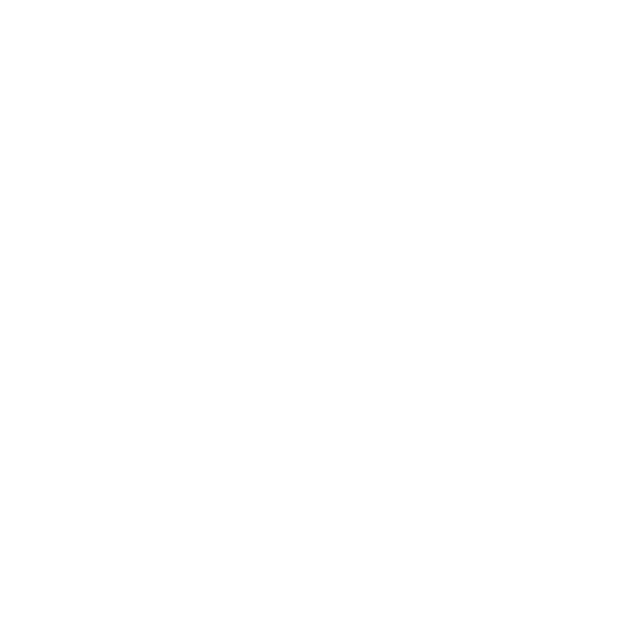

<IPython.core.display.Javascript object>


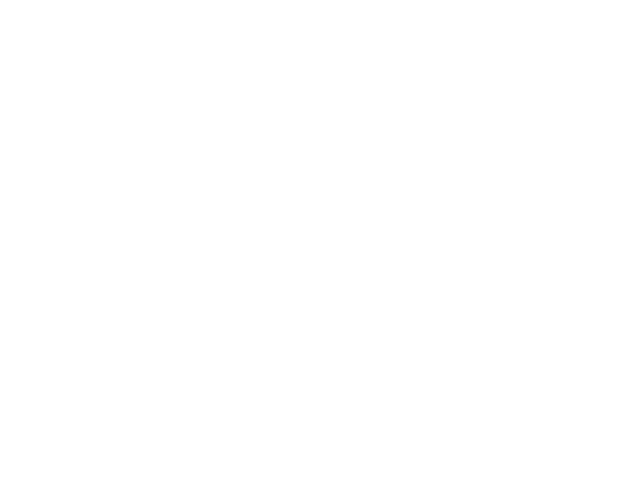

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 83.06it/s]


<IPython.core.display.Javascript object>


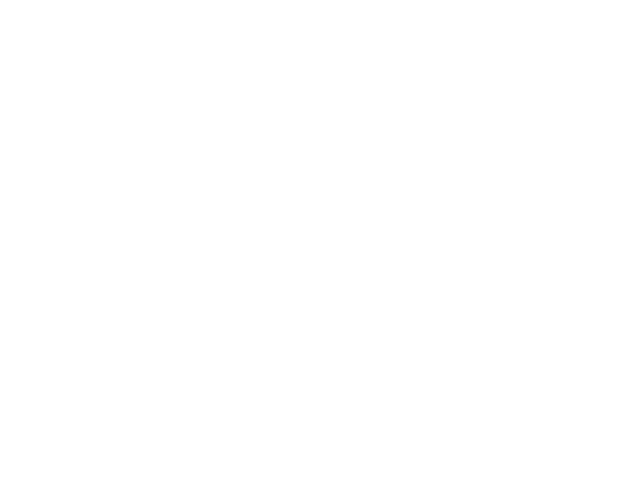

The file: uid=b5f86a_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/


<IPython.core.display.Javascript object>


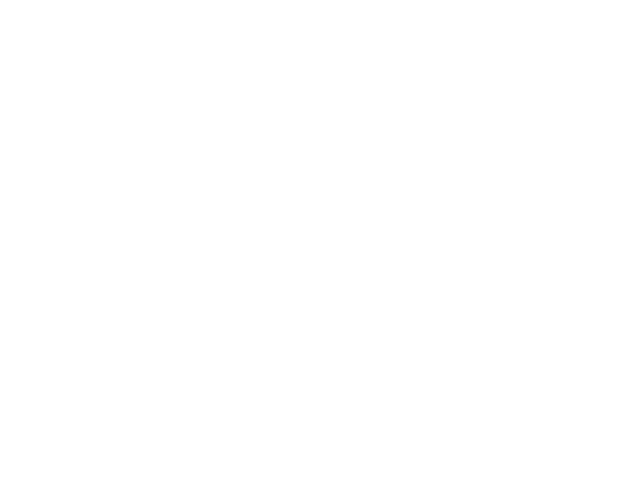

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 3266.03it/s]


<IPython.core.display.Javascript object>


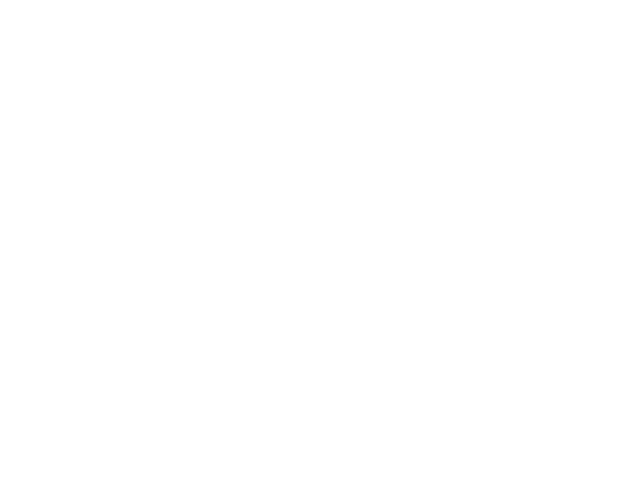

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1113.35it/s]


<IPython.core.display.Javascript object>


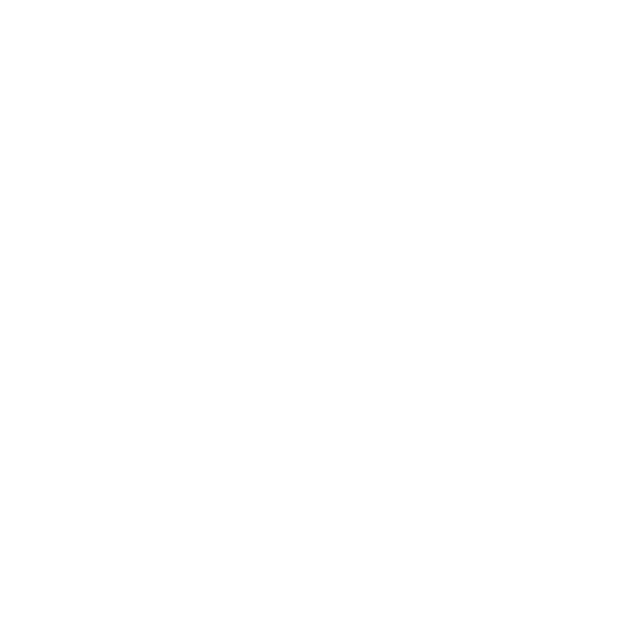

The file: uid=b5f86a_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:08<00:00,  1.81it/s]


G2 calculation DONE!
Total time: 19.219 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/ with filename as uid=b5f86a_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/uid=b5f86a_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


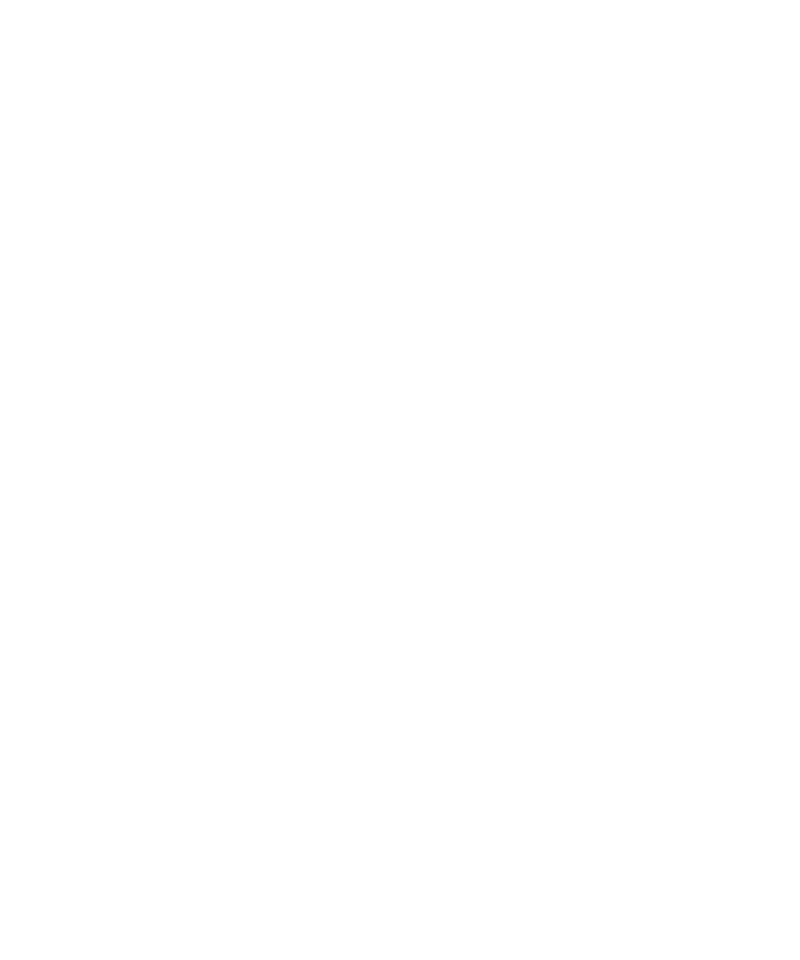

The fitted diffusion coefficient D0 is:  9.885e+04   A^2S-1


<IPython.core.display.Javascript object>


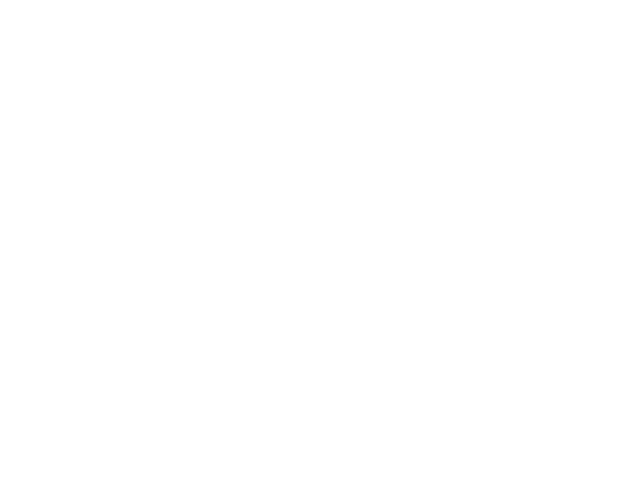

100%|██████████| 16/16 [00:06<00:00,  1.92it/s]

Total time: 6.945 sec


<IPython.core.display.Javascript object>


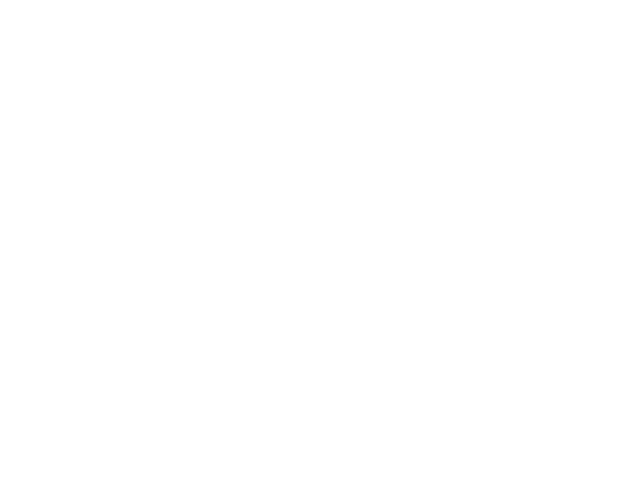

Total time: 0.123 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/ with filename as uid=b5f86a_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/uid=b5f86a_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.227e+05   A^2S-1


<IPython.core.display.Javascript object>


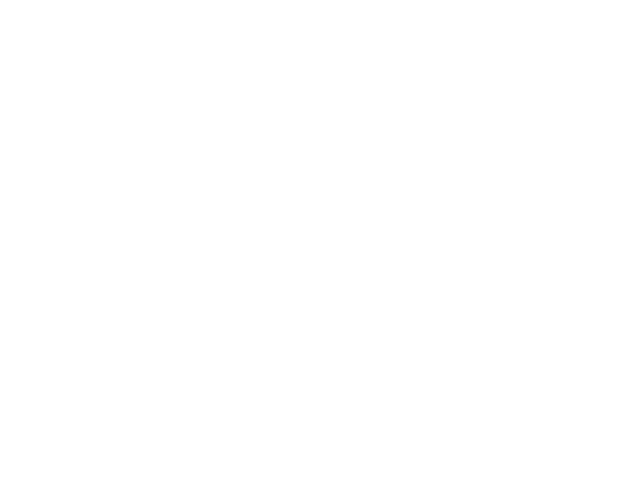

<IPython.core.display.Javascript object>


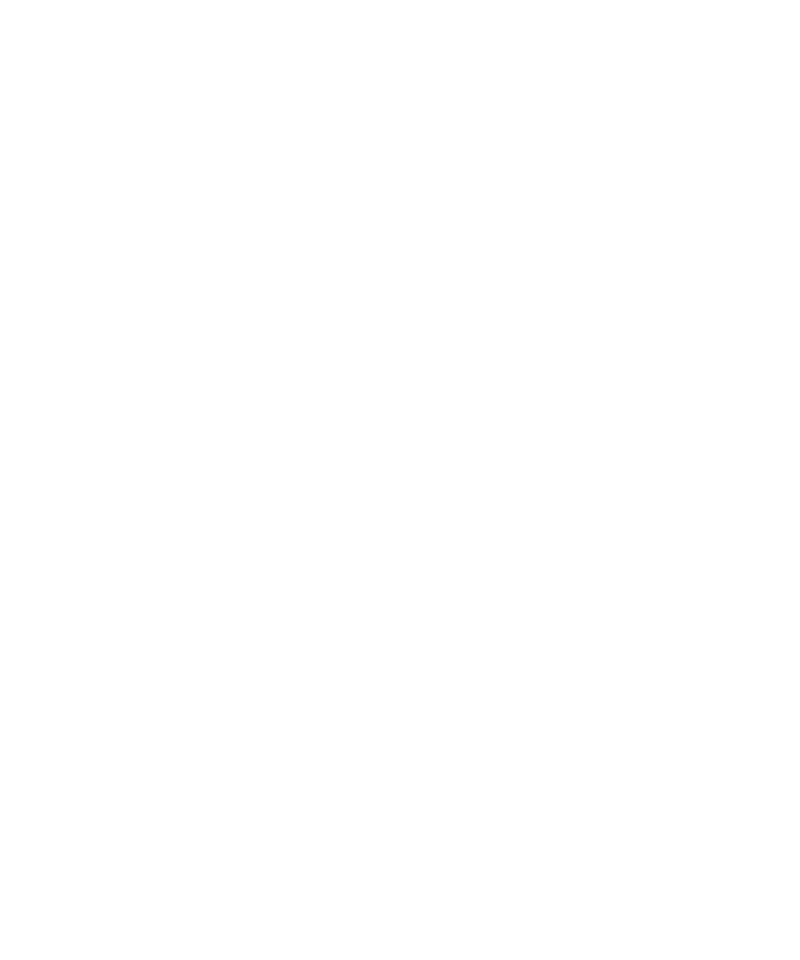

<IPython.core.display.Javascript object>


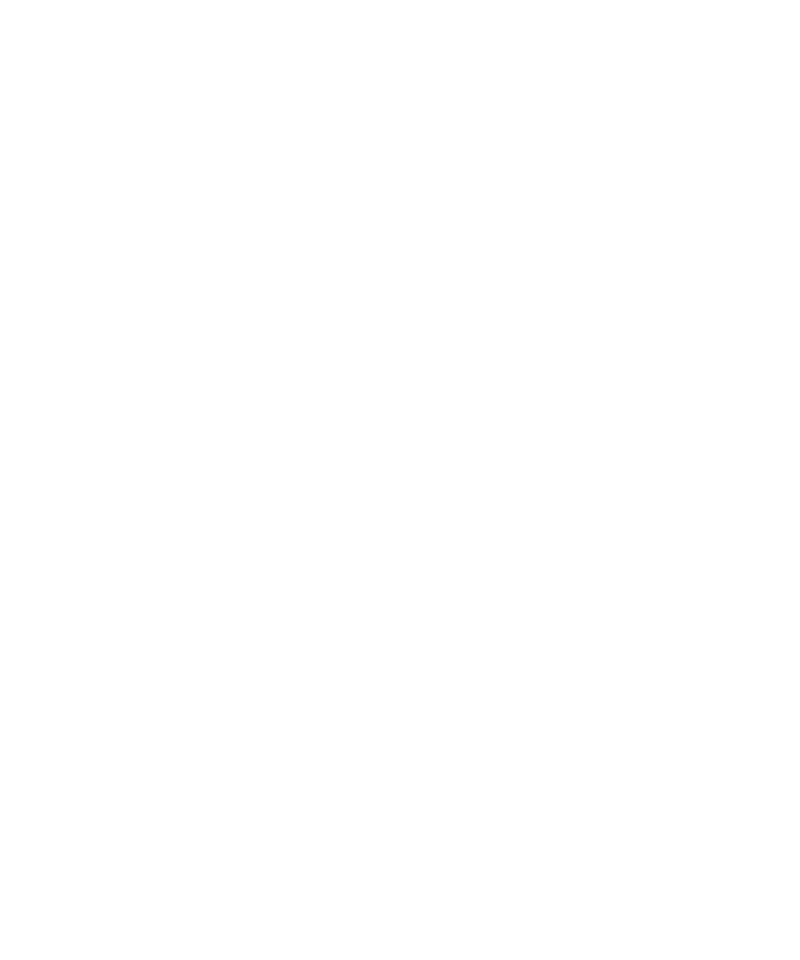

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/ with filename as uid=b5f86aa9-1d3a-4e41-aee1-120eab2fcc79_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/b5f86aa9/ b5f86a /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=b5f86aa9_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=b5f86aa9_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/
****************************************
*****The processing uid is: 2d7330ca*****
****************************************
Results from this analysis will be stashed in the directory /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/
The data are: S

<IPython.core.display.Javascript object>


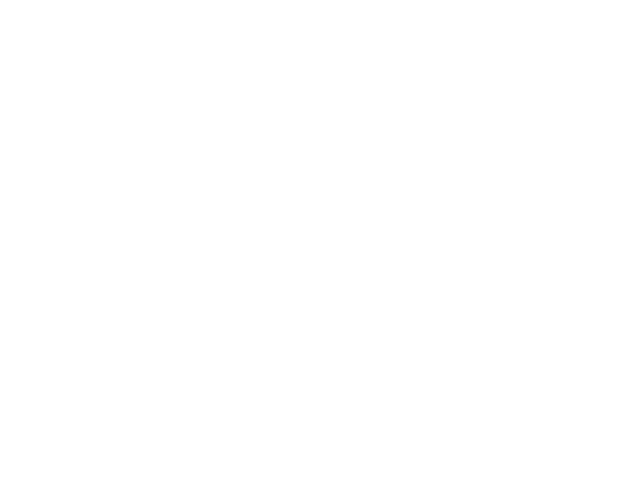

<IPython.core.display.Javascript object>


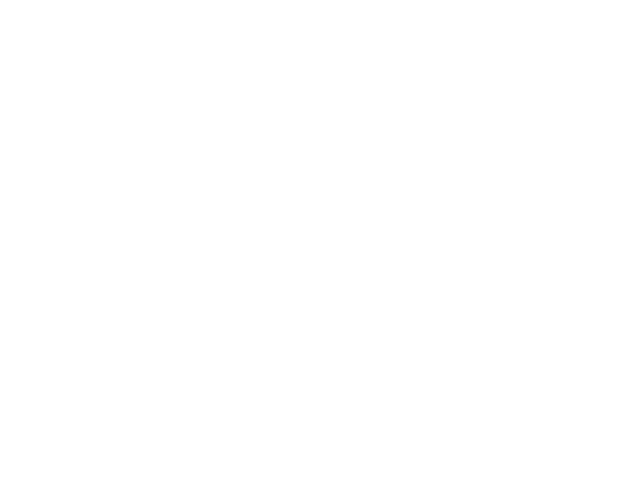

The non-zeros photon occupation is 0.005772801954660264.
Will Always DO apply compress process.
Create a new compress file with filename as :/XF11ID/analysis/Compressed_Data/uid_2d7330ca-5ec6-4cd8-864c-bb721c1d4778.cmp.
Using a multiprocess to compress the data.
It will create 5 temporary files for parallel compression.
#####No bad frames are involved.
Combining the seperated compressed files together...
The good_start frame number is: 5 
uid=2d7330_fra_5_500


<IPython.core.display.Javascript object>


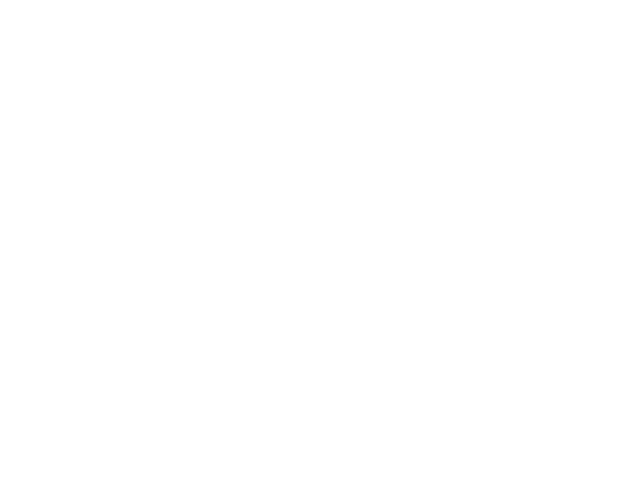

Total time: 11.588 sec


/opt/conda_envs/analysis/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


<IPython.core.display.Javascript object>


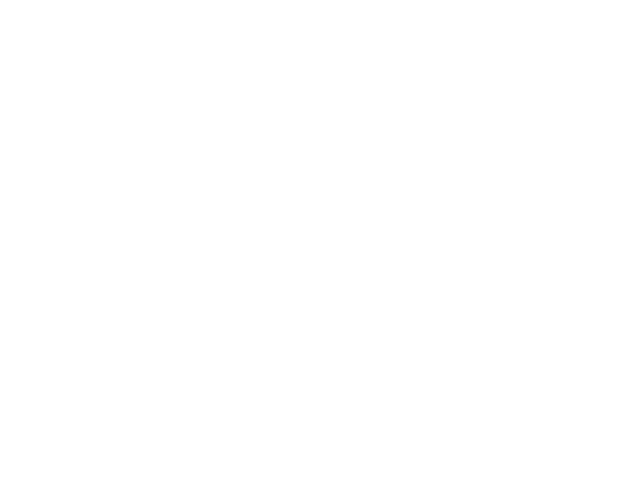

The bad frame list length is: 5


<IPython.core.display.Javascript object>


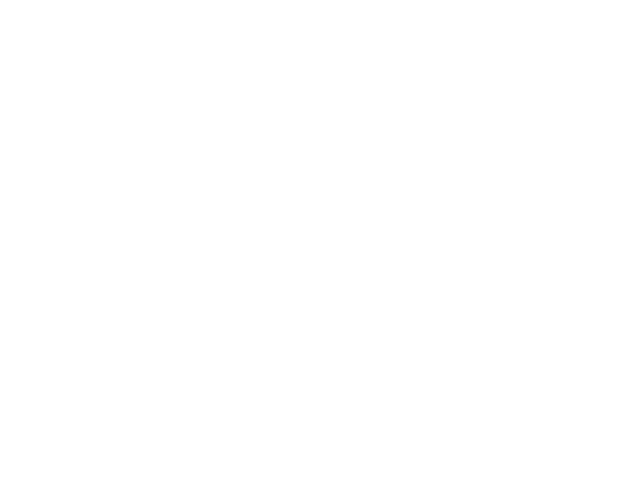

<IPython.core.display.Javascript object>


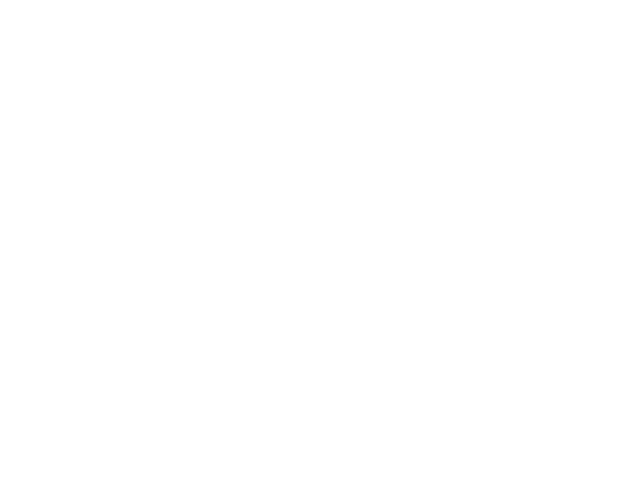

<IPython.core.display.Javascript object>


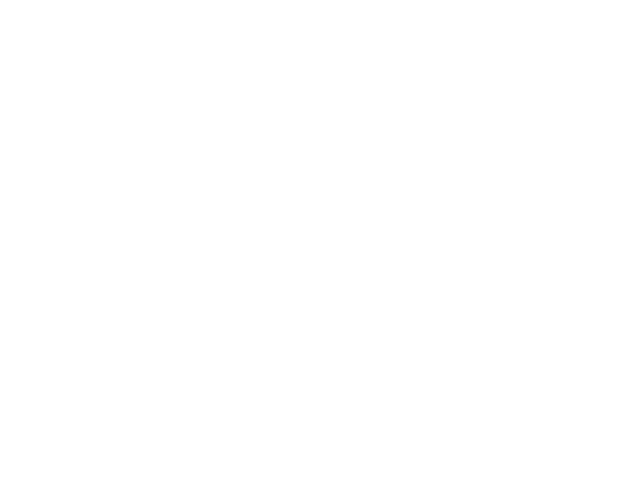

<IPython.core.display.Javascript object>


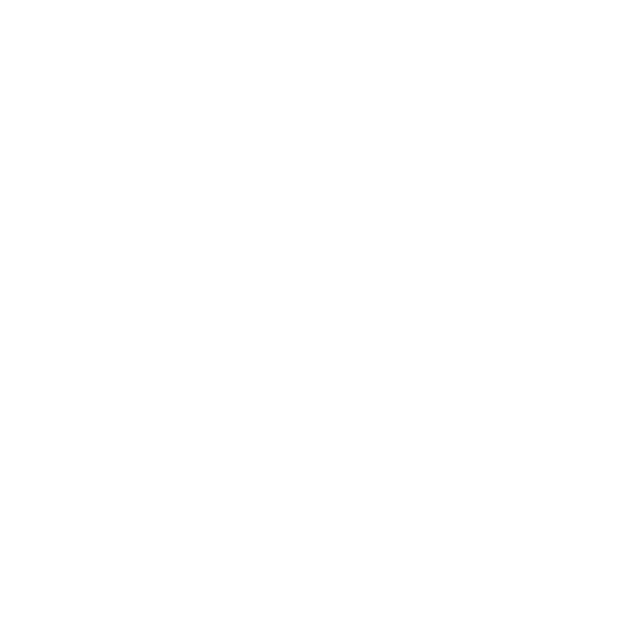

<IPython.core.display.Javascript object>


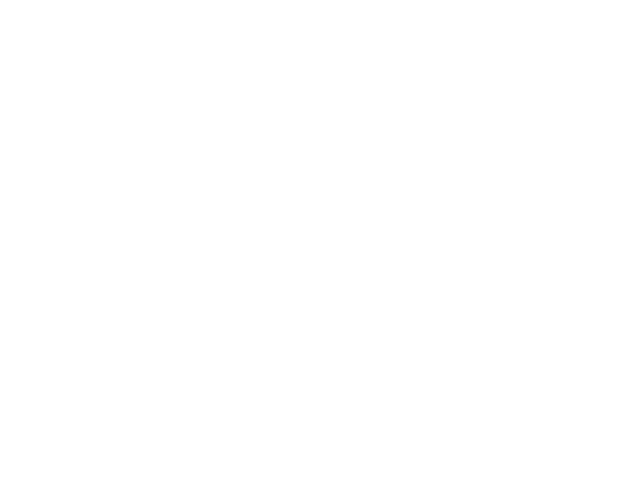

Averaging 1 images: 100%|██████████| 1/1 [00:00<00:00, 88.27it/s]


<IPython.core.display.Javascript object>


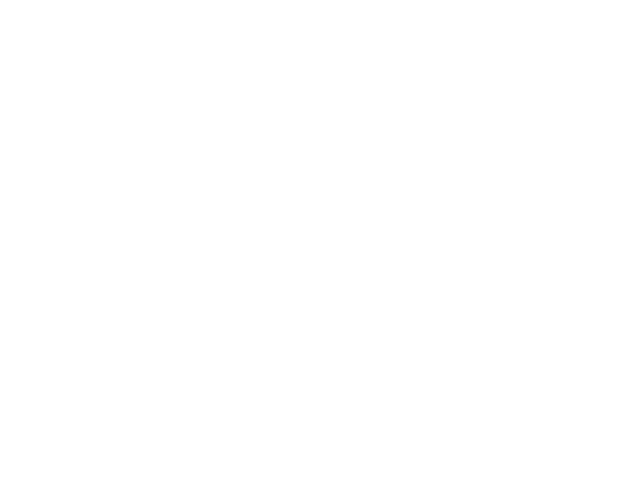

The file: uid=2d7330_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/


<IPython.core.display.Javascript object>


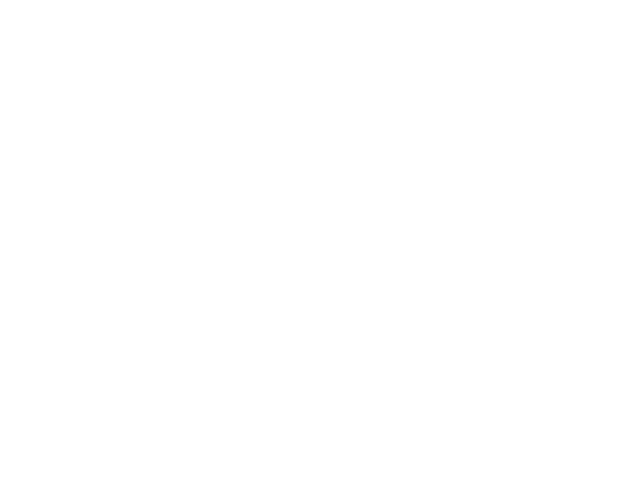

Get waterfall for q index=1: 100%|██████████| 495/495 [00:00<00:00, 3332.85it/s]


<IPython.core.display.Javascript object>


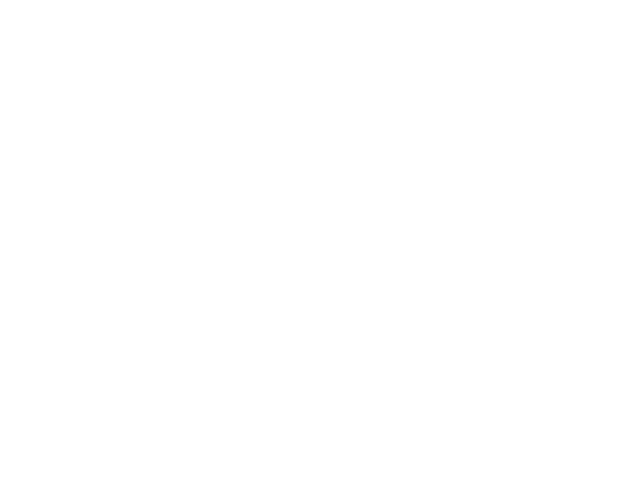

Get ROI intensity of each frame: 100%|██████████| 495/495 [00:00<00:00, 1175.73it/s]


<IPython.core.display.Javascript object>


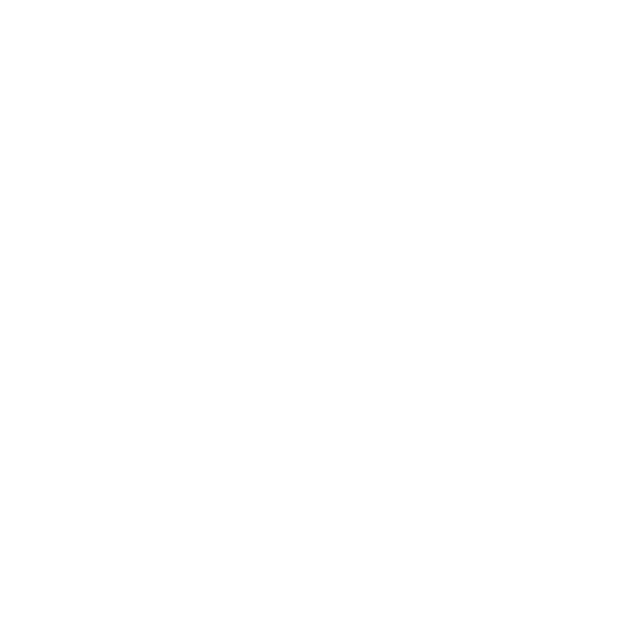

The file: uid=2d7330_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/
In this g2 calculation, the buf and lev number are: 8--8--
5 Bad frames involved and will be discarded!
496 frames will be processed...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting assign the tasks...


  0%|          | 0/16 [00:00<?, ?it/s]

Starting running the tasks...


100%|██████████| 16/16 [00:08<00:00,  1.89it/s]


G2 calculation DONE!
Total time: 19.889 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/ with filename as uid=2d7330_fra_5_500_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/uid=2d7330_fra_5_500_g2_fit_paras.csv


<IPython.core.display.Javascript object>


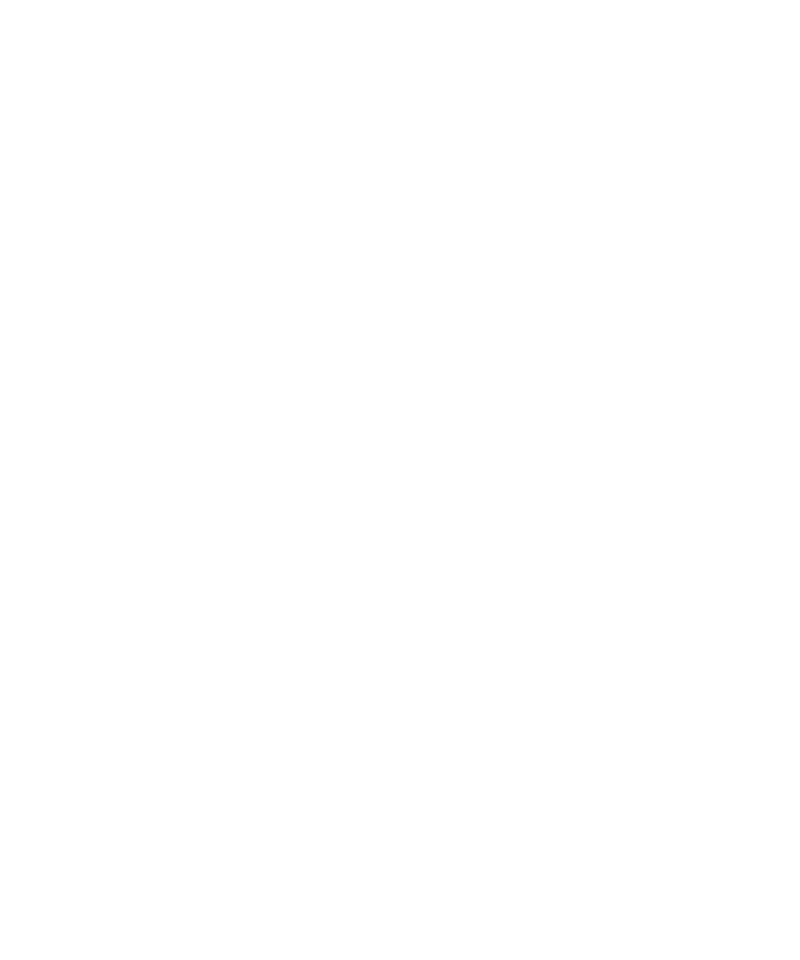

The fitted diffusion coefficient D0 is:  1.920e+06   A^2S-1


<IPython.core.display.Javascript object>


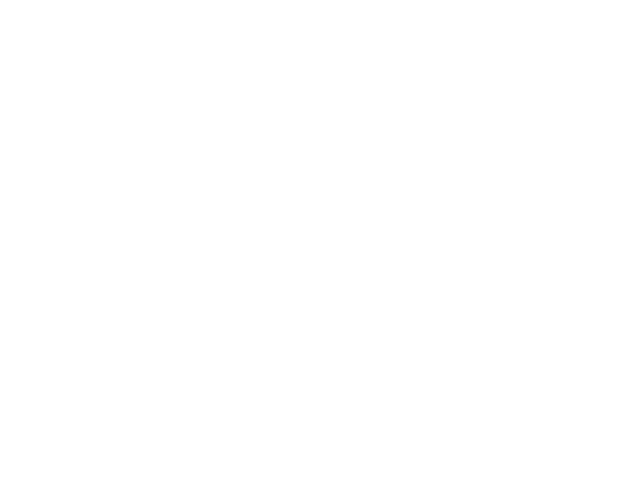

100%|██████████| 16/16 [00:07<00:00,  1.90it/s]

Total time: 7.286 sec


<IPython.core.display.Javascript object>


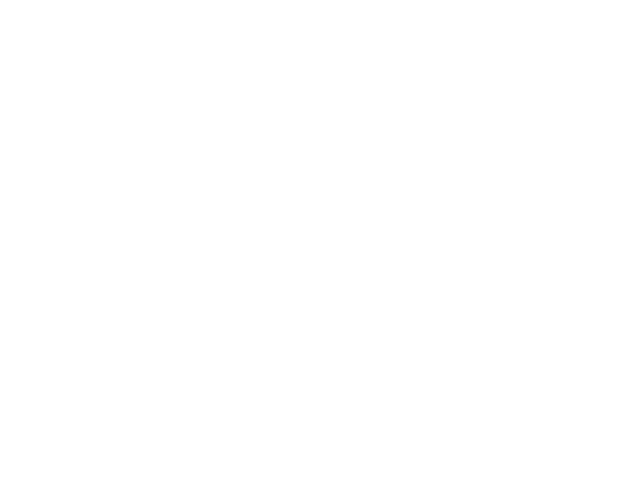

Total time: 0.055 sec
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/ with filename as uid=2d7330_fra_5_500_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/uid=2d7330_fra_5_500_g2b_fit_paras.csv
The fitted diffusion coefficient D0 is:  1.619e+06   A^2S-1


<IPython.core.display.Javascript object>


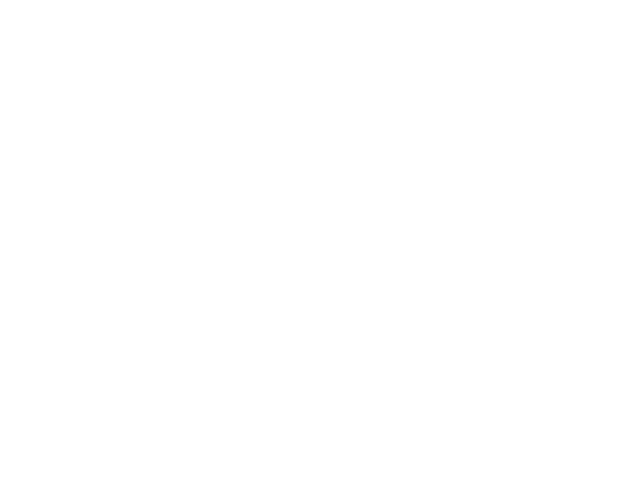

<IPython.core.display.Javascript object>


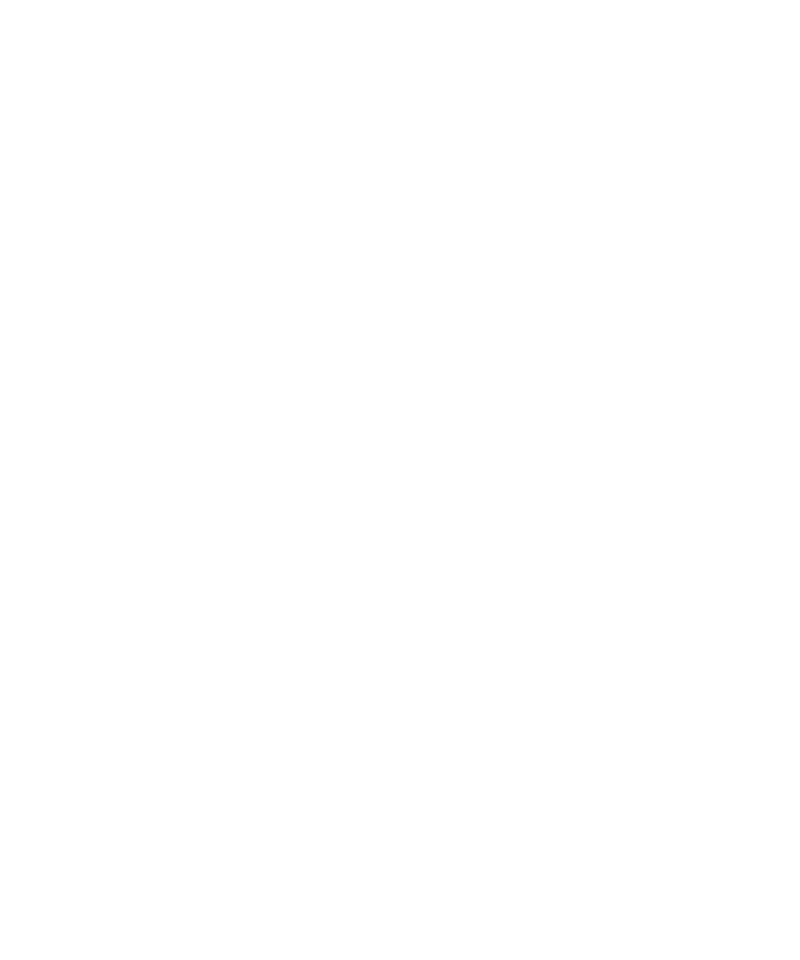

<IPython.core.display.Javascript object>


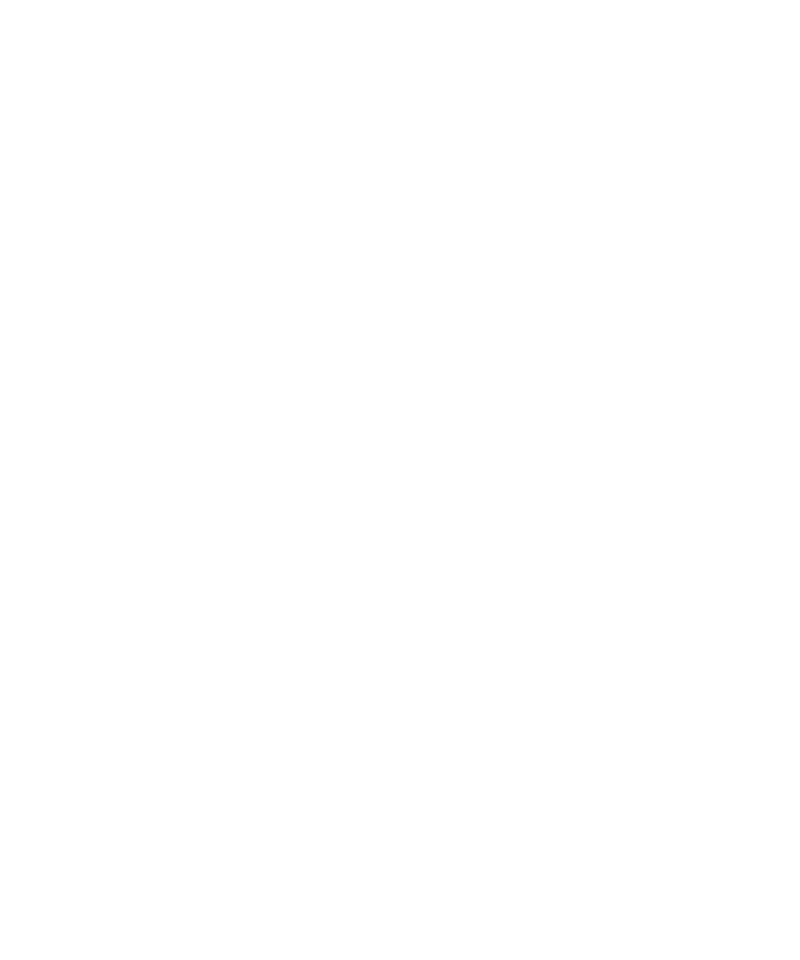

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/2d7330ca/ with filename as uid=2d7330ca-5ec6-4cd8-864c-bb721c1d4778_Res.h5
/XF11ID/analysis/2017_1/ajain/Results/2d7330ca/ 2d7330 /XF11ID/analysis/2017_1/ajain/Results/ XPCS_Analysis_Report_for_uid=2d7330ca_test2.pdf ajain

****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/XPCS_Analysis_Report_for_uid=2d7330ca_test2.pdf
****************************************
The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Analysis PDF Report and with the attachments
Total time: 11.707 min


In [485]:
do_loop =  True #False

if do_loop:
    multi_res = {}
    t0 = time.time()
    for uid in guids:
        multi_res[uid] = run_xpcs_xsvs_single( uid, run_pargs= run_pargs, return_res= True )
    run_time(t0)    

### For Load results

In [486]:
plt.close('all')
do_loop = True #False
if not do_loop:
    multi_res = {}
    for uid, fuid in zip(guids,fuids):
        multi_res[uid] =  extract_xpcs_results_from_h5( filename = 'uid=%s_Res.h5'%fuid, import_dir = data_dir0 + uid +'/' )

# Get and Plot Averaged Data

In [487]:
multi_res.keys()

dict_keys(['b5f86aa9', '59f7d3c5', '933472a7', '869a12eb', '9fd0814c', '675344e3', '3e13b812', '2d7330ca', '8eaa5819', '55fced8f'])

In [488]:
bad_uids  = [   ] # put bad uids string inside the list []
for k in bad_uids:
    x= multi_res.pop( k )

In [489]:
#multi_res.pop( '3faefacf'   )

In [490]:
multi_res.keys()

dict_keys(['b5f86aa9', '59f7d3c5', '933472a7', '869a12eb', '9fd0814c', '675344e3', '3e13b812', '2d7330ca', '8eaa5819', '55fced8f'])

In [491]:
mkeys = list(multi_res.keys())
print(mkeys)
print( multi_res[mkeys[0]].keys())

['b5f86aa9', '59f7d3c5', '933472a7', '869a12eb', '9fd0814c', '675344e3', '3e13b812', '2d7330ca', '8eaa5819', '55fced8f']
dict_keys(['g2', 'g2b', 'imgsum', 'qval_dict', 'avg_img', 'taus', 'roi_mask', 'md', 'times_roi', 'mean_int_sets', 'qt', 'g12b', 'iqst', 'mask', 'tausb', 'q_saxs', 'bad_frame_list', 'wat', 'iq_saxs'])


In [492]:
md = multi_res[mkeys[0]]['md']
uid = uid_average
setup_pargs['uid'] = uid

In [493]:
avg_img = get_averaged_data_from_multi_res(  multi_res, keystr='avg_img' )
imgsum =  get_averaged_data_from_multi_res(  multi_res, keystr='imgsum' )
if scat_geometry == 'saxs':
    q_saxs = get_averaged_data_from_multi_res(  multi_res, keystr='q_saxs')
    iq_saxs = get_averaged_data_from_multi_res(  multi_res, keystr='iq_saxs')
    qt = get_averaged_data_from_multi_res(  multi_res, keystr='qt')
    iqst = get_averaged_data_from_multi_res(  multi_res, keystr='iqst')
elif scat_geometry == 'gi_saxs':
    qr_1d_pds = get_averaged_data_from_multi_res(  multi_res, keystr='qr_1d_pds')
    qr_1d_pds = trans_data_to_pd( qr_1d_pds, label= qr_1d_pds_label)
if run_waterfall: 
    wat = get_averaged_data_from_multi_res(  multi_res, keystr='wat')
if run_t_ROI_Inten:
    times_roi = get_averaged_data_from_multi_res(  multi_res, keystr='times_roi')
    mean_int_sets = get_averaged_data_from_multi_res(  multi_res, keystr='mean_int_sets')

if run_one_time:    
    
    g2 = get_averaged_data_from_multi_res(  multi_res, keystr='g2' )
    taus = get_averaged_data_from_multi_res(  multi_res, keystr='taus' )
    
    g2_pds = save_g2_general( g2, taus=taus,qr=np.array( list( qval_dict.values() ) )[:,0],
                             uid= uid +'_g2.csv', path= data_dir, return_res=True )
    g2_fit_result, taus_fit, g2_fit = get_g2_fit_general( g2,  taus, 
        function = fit_g2_func,  vlim=[0.95, 1.05], fit_range= None,  
        fit_variables={'baseline':True, 'beta':True, 'alpha':False,'relaxation_rate':True},
        guess_values={'baseline':1.0,'beta':0.05,'alpha':1.0,'relaxation_rate':0.01,}) 
    g2_fit_paras = save_g2_fit_para_tocsv(g2_fit_result,  filename= uid  +'_g2_fit_paras.csv', path=data_dir ) 
    
if run_two_time:
    g12b = get_averaged_data_from_multi_res(  multi_res, keystr='g12b',different_length= True )
    g2b = get_averaged_data_from_multi_res(  multi_res, keystr='g2b' )
    tausb = get_averaged_data_from_multi_res(  multi_res, keystr='tausb' )
    
    g2b_pds = save_g2_general( g2b, taus=tausb, qr= np.array( list( qval_dict.values() ) )[:,0],
                              qz=None, uid=uid +'_g2b.csv', path= data_dir, return_res=True )
    g2_fit_resultb, taus_fitb, g2_fitb = get_g2_fit_general( g2b,  tausb, 
        function = fit_g2_func,  vlim=[0.95, 1.05], fit_range= None,  
        fit_variables={'baseline':True, 'beta':True, 'alpha':False,'relaxation_rate':True},                                  
        guess_values={'baseline':1.0,'beta':0.05,'alpha':1.0,'relaxation_rate':0.01,}) 
    
    g2b_fit_paras = save_g2_fit_para_tocsv(g2_fit_resultb, 
                    filename= uid  + '_g2b_fit_paras.csv', path=data_dir )

if run_four_time:
    g4 = get_averaged_data_from_multi_res(  multi_res, keystr='g4' )
    taus4 = get_averaged_data_from_multi_res(  multi_res, keystr='taus4' )        
    g4_pds = save_g2_general( g4, taus=taus4, qr=np.array( list( qval_dict.values() ) )[:,0],
                                     qz=None, uid=uid +'_g4.csv', path= data_dir, return_res=True )
    
if run_xsvs:    
    contrast_factorL = get_averaged_data_from_multi_res(  multi_res, keystr='contrast_factorL',different_length=False )
    times_xsvs = get_averaged_data_from_multi_res(  multi_res, keystr='times_xsvs',different_length=False )
    cont_pds = save_arrays( contrast_factorL, label= times_xsvs, filename = '%s_contrast_factorL.csv'%uid,
            path=data_dir,return_res=True )
 

The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/ with filename as uid=IL17_AuNR_05_PNIPAM_T38degC_g2.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/uid=IL17_AuNR_05_PNIPAM_T38degC_g2_fit_paras.csv
The correlation function is saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/ with filename as uid=IL17_AuNR_05_PNIPAM_T38degC_g2b.csv
The g2 fitting parameters are saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/uid=IL17_AuNR_05_PNIPAM_T38degC_g2b_fit_paras.csv


<IPython.core.display.Javascript object>


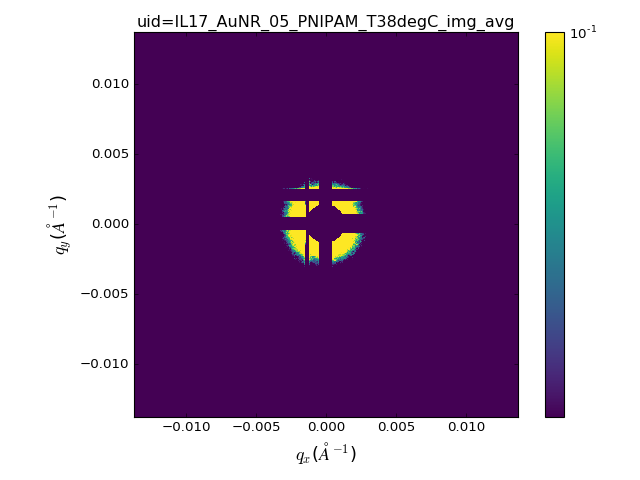

<IPython.core.display.Javascript object>


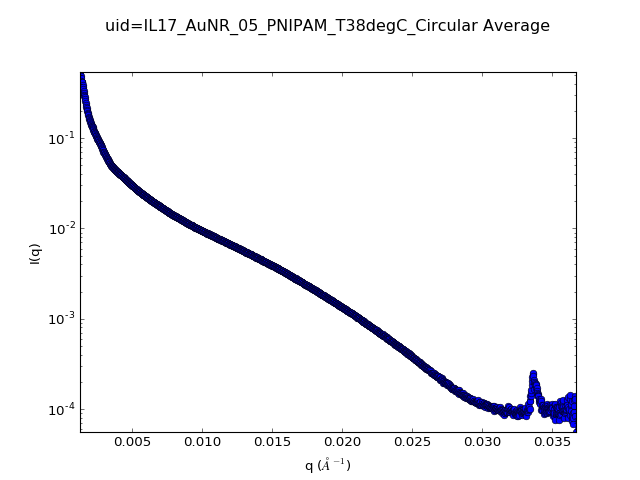

<IPython.core.display.Javascript object>


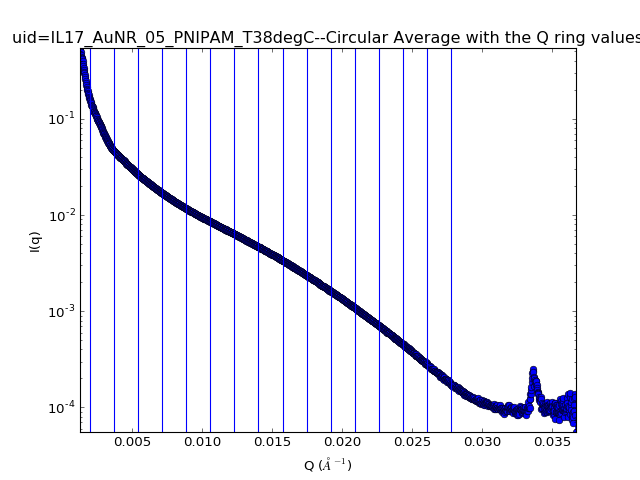

<IPython.core.display.Javascript object>


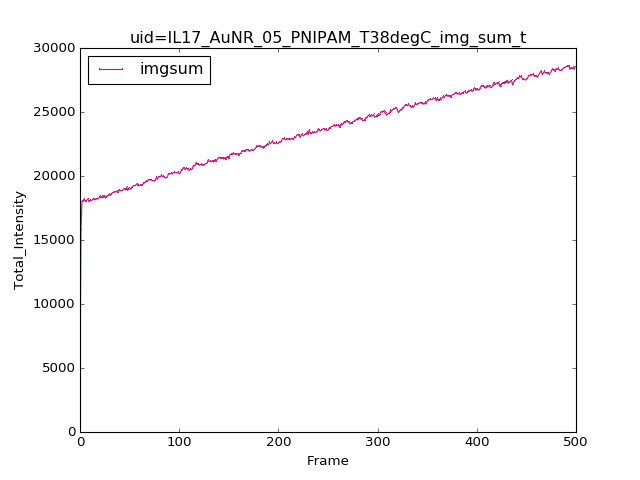

<IPython.core.display.Javascript object>


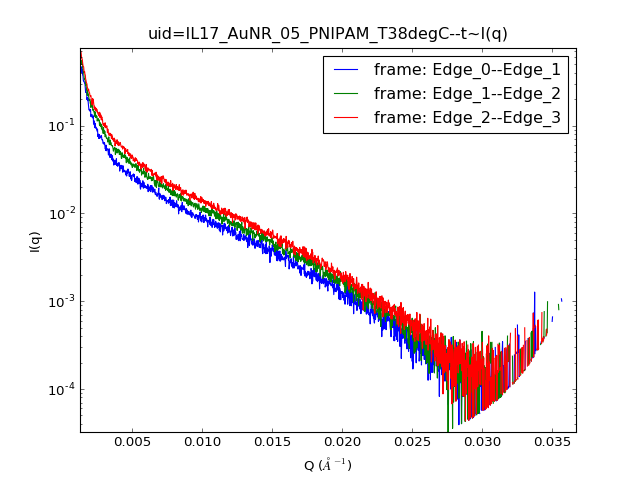

The file: uid=IL17_AuNR_05_PNIPAM_T38degC_q_Iqt is saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/


<IPython.core.display.Javascript object>


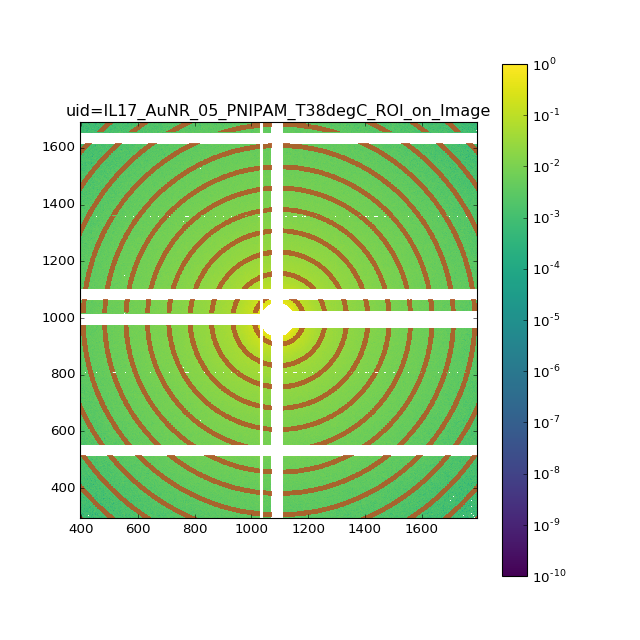

In [494]:
if scat_geometry =='saxs':
    show_saxs_qmap( avg_img, setup_pargs, width=600,vmin=.1, vmax=np.max(avg_img*.1), logs=True,
                   image_name= '%s_img_avg'%uid,  save=True)
    plot_circular_average( q_saxs, iq_saxs, q_saxs,  pargs=setup_pargs, 
                          xlim=[q_saxs.min(), q_saxs.max()], ylim = [iq_saxs.min(), iq_saxs.max()] )
    plot_qIq_with_ROI( q_saxs, iq_saxs, qr, logs=True, uid=uid, xlim=[q_saxs.min(), q_saxs.max()],
                      ylim = [iq_saxs.min(), iq_saxs.max()],  save=True, path=data_dir)
    plot1D( y = imgsum, title ='%s_img_sum_t'%uid, xlabel='Frame', colors='b',
           ylabel='Total_Intensity', legend='imgsum', save=True, path=data_dir)
    plot_t_iqc( qt, iqst, frame_edge=None, pargs=setup_pargs, xlim=[qt.min(), qt.max()],
               ylim = [iqst.min(), iqst.max()], save=True )
    show_ROI_on_image( avg_img, roi_mask, center, label_on = False, rwidth =700, alpha=.9,  
                 save=True, path=data_dir, uid=uid, vmin= np.min(avg_img), vmax= np.max(avg_img) )
    
elif scat_geometry =='gi_saxs':    
    show_img( avg_img,  vmin=.1, vmax=np.max(avg_img*.1), logs=True,image_name= uidstr + '_img_avg',  save=True, path=data_dir) 
    plot_qr_1d_with_ROI( qr_1d_pds, qr_center=np.unique( np.array(list( qval_dict.values() ) )[:,0] ),
                    loglog=False, save=True, uid=uidstr, path = data_dir)
    show_qzr_roi( avg_img, roi_mask, inc_x0, ticks, alpha=0.5, save=True, path=data_dir, uid=uidstr )


<IPython.core.display.Javascript object>


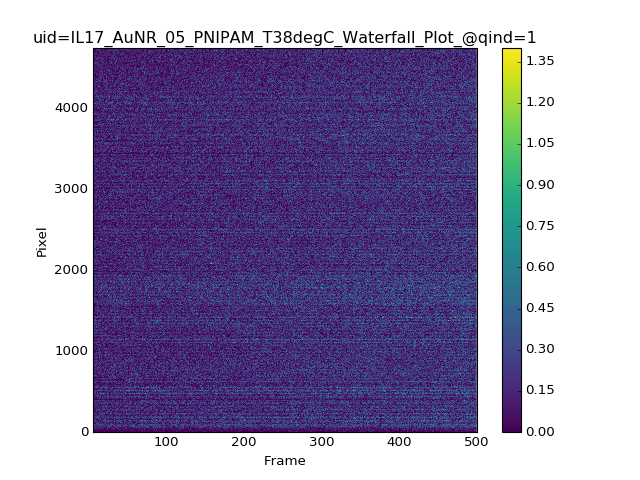

<IPython.core.display.Javascript object>


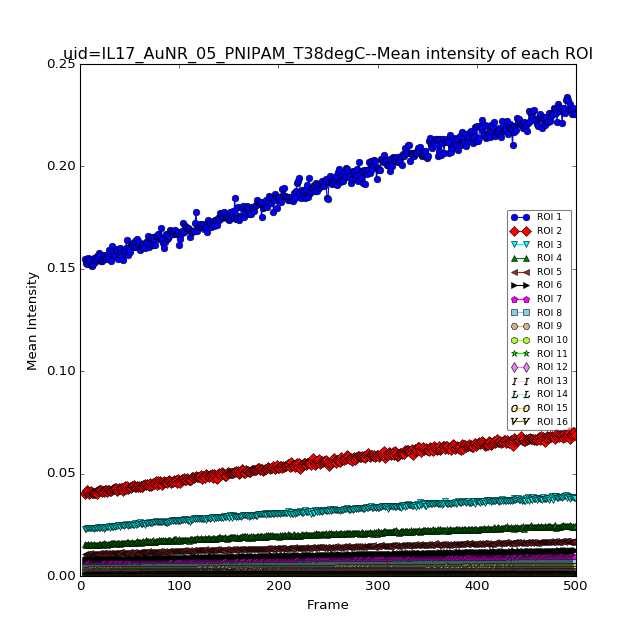

The file: uid=IL17_AuNR_05_PNIPAM_T38degC_t_ROIs is saved in /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/


In [495]:
if run_waterfall: 
    plot_waterfallc( wat, qth_interest, aspect=None,vmax= np.max(wat), uid=uid, save =True, 
                    path=data_dir, beg= good_start)
if run_t_ROI_Inten:
    plot_each_ring_mean_intensityc( times_roi, mean_int_sets,  uid = uid, save=True, path=data_dir )        
      

<IPython.core.display.Javascript object>


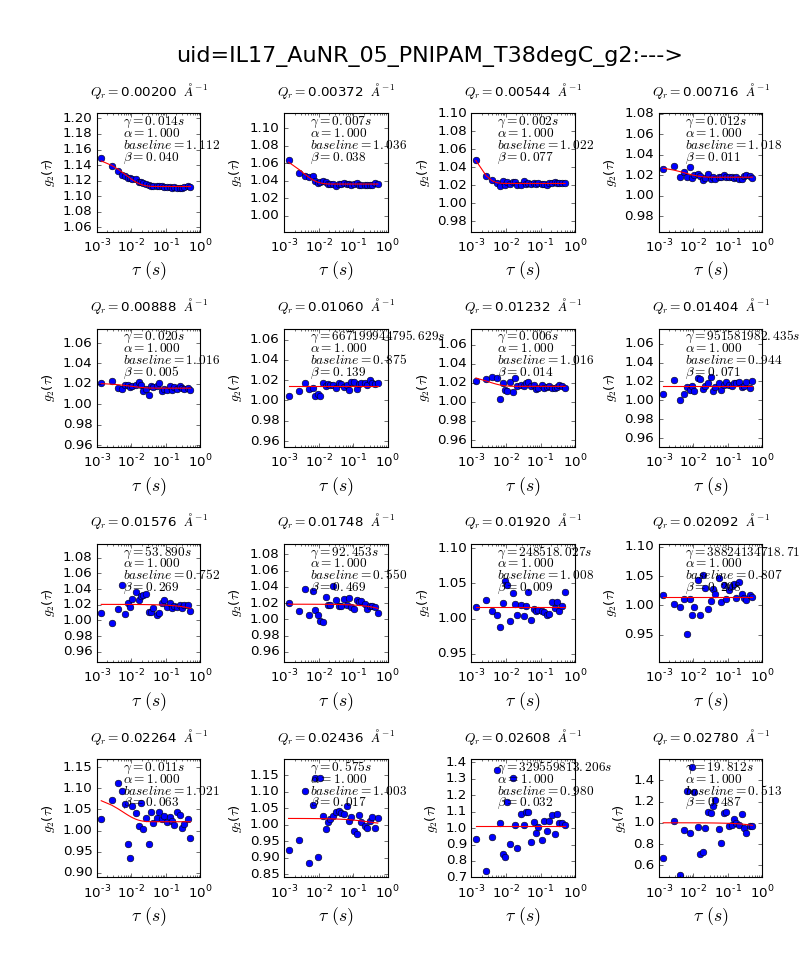

The fitted diffusion coefficient D0 is:  4.224e+04   A^2S-1


<IPython.core.display.Javascript object>


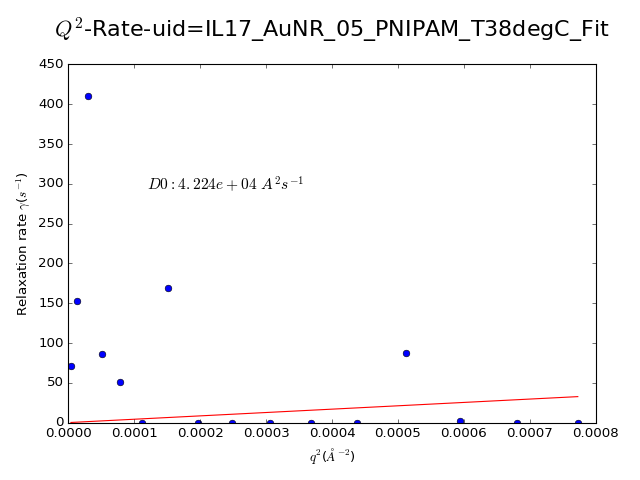

In [496]:
if run_one_time:    
    plot_g2_general( g2_dict={1:g2, 2:g2_fit}, taus_dict={1:taus, 2:taus_fit},vlim=[0.95, 1.05],
        qval_dict = qval_dict, fit_res= g2_fit_result,  geometry= scat_geometry,filename= uid +'_g2', 
            path= data_dir, function= fit_g2_func,  ylabel='g2', append_name=  '_fit')

    D0, qrate_fit_res = get_q_rate_fit_general(  qval_dict, g2_fit_paras['relaxation_rate'], geometry= scat_geometry )
    plot_q_rate_fit_general( qval_dict, g2_fit_paras['relaxation_rate'],  qrate_fit_res, 
                    geometry= scat_geometry,uid=uid, path= data_dir )
    
 

<IPython.core.display.Javascript object>


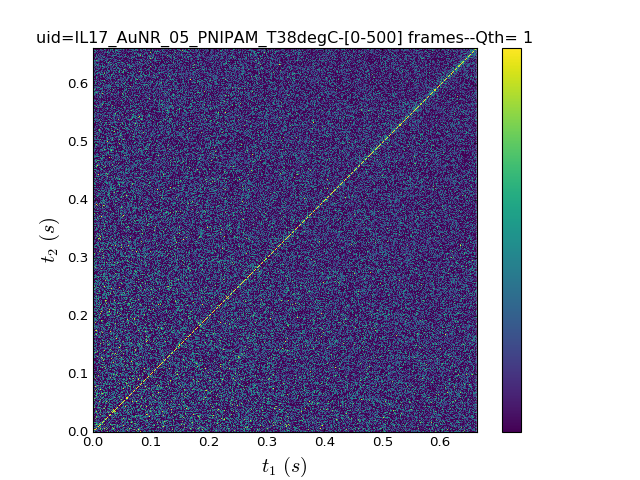

<IPython.core.display.Javascript object>


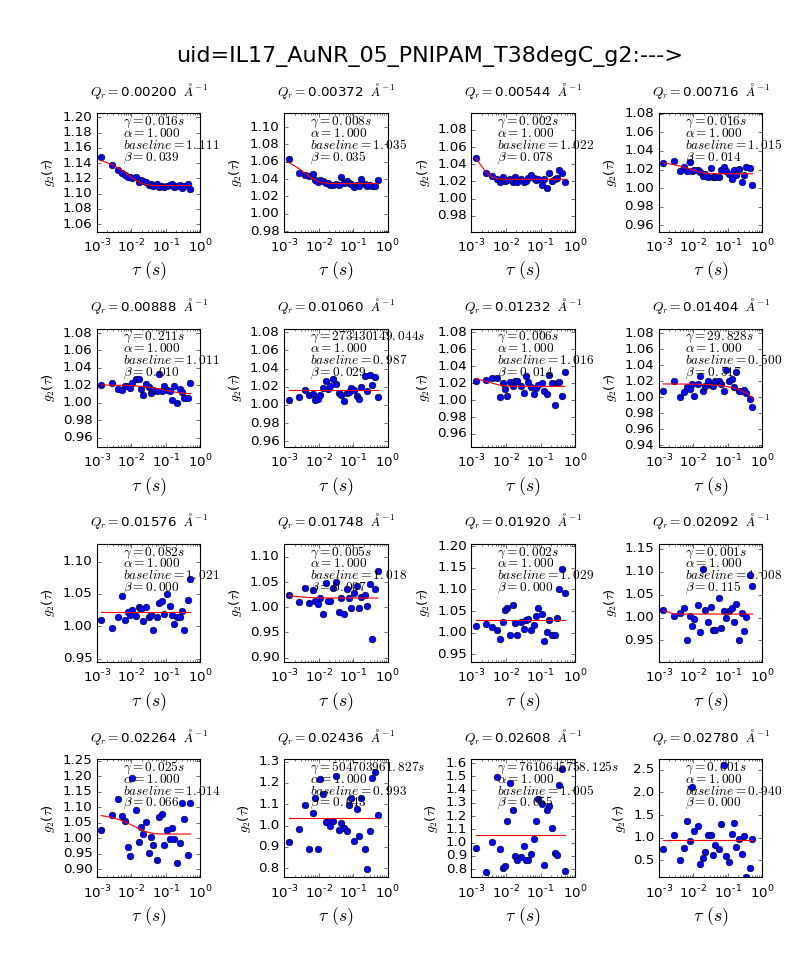

In [497]:
if run_two_time:    
    show_C12(g12b, q_ind= qth_interest, N1= 0, N2=min( len(imgsa) ,1000), vmin=1.01, vmax=1.25,
                 timeperframe=timeperframe,save=True,
                 path= data_dir, uid = uid ) 
    plot_g2_general( g2_dict={1:g2b, 2:g2_fitb}, taus_dict={1:tausb, 2:taus_fitb},vlim=[0.95, 1.05],
                qval_dict=qval_dict, fit_res= g2_fit_resultb,  geometry=scat_geometry,filename=uid+'_g2', 
                    path= data_dir, function= fit_g2_func,  ylabel='g2', append_name=  '_b_fit')


<IPython.core.display.Javascript object>


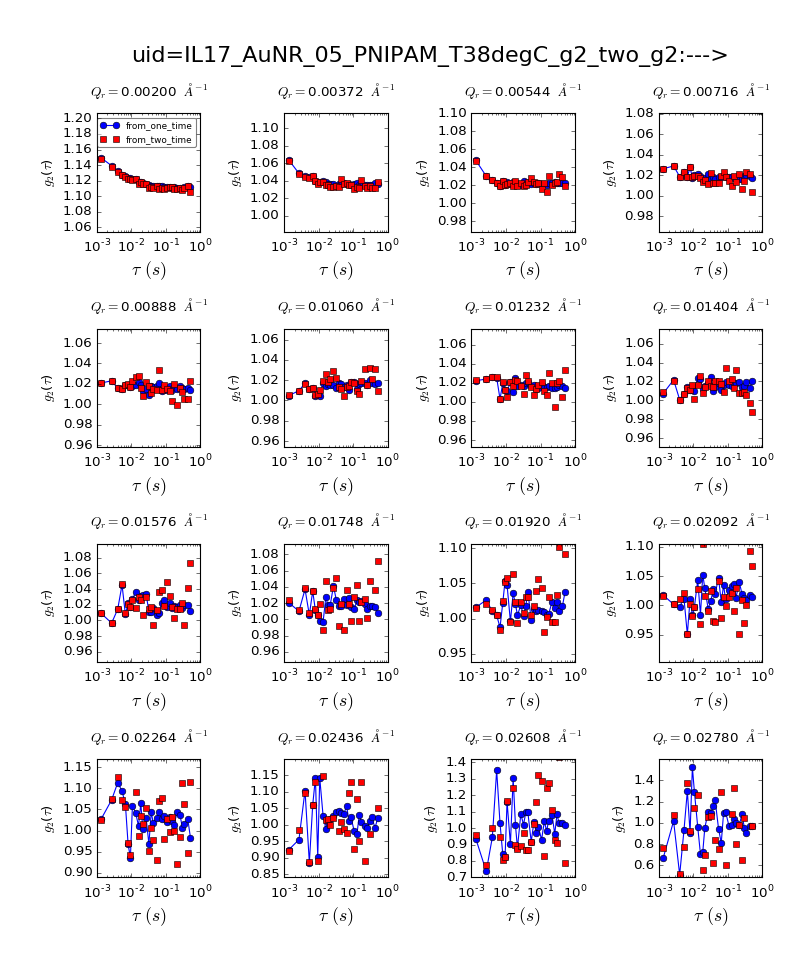

In [498]:
if run_two_time and run_one_time:
    plot_g2_general( g2_dict={1:g2, 2:g2b}, taus_dict={1:taus, 2:tausb},vlim=[0.95, 1.05],
                qval_dict=qval_dict, g2_labels=['from_one_time', 'from_two_time'],
            geometry=scat_geometry,filename=uid+'_g2_two_g2', path= data_dir, ylabel='g2', )
if run_four_time:
    plot_g2_general( g2_dict={1:g4}, taus_dict={1:taus4},vlim=[0.95, 1.05], qval_dict=qval_dict, fit_res= None, 
                        geometry=scat_geometry,filename=uid+'_g4',path= data_dir,   ylabel='g4')

In [499]:
if run_xsvs:
    plot_g2_contrast( contrast_factorL, g2, times_xsvs, taus, qr, 
                     vlim=[0.8,2.0], qth = qth_interest, uid=uid,path = data_dir, legend_size=14)
    plot_g2_contrast( contrast_factorL, g2, times_xsvs, taus, qr, 
                     vlim=[0.8,1.2], qth = None, uid=uid,path = data_dir, legend_size=4)

## Export Results to a h5 files

In [500]:
md['uid'] = uid
md['suid'] = uid
md['Measurement'] = uid
md['beg'] = None
md['end'] = None
md['bad_frame_list'] = 'unknown'
md['metadata_file'] = data_dir + 'md.csv-&-md.pkl'
psave_obj(  md, data_dir + '%s_md'%uid ) #save the setup parameters
save_dict_csv( md,  data_dir + '%s_md.csv'%uid, 'w')

Exdt = {} 
if scat_geometry == 'gi_saxs':  
    for k,v in zip( ['md', 'roi_mask','qval_dict','avg_img','mask','pixel_mask', 'imgsum',  'qr_1d_pds'], 
                [md,    roi_mask, qval_dict, avg_img,mask,pixel_mask, imgsum,  qr_1d_pds] ):
        Exdt[ k ] = v
elif scat_geometry == 'saxs': 
    for k,v in zip( ['md', 'q_saxs', 'iq_saxs','iqst','qt','roi_mask','qval_dict','avg_img','mask','pixel_mask', 'imgsum', 'bad_frame_list'], 
                [md, q_saxs, iq_saxs, iqst, qt,roi_mask, qval_dict, avg_img,mask,pixel_mask, imgsum, ] ):
        Exdt[ k ] = v

if run_waterfall:Exdt['wat'] =  wat
if run_t_ROI_Inten:Exdt['times_roi'] = times_roi;Exdt['mean_int_sets']=mean_int_sets
if run_one_time:
    for k,v in zip( ['taus','g2','g2_fit_paras'], [taus,g2,g2_fit_paras] ):Exdt[ k ] = v
if run_two_time:
    for k,v in zip( ['tausb','g2b','g2b_fit_paras', 'g12b'], [tausb,g2b,g2b_fit_paras,g12b] ):Exdt[ k ] = v
if run_four_time:
    for k,v in zip( ['taus4','g4'], [taus4,g4] ):Exdt[ k ] = v
if run_xsvs:
    for k,v in zip( ['spec_kmean','spec_pds','times_xsvs','spec_km_pds','contrast_factorL'], 
                   [ spec_kmean,spec_pds,times_xsvs,spec_km_pds,contrast_factorL] ):Exdt[ k ] = v 

In [501]:
if run_xsvs:
    contr_pds = save_arrays( Exdt['contrast_factorL'], label= Exdt['times_xsvs'],
                       filename = '%s_contr.csv'%uid, path=data_dir,return_res=True )

In [502]:
export_xpcs_results_to_h5( uid + '_Res.h5', data_dir, export_dict = Exdt )
#extract_dict = extract_xpcs_results_from_h5( filename = uid + '_Res.h5', import_dir = data_dir )

The xpcs analysis results are exported to /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/ with filename as uid=IL17_AuNR_05_PNIPAM_T38degC_Res.h5


## Create PDF report for each uid

In [503]:
pdf_out_dir = data_dir
pdf_filename = "XPCS_Analysis_Report_for_%s%s.pdf"%(uid_average,pdf_version)
if run_xsvs:
    pdf_filename = "XPCS_XSVS_Analysis_Report_for_%s%s.pdf"%(uid_average,pdf_version)

In [504]:
#%run /XF11ID/analysis/Analysis_Pipelines/Develop/chxanalys/chxanalys/Create_Report.py

In [505]:
make_pdf_report( data_dir, uid_average, pdf_out_dir, pdf_filename, username, 
                    run_fit_form, run_one_time, run_two_time, run_four_time, run_xsvs, report_type = scat_geometry
                   )


****************************************
The pdf report is created with filename as: /XF11ID/analysis/2017_1/ajain/Results/IL17_AuNR_05_PNIPAM_T38degC/XPCS_Analysis_Report_for_uid=IL17_AuNR_05_PNIPAM_T38degC_1.pdf
****************************************


### Attach each g2 result to the corresponding olog entry

In [506]:
if att_pdf_report:     
    os.environ['HTTPS_PROXY'] = 'https://proxy:8888'
    os.environ['no_proxy'] = 'cs.nsls2.local,localhost,127.0.0.1'
    pname = pdf_out_dir + pdf_filename 
    atch=[  Attachment(open(pname, 'rb')) ] 
    try:
        update_olog_uid( uid= fuids[-1], text='Add XPCS Averaged Analysis PDF Report', attachments= atch )
    except:
        print("I can't attach this PDF: %s due to a duplicated filename. Please give a different PDF file."%pname)

The url=https://logbook.nsls2.bnl.gov/Olog-11-ID/Olog was successfully updated with Add XPCS Averaged Analysis PDF Report and with the attachments


In [507]:
fuids[-1]

'2d7330ca-5ec6-4cd8-864c-bb721c1d4778'

# The End!